In [1]:
import multiprocessing as mp
mp.set_start_method("spawn", force=True)

In [2]:
### automatically refresh the buffer
%load_ext autoreload
%autoreload 2

### solve the auto-complete issue

%config Completer.use_jedi = False
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

### lvl 2 setups (systerm)
import os
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap,LinearSegmentedColormap,BoundaryNorm
import matplotlib.dates as mdates
import geopandas as gpd
from shapely.geometry import Point
from datetime import datetime


## Read dataset: 
- ds_a -- aerosol relateted dataset
- ds_c -- luquid water pathway
- ds_c_h -- resampled cloud height: top height bese height

In [4]:
ds_a = xr.open_mfdataset('/data/ggong/ARM_monthly/ENA/rlproffex1thorC1/*.nc')
# ds_c = xr.open_mfdataset('/data/ggong/ARM_monthly/ENA/mwrret2turnC1/*.nc')
ds_c_h = xr.open_mfdataset('/data/ggong/ARM_monthly/ENA/cloud_height_resample.nc')

full_time = pd.date_range("2016-01-01", "2023-12-31 23:58:00", freq="2min")
ds_a = ds_a.reindex(time=full_time) # 由于ds_a 有缺失数据，补齐ds_a的缺失数据时间轴
ds_mete = xr.open_dataset('/data/ggong/ARM_monthly/ENA/RH_T_VWS_LTS_2min.nc')
ds_vv = xr.open_dataset('/data/ggong/ARM_monthly/ENA/VV_2min_750_850.nc')
ds_vv600 = xr.open_dataset('/data/ggong/ARM_monthly/ENA/VV_2min_600.nc')
V600 = ds_vv600.w_600.values
ds_p = xr.open_dataset('/data/ggong/ARM_monthly/ENA/vdis_qc_rain_rate.nc')
RR   =  ds_p.rain_rate.values

ds_lwp = xr.open_dataset('/data/ggong/ARM_monthly/ENA/ds_lwp_2min_gap10min_nan.nc')
lwp = ds_lwp.phys_lwp.values

ds_mete2 = xr.open_dataset('/data/ggong/ARM_monthly/ENA/RH34_T34_Tsurf_Windsurf_2min.nc')
ds_lts = xr.open_dataset('/data/ggong/ARM_monthly/ENA/LTS_cloud_top_plus.nc')
ds_lts2 = xr.open_dataset('/data/ggong/ARM_monthly/ENA/LTS_cloud_top_plus_2.nc')

In [6]:
df_top = pd.read_csv('/data/ggong/ARM_monthly/ENA/csv_file/df_top.csv')
df_middle = pd.read_csv('/data/ggong/ARM_monthly/ENA/csv_file/df_middle.csv')
df_bottom = pd.read_csv('/data/ggong/ARM_monthly/ENA/csv_file/df_bottom.csv')

In [7]:
fm = ds_a['feature_mask']          # dims: time, height_high
z  = ds_a['height_high']

# —— 直接选取 3 km 以下的层 ——
fm_low = fm.sel(height_high=z[z < 3.0])

# —— 计算逐时刻 Cloud Fraction ——
cf = (fm_low == 21).mean(dim='height_high').values

## Cloud Height / Thickness quality control

In [9]:
# === Step 1–4 (合并版): 单层云 → 派生量 → QC(<8 km) → 云顶温度 → 暖云筛选 ===
import numpy as np
import xarray as xr

# 1) 取单层云的 base/top，并派生 thickness / mean height
clb_km = ds_c_h["cloud_layer_base_height"] / 1000.0
clt_km = ds_c_h["cloud_layer_top_height"]  / 1000.0

valid_layer = (
    np.isfinite(clb_km) & np.isfinite(clt_km) &
    (clb_km >= 0) & (clt_km >= 0)
)
n_layers = valid_layer.sum(dim="layer")                    # 每个时刻有效层数
sel_idx  = valid_layer.astype(int).argmax(dim="layer")     # 有效层的“位置”
sel_idx  = sel_idx.where(n_layers == 1)                    # 只保留单层云，其他 NaN

def take_by_idx(arr_1d, idx_scalar):
    if np.isnan(idx_scalar):
        return np.nan
    return arr_1d[int(idx_scalar)]

clb_1 = xr.apply_ufunc(
    take_by_idx, clb_km, sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True, dask="parallelized",
    output_dtypes=[clb_km.dtype],
).rename("cloud_base_height")

clt_1 = xr.apply_ufunc(
    take_by_idx, clt_km, sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True, dask="parallelized",
    output_dtypes=[clt_km.dtype],
).rename("cloud_top_height")

cloud_thickness = (clt_1 - clb_1).rename("cloud_geometric_thickness")
cloud_mean_h    = ((clt_1 + clb_1) * 0.5).rename("cloud_mean_height")

# 2) QC：base/top < 8 km
qc_mask = (clb_1 < 8.0) & (clt_1 < 8.0)

clb_qc = clb_1.where(qc_mask)
clt_qc = clt_1.where(qc_mask)
thk_qc = cloud_thickness.where(qc_mask)
mhn_qc = cloud_mean_h.where(qc_mask)

# 3) 计算云顶温度（按云顶高度在 ds_a 的 height_high 上做“最近邻”索引；全向量化）
heights = ds_a["height_high"].values              # (H,)
cth     = clt_qc.values                           # (T,)

T = len(cth)
idx = np.full(T, np.nan, dtype=float)

mask_cth = np.isfinite(cth)
# 对每个有效时刻，找与云顶高度最接近的垂直层索引
idx[mask_cth] = np.abs(heights[np.newaxis, :] - cth[mask_cth, np.newaxis]).argmin(axis=1).astype(float)

# 根据 idx 取出温度
temp2d   = ds_a["temperature"].values            # (T, H)
temp_cth = np.full(T, np.nan, dtype=np.float32)
valid_idx = ~np.isnan(idx)
temp_cth[valid_idx] = temp2d[np.arange(T)[valid_idx], idx[valid_idx].astype(int)]

temperature_at_cth = xr.DataArray(
    temp_cth, coords={"time": clt_qc.time}, dims="time", name="temperature_at_cth"
)

# 4) 组装数据集并进行“暖云”筛选
ds_cloud_heights = xr.Dataset(
    {
        "cloud_base_height": clb_qc,
        "cloud_top_height": clt_qc,
        "cloud_geometric_thickness": thk_qc,
        "cloud_mean_height": mhn_qc,
        "temperature_at_cth": temperature_at_cth,
    }
)

T_WARM = 273.15
warm_mask = ds_cloud_heights["temperature_at_cth"] > T_WARM
ds_cloud_heights = ds_cloud_heights.where(warm_mask)


## Dust Height / Thickness quality control

In [59]:
# ===== 参数 =====
valid_classes = [3, 9, 21, 37]   
aerosol_class = 3
cloud_class = 21

dep_m  = 0.0049
dep_d  = 0.31
dep_nd = 0.15
T_K_WARM = 273.15

hmin_km, hmax_km = 0.03, 8.0

# ====================== QC ======================
mask_qc = (ds_a["detection_confidence_score_total"] >= 0.3) & (ds_a["qc_profile"] == 0)

feature_mask = ds_a["feature_mask"].where(mask_qc)
pdr_meas     = ds_a["depolarization_ratio"].where(mask_qc)
ext          = ds_a["extinction_be"].where(mask_qc)
sca          = ds_a["scattering_ratio_e"].where(mask_qc)
temp_qc      = ds_a["temperature"].where(mask_qc)

# ====================== keep valid class ======================
mask_class = xr.zeros_like(feature_mask, dtype=bool)
for val in valid_classes:
    mask_class = mask_class | (feature_mask == val)

feature_mask = feature_mask.where(mask_class)
pdr_meas     = pdr_meas.where(mask_class)
ext          = ext.where(mask_class)
sca          = sca.where(mask_class)
temp_qc      = temp_qc.where(mask_class)  

# ====================== height limitation > 30 m ======================
mask_height = (ds_a["height_high"] >= hmin_km) & (ds_a["height_high"] <= hmax_km)
feature_mask = feature_mask.where(mask_height)
pdr_meas     = pdr_meas.where(mask_height)
ext          = ext.where(mask_height)
sca          = sca.where(mask_height)
temp_qc      = temp_qc.where(mask_height)

# ====================== aerosol-only mask ======================
aerosol_mask = feature_mask == aerosol_class
pdr_meas_aerosol = pdr_meas.where(aerosol_mask)
sca_aerosol      = sca.where(aerosol_mask)
ext_aerosol      = ext.where(aerosol_mask)

# ====================== cloud-only mask and cloud extinction ======================
cloud_mask_warm = (feature_mask == cloud_class) & (temp_qc >= T_K_WARM)
ext_cloud = ext.where(cloud_mask_warm)                 
ext_cloud = ext_cloud.where(ext_cloud > 0)           

# 发现有极大值，超过30000，非常不符合常理，因此设置阈值
# ---- 云：阈值 20 km^-1 ----
ext_cloud = ext_cloud.where(ext_cloud <= 20)

# ====================== calculate PDR ======================
tepo = sca_aerosol + (sca_aerosol * dep_m) - dep_m
xnum = tepo * pdr_meas_aerosol - dep_m
xden = sca_aerosol - 1 + (sca_aerosol * dep_m) - pdr_meas_aerosol
pdr = xnum / xden

# ====================== calculate dust fraction ======================
dust_frac = ((pdr - dep_nd) * (1 + dep_d)) / ((dep_d - dep_nd) * (1 + pdr))
dust_frac = dust_frac.where(pdr < dep_d, 1.0)
dust_frac = dust_frac.where(pdr > dep_nd, 0.0)
dust_frac = dust_frac.where(aerosol_mask)

# ====================== dust / non-dust extinction ======================
ext_dust    = (dust_frac * ext_aerosol)
ext_nondust = (1 - dust_frac) * ext_aerosol

# 再保险 clip 一下，避免少数极端值：
ext_dust    = ext_dust.clip(min=0).where(ext_dust <= 1)
ext_nondust = ext_nondust.clip(min=0).where(ext_nondust <= 1)

# 发现有极大值，超过30000，非常不符合常理，因此设置阈值
# ---- 气溶胶相关：阈值 1 km^-1 ----
ext_aerosol  = ext_aerosol.where(ext_aerosol <= 1)
ext_dust     = ext_dust.where(ext_dust <= 1)
ext_nondust  = ext_nondust.where(ext_nondust <= 1)


# ====================== column AOD / COD ======================
ext_units = (ext.attrs.get("units","") or "").replace(" ","").lower()
if any(u in ext_units for u in ["m-1", "1/m", "m^-1", "/m"]):
    z_int = ds_a["height_high"] * 1000.0   # m
else:
    z_int = ds_a["height_high"]            # km

dz  = xr.concat([z_int.isel(height_high=0), z_int.diff("height_high")], dim="height_high")
dz2d = xr.DataArray(dz, dims=["height_high"], coords={"height_high": ds_a["height_high"]}).broadcast_like(ext)

AOD         = (ext_aerosol.clip(min=0) * dz2d).sum(dim="height_high")
dust_AOD    = (ext_dust * dz2d).sum(dim="height_high")
nondust_AOD = (ext_nondust * dz2d).sum(dim="height_high")

COD = (ext_cloud * dz2d).sum(dim="height_high")


In [11]:
# ===================================================================
# =============== 主尘层识别 + 高度特征计算（dust_*） ================
# ===================================================================

# 高度坐标（km）
z = ds_a["height_high"].values.astype(float)

# 相邻层厚（km），用于积分权重
dz_km = np.empty_like(z, dtype=float)
if len(z) < 2:
    raise ValueError("height_high 维度长度不足，无法计算 dz")
dz_km[0]  = (z[1] - z[0])
dz_km[1:] = np.diff(z)

# 只保留正的 dust extinction；NaN 保留为缺测
dust_ext = xr.where(ext_dust > 0, ext_dust, np.nan)
dust_mask_arr = xr.where(ext_dust > 0, True, False).fillna(False).values  # (time, height)
dust_ext_arr  = dust_ext.values                                           # (time, height)

T, H = dust_mask_arr.shape

base_km  = np.full(T, np.nan, dtype=float)  # dust_base_height
top_km   = np.full(T, np.nan, dtype=float)  # dust_top_height
mean_km  = np.full(T, np.nan, dtype=float)  # dust_mean_height = (base+top)/2
scale_km = np.full(T, np.nan, dtype=float)  # dust_scale_height (e-fold above base)
cent_km  = np.full(T, np.nan, dtype=float)  # dust_centroid_height (ext-weighted)

for t in range(T):
    m = dust_mask_arr[t]   # bool profile
    e = dust_ext_arr[t]    # dust extinction profile

    if not np.any(m):
        continue

    # ---- 找到所有连续 True 的尘层段 ----
    mm = m.astype(int)
    edges  = np.diff(np.concatenate(([0], mm, [0])))
    starts = np.where(edges == 1)[0]
    ends   = np.where(edges == -1)[0] - 1  # inclusive

    if starts.size == 0:
        continue

    # ---- 选“主尘层”：层内 dust AOD（∑ ext_dust * dz_km）最大的段 ----
    best_idx = None
    best_int = -np.inf
    for s, eidx in zip(starts, ends):
        layer_ext = dust_ext_arr[t, s:eidx+1]
        layer_dz  = dz_km[s:eidx+1]
        integ = np.nansum(layer_ext * layer_dz)
        if np.isfinite(integ) and (integ > best_int):
            best_int = integ
            best_idx = (s, eidx)

    if best_idx is None:
        continue

    s, eidx = best_idx
    base_km[t] = z[s]
    top_km[t]  = z[eidx]
    mean_km[t] = 0.5 * (base_km[t] + top_km[t])

    # ---- 质心（主尘层内的 dust extinction 加权）: ∫z*ext*dz / ∫ext*dz ----
    layer_ext = dust_ext_arr[t, s:eidx+1]
    layer_z   = z[s:eidx+1]
    layer_dz  = dz_km[s:eidx+1]

    m_valid = np.isfinite(layer_ext) & (layer_ext > 0)
    if np.count_nonzero(m_valid) > 0:
        num = np.nansum(layer_ext[m_valid] * layer_z[m_valid] * layer_dz[m_valid])
        den = np.nansum(layer_ext[m_valid] *                 layer_dz[m_valid])
        if den > 0 and np.isfinite(num):
            cent_km[t] = num / den

    # ---- 尺度高度：自层底 ext0 衰减到 ext0/e 的高度差（log 空间线性插值）----
    valid0 = np.where(np.isfinite(layer_ext) & (layer_ext > 0))[0]
    if valid0.size == 0:
        continue

    s0 = valid0[0]
    ext0 = layer_ext[s0]
    target = ext0 / np.e
    eps = 1e-12
    found = False

    for k in range(s0, len(layer_ext) - 1):
        y1, y2 = layer_ext[k], layer_ext[k+1]
        if not (np.isfinite(y1) and np.isfinite(y2) and y1 > eps and y2 > eps):
            continue
        if (y1 >= target and y2 <= target) or (y1 <= target and y2 >= target):
            z1, z2   = layer_z[k], layer_z[k+1]
            ly1, ly2 = np.log(y1), np.log(y2)
            ltar     = np.log(target)
            frac = (ltar - ly1) / (ly2 - ly1) if ly2 != ly1 else 0.0
            z_star = z1 + frac * (z2 - z1)
            scale_km[t] = z_star - layer_z[s0]
            found = True
            break

    if not found:
        y_top = layer_ext[-1]
        if np.isfinite(y_top) and y_top > eps and ext0 > eps and (ext0 / y_top) > 1.0:
            scale_km[t] = (layer_z[-1] - layer_z[s0]) / np.log(ext0 / y_top)
        else:
            scale_km[t] = np.nan

# ====================== 打包结果 ======================
time_coord = ds_a["time"]
ds_dust_heights = xr.Dataset(
    data_vars=dict(
        dust_base_height = xr.DataArray(base_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust layer base height (main dust layer)"}),
        dust_top_height  = xr.DataArray(top_km,  coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust layer top height (main dust layer)"}),
        dust_mean_height = xr.DataArray(mean_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Mean dust height μ=(base+top)/2 (main dust layer)"}),
        dust_scale_height= xr.DataArray(scale_km,coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust scale height H (e-fold above base, main dust layer)"}),
        dust_centroid_height = xr.DataArray(cent_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust extinction-weighted centroid height (main dust layer)"}),
    )
)

# （可选）附加层厚 ΔZ
ds_dust_heights["dust_layer_thickness"] = (
    ds_dust_heights["dust_top_height"] - ds_dust_heights["dust_base_height"]
)
ds_dust_heights["dust_layer_thickness"].attrs.update(
    {"units":"km","long_name":"Dust layer thickness ΔZ"}
)


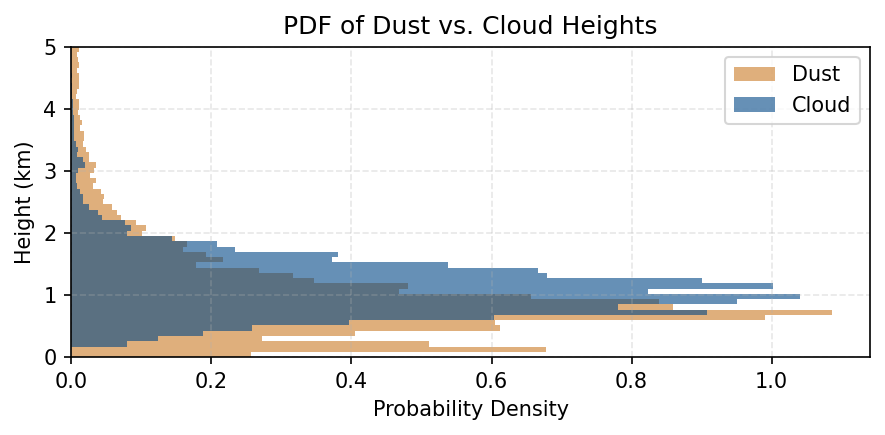

In [12]:
# ===== 数据准备 =====
dust_mean_height  = ds_dust_heights["dust_mean_height"].values
dust_mean_height  = dust_mean_height[np.isfinite(dust_mean_height)]

cloud_mean_height = ds_cloud_heights["cloud_mean_height"].values
cloud_mean_height = cloud_mean_height[np.isfinite(cloud_mean_height)]

bins = np.linspace(0, 5, 60)

# ===== 绘图 =====
fig, ax = plt.subplots(figsize=(6,3), dpi=150)

ax.hist(
    dust_mean_height, bins=bins, density=True, orientation="horizontal",
    alpha=0.6, color="#cb7b25", edgecolor=None, label="Dust"
)
ax.hist(
    cloud_mean_height, bins=bins, density=True, orientation="horizontal",
    alpha=0.6, color="#014686", edgecolor=None, label="Cloud"
)

ax.set_ylabel("Height (km)")
ax.set_xlabel("Probability Density")
ax.set_ylim(0, 5)
ax.set_title("PDF of Dust vs. Cloud Heights")
ax.legend()
ax.grid(alpha=0.3, ls='--')

plt.tight_layout()
plt.show()


## Aerosol-cloud collocation

In [13]:
dust_top_height  = ds_dust_heights["dust_top_height"].values
dust_base_height  = ds_dust_heights["dust_base_height"].values
dust_thickness = ds_dust_heights["dust_layer_thickness"].values
dust_mean_height = ds_dust_heights["dust_mean_height"].values

cloud_top_height  = ds_cloud_heights["cloud_top_height"].values
cloud_base_height  = ds_cloud_heights["cloud_base_height"].values
cloud_thickness = ds_cloud_heights["cloud_geometric_thickness"].values
cloud_mean_height = ds_cloud_heights["cloud_mean_height"].values

### Count the number of times each duration occurs

In [14]:
# 建立 mask: 只在所有都非 NaN 时为 True
valid_mask = (~np.isnan(dust_top_height) &
              ~np.isnan(dust_base_height) &
              ~np.isnan(cloud_top_height) &
              ~np.isnan(cloud_base_height))

# 初始化输出数组（复制一份原始数组）
dust_top_height_new  = dust_top_height.copy()
dust_base_height_new = dust_base_height.copy()
dust_mean_height_new = dust_mean_height.copy()
dust_thickness_new = dust_thickness.copy()

cloud_top_height_new = cloud_top_height.copy()
cloud_base_height_new = cloud_base_height.copy()
cloud_mean_height_new = cloud_mean_height.copy()
cloud_thickness_new = cloud_thickness.copy()

# 把无效位置全部设为 NaN
dust_top_height_new[~valid_mask]  = np.nan
dust_base_height_new[~valid_mask] = np.nan
dust_mean_height_new[~valid_mask]  = np.nan
dust_thickness_new[~valid_mask] = np.nan

cloud_top_height_new[~valid_mask] = np.nan
cloud_base_height_new[~valid_mask] = np.nan
cloud_mean_height_new[~valid_mask] = np.nan
cloud_thickness_new[~valid_mask] = np.nan

In [15]:
import numpy as np

arr = dust_top_height_new  # 你的数组

# 掩膜：True 表示非 NaN
mask = ~np.isnan(arr)

# 找片段边界
diff = np.diff(mask.astype(int))
starts = np.where(diff == 1)[0] + 1
ends   = np.where(diff == -1)[0]

if mask[0]:
    starts = np.r_[0, starts]
if mask[-1]:
    ends = np.r_[ends, len(arr)-1]

# 每个片段的长度
lengths = ends - starts + 1

# 统计
max_len = lengths.max() if len(lengths) > 0 else 0
arr_counts = np.zeros(max_len, dtype=int)

for L in lengths:
    arr_counts[L-1] += 1


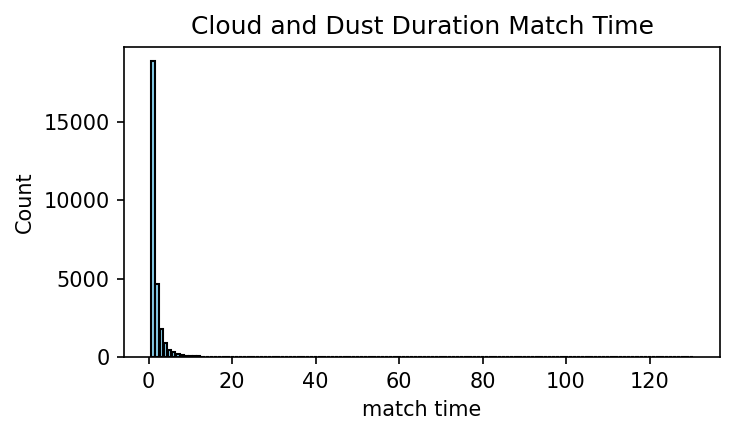

In [16]:
x = np.arange(1, max_len+1)
y = arr_counts

fig, ax = plt.subplots(figsize=(5,3), dpi=150)
ax.bar(x, y, color="skyblue", edgecolor="k")  

ax.set_xlabel("match time")
ax.set_ylabel("Count")
ax.set_title("Cloud and Dust Duration Match Time")

plt.tight_layout()
plt.show()

In [17]:
mask = (~np.isnan(dust_top_height_new) &
        ~np.isnan(dust_base_height_new) &
        ~np.isnan(cloud_top_height_new) &
        ~np.isnan(cloud_base_height_new))

## Criterion: Cloud top height <= 3 km

In [18]:
# === Step 1: 构建统一掩膜，找到事件 ===
mask = (~np.isnan(dust_top_height_new) &
        ~np.isnan(dust_base_height_new) &
        ~np.isnan(cloud_top_height_new) &
        ~np.isnan(cloud_base_height_new))

# 找连续非NaN的段落
diff = np.diff(mask.astype(int))
starts = np.where(diff == 1)[0] + 1
ends   = np.where(diff == -1)[0]
if mask[0]:
    starts = np.r_[0, starts]
if mask[-1]:
    ends = np.r_[ends, len(mask)-1]

# === Step 2: 定义统计结果 ===
categories = {"top": 0, "bottom": 0, "middle": 0, "decreasing": 0, "increasing": 0}

# === Step 3: 遍历每个事件，取平均值并分类 ===
for s, e in zip(starts, ends):
    # 当前事件的平均高度
    d_top = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    # 👉 只统计 c_top <= 3.0 km 的事件
    if c_top > 3.0:
        continue

    # 规则判断
    if d_base - c_top > 0.1:
        categories["top"] += 1
    elif c_base - d_top > 0.1:
        categories["bottom"] += 1
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        categories["middle"] += 1
    elif (c_base - 0.1 < d_top < c_top + 0.1) and (d_base < c_base - 0.1):
        categories["decreasing"] += 1
    elif (c_base - 0.1 < d_base < c_top + 0.1) and (d_top > c_top + 0.1):
        categories["increasing"] += 1

# === Step 4: 输出统计结果 ===
print("事件分类统计：")
for k, v in categories.items():
    print(f"{k}: {v}")

事件分类统计：
top: 7484
bottom: 11334
middle: 7317
decreasing: 585
increasing: 632


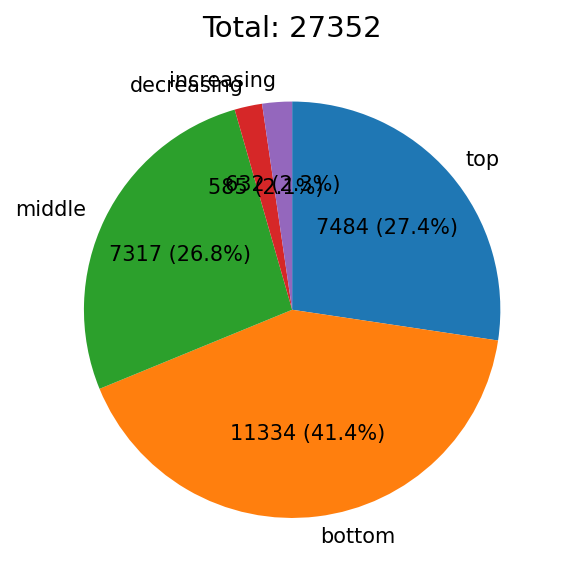

In [19]:
labels = list(categories.keys())
sizes = list(categories.values())
total = sum(sizes)

def make_autopct(sizes):
    def my_autopct(pct):
        count = int(round(pct*total/100.0))
        return f"{count} ({pct:.1f}%)"
    return my_autopct

fig, ax = plt.subplots(figsize=(4,4), dpi=150)
wedges, texts, autotexts = ax.pie(
    sizes,
    labels=labels,
    autopct=make_autopct(sizes),
    startangle=90,
    counterclock=False
)

for text in texts + autotexts:
    text.set_fontsize(10)

ax.set_title(f"Total: {total}", fontsize=14)

plt.tight_layout()
plt.show()



## get the time and height data for run hysplit

In [20]:
import numpy as np
import pandas as pd

# === 时间序列（2 min 分辨率）===
time = pd.date_range("2016-01-01 00:00:00", "2023-12-31 23:58:00", freq="2min")
time = pd.to_datetime(time)

# === 有效数据掩码 ===
mask = (~np.isnan(dust_top_height_new) &
        ~np.isnan(dust_base_height_new) &
        ~np.isnan(cloud_top_height_new) &
        ~np.isnan(cloud_base_height_new))

# === 连续事件起止索引 ===
diff = np.diff(mask.astype(int))
starts = np.where(diff == 1)[0] + 1
ends   = np.where(diff == -1)[0]

if mask[0]:
    starts = np.r_[0, starts]
if mask[-1]:
    ends = np.r_[ends, len(mask) - 1]

# === 结果容器 ===
rows_top, rows_bottom, rows_middle = [], [], []

# === 主循环 ===
for s, e in zip(starts, ends):

    d_top  = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top  = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    # 只保留低云
    if c_top > 3.0:
        continue

    dust_mean_height = (d_base + d_top) / 2.0

    # === 时间均值（纳秒级）→ 四舍五入到整秒 ===
    t_slice = time[s:e+1].to_numpy(dtype="datetime64[ns]").astype("int64")
    t_mean  = pd.to_datetime(int(np.mean(t_slice)), unit="ns").round("1s")

    row = {
        "year":   t_mean.year,
        "month":  t_mean.month,
        "day":    t_mean.day,
        "hour":   t_mean.hour,
        "minute": t_mean.minute,
        "second": t_mean.second,     # ✅ 精确到秒（已 round）
        "dust_mean_height": dust_mean_height
    }

    # === dust–cloud 相对位置分类 ===
    if d_base - c_top > 0.1:
        rows_top.append(row)
    elif c_base - d_top > 0.1:
        rows_bottom.append(row)
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        rows_middle.append(row)

# === 转为 DataFrame ===
df_top    = pd.DataFrame(rows_top)
df_bottom = pd.DataFrame(rows_bottom)
df_middle = pd.DataFrame(rows_middle)

print("Top events:", len(df_top))
print("Bottom events:", len(df_bottom))
print("Middle events:", len(df_middle))
print(df_top.head())


Top events: 7484
Bottom events: 11334
Middle events: 7317
   year  month  day  hour  minute  second  dust_mean_height
0  2016      1    1    22      38       0           1.22625
1  2016      1    8     3      32       0           2.21625
2  2016      1    8     9      10       0           2.12625
3  2016      1    8    11       2       0           1.25625
4  2016      1   10    16      30       0           6.25125


### Violin Plot (mean height and thickness)

In [21]:
import numpy as np

# 类别映射
class_map = {"top": 0, "bottom": 1, "middle": 2, "decreasing": 3, "increasing": 4}
cat_names = list(class_map.keys())

# 初始化标签数组（与原始数据同长度）
labels = np.full(mask.shape, np.nan, dtype=float)
event_counts = {k: 0 for k in class_map.keys()}

# 遍历每个事件段，分类并打标签
for s, e in zip(starts, ends):
    d_top  = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top  = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    if c_top > 3.0:
        continue
        
    cat = None
    if d_base - c_top > 0.1:
        cat = "top"
    elif c_base - d_top > 0.1:
        cat = "bottom"
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        cat = "middle"
    elif (c_base - 0.1 < d_top < c_top + 0.1) and (d_base < c_base - 0.1):
        cat = "decreasing"
    elif (c_base - 0.1 < d_base < c_top + 0.1) and (d_top > c_top + 0.1):
        cat = "increasing"

    if cat is not None:
        labels[s:e+1] = class_map[cat]
        event_counts[cat] += 1


## Lag and ahead condition

In [81]:
# 初始化输出数组（复制一份原始数组）
dust_top_height2  = dust_top_height.copy()
dust_base_height2 = dust_base_height.copy()
dust_mean_height2 = dust_mean_height.copy()
dust_thickness2 = dust_thickness.copy()

cloud_top_height2 = cloud_top_height.copy()
cloud_base_height2 = cloud_base_height.copy()
cloud_mean_height2 = cloud_mean_height.copy()
cloud_thickness2 = cloud_thickness.copy()

In [82]:
import numpy as np, pandas as pd

PAD=20; rel=np.arange(-PAD,PAD+1)
class_map={"top":0,"bottom":1,"middle":2}
vars_dict={"dust_top_height2":dust_top_height2,"dust_base_height2":dust_base_height2,"dust_thickness2":dust_thickness2,
          "cloud_top_height2":cloud_top_height2,"cloud_base_height2":cloud_base_height2,"cloud_thickness2":cloud_thickness2,
          "COD":COD,"dust_AOD":dust_AOD,"lwp":lwp}

labels=np.asarray(labels); N=len(labels)
A={k:np.asarray(v) for k,v in vars_dict.items()}
names=list(A)

def _comp(lbl):
    idx=np.where(labels==lbl)[0]  # ✅ 不用 np.isnan，NaN/None 自动排除
    if idx.size==0: return np.full((rel.size,len(names)),np.nan)
    cut=np.where(np.diff(idx)!=1)[0]; ss=np.r_[idx[0],idx[cut+1]]; ee=np.r_[idx[cut],idx[-1]]
    E=np.full((len(ss),rel.size,len(names)),np.nan,float)
    for i,(s,e) in enumerate(zip(ss.astype(int),ee.astype(int))):
        E[i,PAD,:]=[np.nanmean(A[n][s:e+1]) for n in names]               # lag=0：段内均值
        for k in range(1,PAD+1):
            if s-k>=0: E[i,PAD-k,:]=[A[n][s-k] for n in names]            # lag<0：seg_start 往前取
            if e+k<N:  E[i,PAD+k,:]=[A[n][e+k] for n in names]            # lag>0：seg_end 往后取
    return np.nanmean(E,axis=0)

df_comp=pd.concat({c:pd.DataFrame(_comp(lbl),index=rel,columns=names) for c,lbl in class_map.items()},axis=1)
df_comp.index.name="lag"



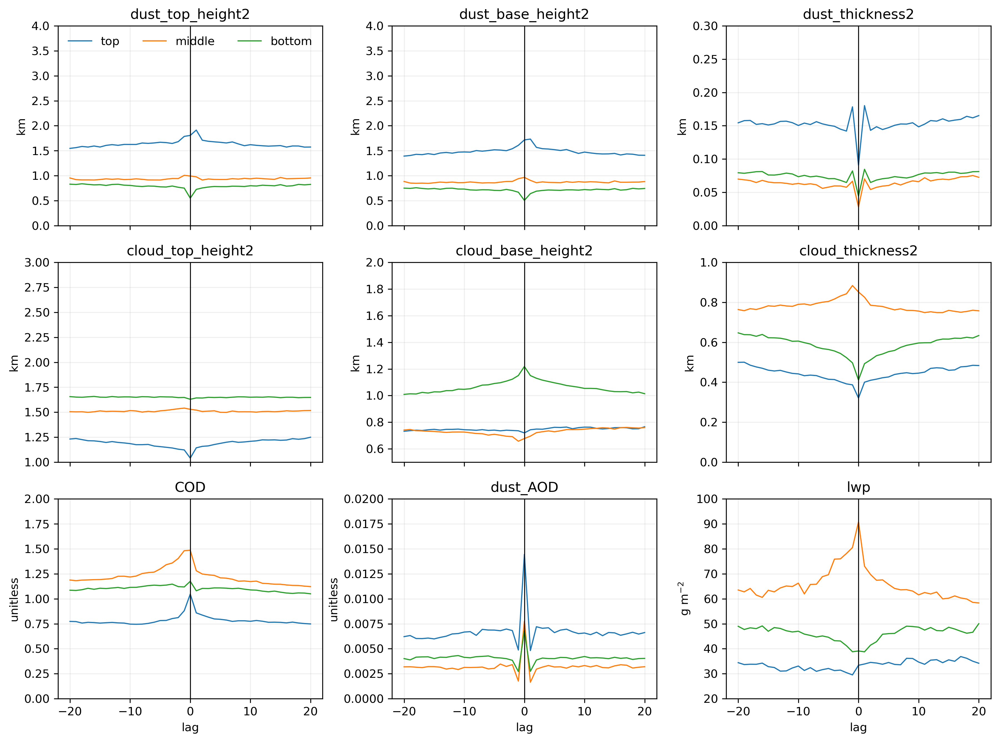

In [85]:
import matplotlib.pyplot as plt

classes = ["top","middle","bottom"]
lag = df_comp.index.values

vars9 = [
    "dust_top_height2", "dust_base_height2", "dust_thickness2",
    "cloud_top_height2","cloud_base_height2","cloud_thickness2",
    "COD","dust_AOD","lwp"
]

units = [
    "km","km","km",
    "km","km","km",
    "unitless","unitless","g m$^{-2}$"
]

ylims = [
    (0.,4.), (0.,4.), (0.,0.3),
    (1.,3.), (0.5,2), (0.,1.),
    (0,2.), (0.,0.02), (20.,100.)
]

fig, axes = plt.subplots(3, 3, figsize=(12, 9), dpi=300, sharex=True)
axes = axes.ravel()

for ax, v, u, yl in zip(axes, vars9, units, ylims):
    for c in classes:
        ax.plot(lag, df_comp[(c, v)], lw=1, label=c)
    ax.axvline(0, lw=0.8, color="k")
    ax.set_title(v)
    ax.set_ylabel(u)
    ax.set_ylim(*yl)
    ax.grid(alpha=0.2)

axes[0].legend(frameon=False, ncol=3)
for ax in axes[6:]:
    ax.set_xlabel("lag")

plt.tight_layout()
plt.show()

In [22]:
def calc_mean_lwc(lwp, thickness_km):

    lwp = np.asarray(lwp, dtype=float)
    thickness_km = np.asarray(thickness_km, dtype=float)

    thickness_m = thickness_km * 1000.0
    lwc = np.divide(lwp, thickness_m, out=np.full_like(lwp, np.nan), where=thickness_m > 0)
    
    return lwc

lwc = calc_mean_lwc(lwp, cloud_thickness_new)

In [23]:
def extract_event_means(labels, values, target_label):

    event_means = []
    current_event = []

    for lab, val in zip(labels, values):
        if lab == target_label:  # 属于目标类别
            current_event.append(val)
        else:  # 事件结束
            if current_event:  
                event_means.append(np.nanmean(current_event))
                current_event = []
    # 最后收尾
    if current_event:
        event_means.append(np.nanmean(current_event))

    return np.array(event_means)

#---------------------------------------------------------#

cloud_mh_by_cat = {}
dust_mh_by_cat  = {}
cloud_tn_by_cat = {}
dust_tn_by_cat = {}

dust_th_by_cat = {}
dust_bh_by_cat = {}
cloud_th_by_cat = {}
cloud_bh_by_cat = {}

COD_by_cat  = {}
DOD_by_cat  = {}
lwp_by_cat  = {}
lwc_by_cat  = {}
RR_by_cat   = {}
cf_by_cat   = {}
re_by_cat   = {}
for name in cat_names:
    
    lab_id = class_map[name]
    
    cloud_mh_by_cat[name] = extract_event_means(labels, cloud_mean_height_new, lab_id)
    dust_mh_by_cat[name]  = extract_event_means(labels, dust_mean_height_new, lab_id)
    cloud_tn_by_cat[name] = extract_event_means(labels, cloud_thickness_new, lab_id)
    dust_tn_by_cat[name]  = extract_event_means(labels, dust_thickness_new, lab_id)

    cloud_th_by_cat[name] = extract_event_means(labels, cloud_top_height_new, lab_id)
    dust_th_by_cat[name]  = extract_event_means(labels, dust_top_height_new, lab_id)
    cloud_bh_by_cat[name] = extract_event_means(labels, cloud_base_height_new, lab_id)
    dust_bh_by_cat[name]  = extract_event_means(labels, dust_base_height_new, lab_id)
    
    COD_by_cat[name]      = extract_event_means(labels, COD.values, lab_id)
    DOD_by_cat[name]      = extract_event_means(labels, dust_AOD.values, lab_id)
    lwp_by_cat[name]      = extract_event_means(labels, lwp, lab_id)
    lwc_by_cat[name]      = extract_event_means(labels, lwc, lab_id)
    RR_by_cat[name]       = extract_event_means(labels, RR, lab_id)
    cf_by_cat[name]       = extract_event_means(labels, cf, lab_id)

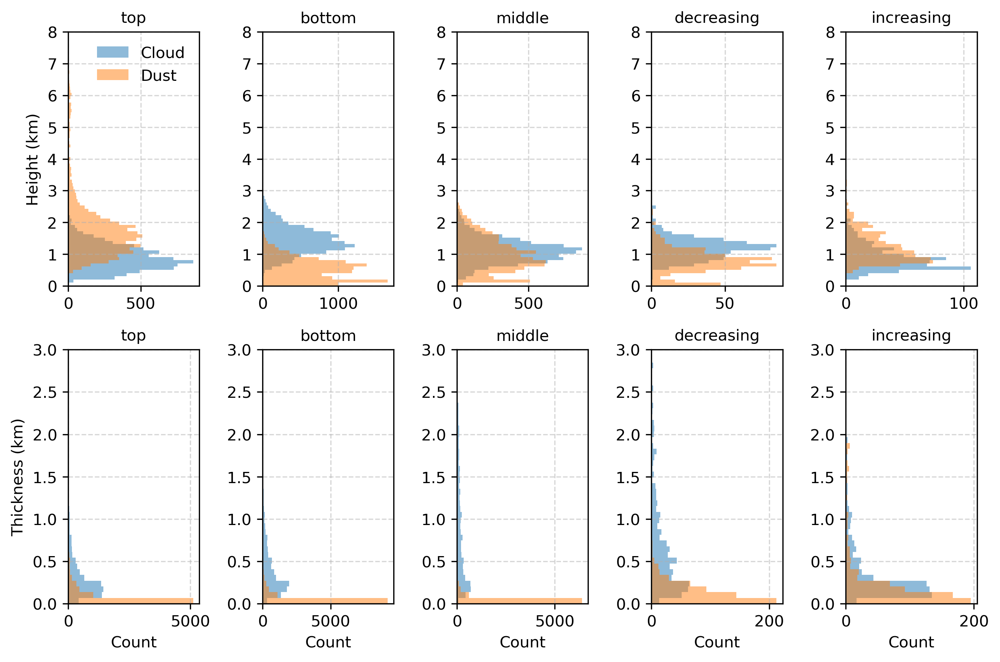

In [24]:
bins_h = np.linspace(0, 8, 80)   # 高度范围 (0-8 km)
bins_t = np.linspace(0, 4, 60)   # 厚度范围 (0-4 km)

fig, axes = plt.subplots(2, 5, figsize=(9, 6), dpi=300, sharex=False, sharey=False)
axes = axes.ravel()

for i, name in enumerate(cat_names[:5]):  # 只画前5个类别作为示例
    ax = axes[i]
    # 平均高度 (Cloud)
    cloud = cloud_mh_by_cat[name]
    cloud_valid = cloud[~np.isnan(cloud)]
    if cloud_valid.size > 0:
        ax.hist(cloud_valid, bins=bins_h, orientation="horizontal",
                color="tab:blue", alpha=0.5, label="Cloud")
    # 平均高度 (Dust)
    dust = dust_mh_by_cat[name]
    dust_valid = dust[~np.isnan(dust)]
    if dust_valid.size > 0:
        ax.hist(dust_valid, bins=bins_h, orientation="horizontal",
                color="tab:orange", alpha=0.5, label="Dust")

    ax.set_title(f"{name}", fontsize=10)
    ax.set_ylim(0, 8)
    ax.grid(ls="--", alpha=0.5)

for i, name in enumerate(cat_names[:5]):  # 下排画厚度
    ax = axes[i+5]
    # 厚度 (Cloud)
    cloud = cloud_tn_by_cat[name]
    cloud_valid = cloud[~np.isnan(cloud)]
    if cloud_valid.size > 0:
        ax.hist(cloud_valid, bins=bins_t, orientation="horizontal",
                color="tab:blue", alpha=0.5, label="Cloud")
    # 厚度 (Dust)
    dust = dust_tn_by_cat[name]
    dust_valid = dust[~np.isnan(dust)]
    if dust_valid.size > 0:
        ax.hist(dust_valid, bins=bins_t, orientation="horizontal",
                color="tab:orange", alpha=0.5, label="Dust")

    ax.set_title(f"{name}", fontsize=10)
    ax.set_ylim(0, 3)
    ax.grid(ls="--", alpha=0.5)

# 标签设置
for ax in axes[5:]:
    ax.set_xlabel("Count")
    
axes[0].set_ylabel("Height (km)")
axes[5].set_ylabel("Thickness (km)")
# 图例放在第一个子图
axes[0].legend(frameon=False, loc="upper right")

plt.tight_layout()
plt.show()


In [25]:
import numpy as np
import matplotlib.pyplot as plt

def plot_cloud_dust_by_rain(cloud_mh_by_cat, dust_mh_by_cat,
                            cloud_tn_by_cat, dust_tn_by_cat,
                            RR_by_cat, cat_names,
                            rain_thresh=0.1):
    """绘制 Cloud & Dust 在下雨/不下雨条件下的高度与厚度分布（bin宽度固定0.2 km）"""

    # --- 每个 bin 的宽度都为 0.2 km ---
    bins_h = np.arange(0, 8.01, 0.2)
    bins_t = np.arange(0, 4.01, 0.1)

    # --- 颜色设定 ---
    colors = {"cloud": "tab:blue", "dust": "tab:orange"}

    # --- 按降水率拆分 ---
    def split_rain(x, rr):
        x, rr = np.asarray(x, float).ravel(), np.asarray(rr, float).ravel()
        n = min(len(x), len(rr))
        x, rr = x[:n], rr[:n]
        valid = np.isfinite(x) & np.isfinite(rr)
        return x[valid & (rr >= rain_thresh)], x[valid & (rr < rain_thresh)]

    # --- 通用绘图函数 ---
    def plot_one(figtitle, selector):
        fig, axes = plt.subplots(2, 5, figsize=(9, 6), dpi=300)
        axes = axes.ravel()

        for i, name in enumerate(cat_names[:5]):
            ax = axes[i]
            c, d = selector(cloud_mh_by_cat[name], dust_mh_by_cat[name], RR_by_cat[name])
            if len(c): ax.hist(c, bins=bins_h, orientation="horizontal", color=colors["cloud"], alpha=0.6, label="Cloud")
            if len(d): ax.hist(d, bins=bins_h, orientation="horizontal", color=colors["dust"],  alpha=0.6, label="Dust")
            ax.set_ylim(0, 8)
            ax.set_title(name, fontsize=10)
            ax.grid(ls="--", alpha=0.5)

        for i, name in enumerate(cat_names[:5]):
            ax = axes[i+5]
            c, d = selector(cloud_tn_by_cat[name], dust_tn_by_cat[name], RR_by_cat[name])
            if len(c): ax.hist(c, bins=bins_t, orientation="horizontal", color=colors["cloud"], alpha=0.6, label="Cloud")
            if len(d): ax.hist(d, bins=bins_t, orientation="horizontal", color=colors["dust"],  alpha=0.6, label="Dust")
            ax.set_ylim(0, 3)
            ax.set_title(name, fontsize=10)
            ax.grid(ls="--", alpha=0.5)

        for ax in axes[5:]:
            ax.set_xlabel("Count")
        axes[0].set_ylabel("Height (km)")
        axes[5].set_ylabel("Thickness (km)")
        axes[0].legend(frameon=False, loc="upper right", fontsize=8)
        fig.suptitle(figtitle, fontsize=14)
        plt.tight_layout()
        plt.show()

    # --- 绘制两张图 ---
    plot_one("No-rain cases (RR < %.1f mm h$^{-1}$)" % rain_thresh,
             lambda c, d, rr: (split_rain(c, rr)[1], split_rain(d, rr)[1]))
    plot_one("Rain cases (RR ≥ %.1f mm h$^{-1}$)" % rain_thresh,
             lambda c, d, rr: (split_rain(c, rr)[0], split_rain(d, rr)[0]))


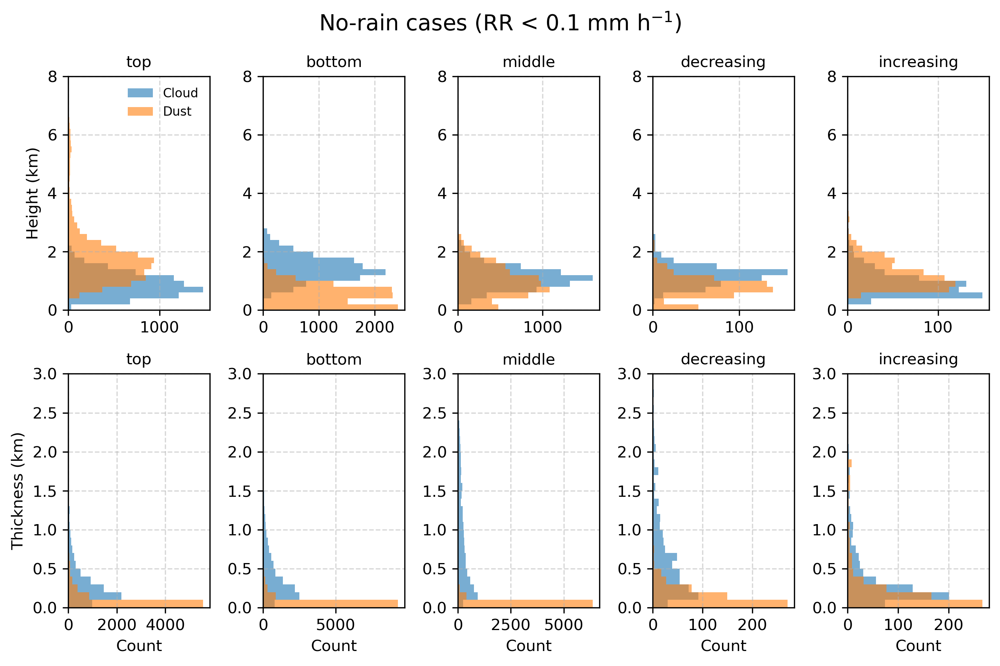

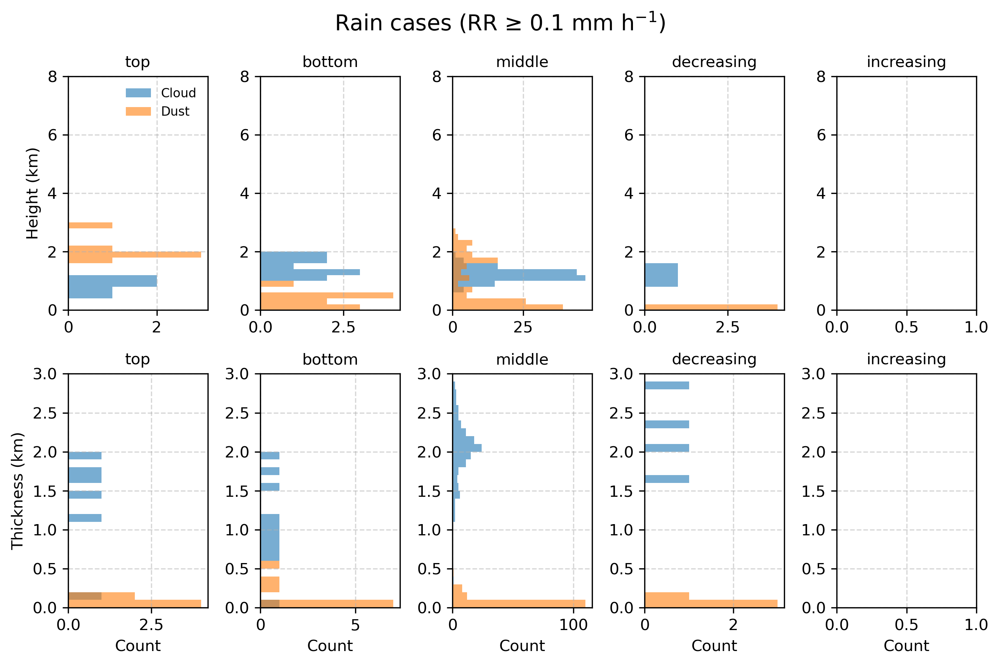

In [26]:
plot_cloud_dust_by_rain(cloud_mh_by_cat, dust_mh_by_cat,
                        cloud_tn_by_cat, dust_tn_by_cat,
                        RR_by_cat, cat_names)


### Dust-Cloud saparation distances

In [27]:
arr_dist_top    = np.full(mask.shape, np.nan)
arr_dist_bottom = np.full(mask.shape, np.nan)

for s, e in zip(starts, ends):
    d_top, d_base = np.nanmean(dust_top_height_new[s:e+1]), np.nanmean(dust_base_height_new[s:e+1])
    c_top, c_base = np.nanmean(cloud_top_height_new[s:e+1]), np.nanmean(cloud_base_height_new[s:e+1])

    if d_base - c_top > 0.1:  # top
        dist = max(0, d_base - c_top - 0.1)
        arr_dist_top[s:e+1] = dist
    elif c_base - d_top > 0.1:  # bottom
        dist = max(0, c_base - d_top - 0.1)
        arr_dist_bottom[s:e+1] = dist

def extract_event_meanss(arr):
    """输入: 带 NaN 的数组; 输出: 每个事件的平均值列表"""
    events = []
    in_event, start = False, None

    for i, v in enumerate(arr):
        if not np.isnan(v) and not in_event:
            # 事件开始
            in_event, start = True, i
        elif np.isnan(v) and in_event:
            # 事件结束
            events.append(np.nanmean(arr[start:i]))
            in_event = False
    # 若最后一个事件到结尾
    if in_event:
        events.append(np.nanmean(arr[start:]))
    return np.array(events)

# 分别计算 top 和 bottom 事件的平均距离
arr_dist_top    = extract_event_meanss(arr_dist_top)
arr_dist_bottom = extract_event_meanss(arr_dist_bottom)

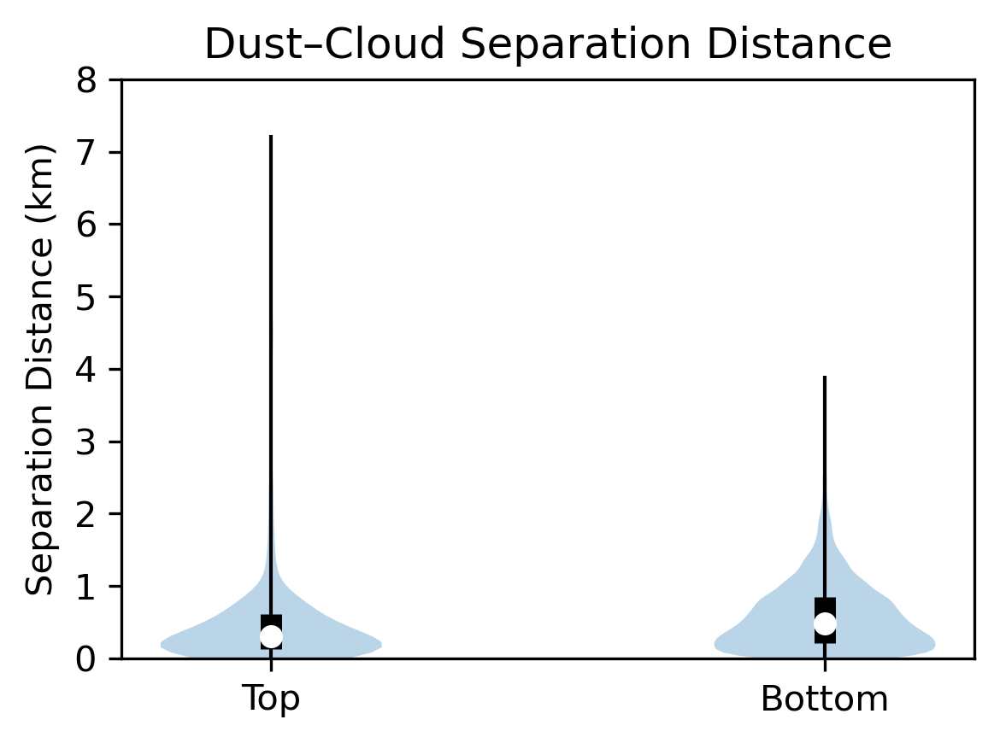

In [28]:
import numpy as np
import matplotlib.pyplot as plt

# 数据
data = [arr_dist_top, arr_dist_bottom]
positions = [1, 2]
fig, ax = plt.subplots(1, 1, figsize=(4, 3), dpi=300)

# 绘制 violin，不显示均值/中位数/极值
parts = ax.violinplot(
    data, positions=positions, widths=0.4,
    showmeans=False, showmedians=False, showextrema=False
)


# 添加中位数、IQR、min–max
for pos, d in zip(positions, data):
    q1, med, q3 = np.percentile(d, [25, 50, 75])
    ax.scatter(pos, med, color="white", s=30, zorder=3)   # 中位数
    ax.vlines(pos, q1, q3, color="black", lw=6)           # IQR
    ax.vlines(pos, d.min(), d.max(), color="black", lw=1) # min–max

# 坐标轴美化
ax.set_xticks(positions)
ax.set_xticklabels(["Top", "Bottom"])
ax.set_ylabel("Separation Distance (km)")
ax.set_title("Dust–Cloud Separation Distance")
ax.set_ylim(0,8)
plt.tight_layout()
plt.show()


### Dust Optical Depth vs. Variables

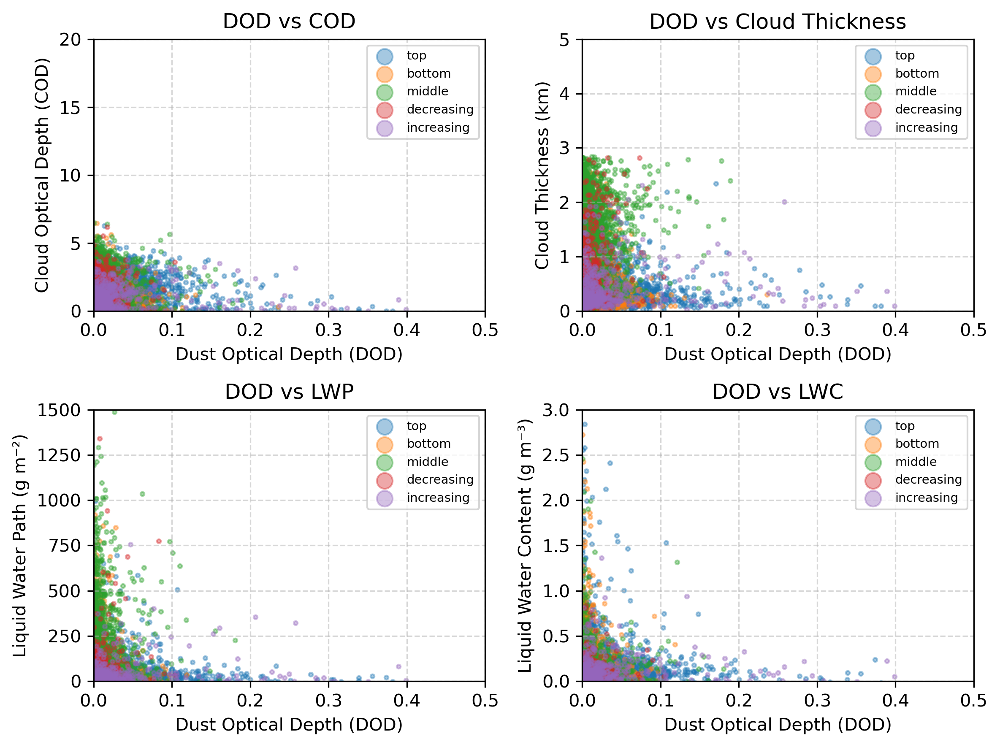

In [29]:
import matplotlib.pyplot as plt
import numpy as np

colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple"]

fig, axes = plt.subplots(2, 2, figsize=(8, 6), dpi=300)

# 子图列表配置：[(x数据字典, y数据字典, xlabel, ylabel, title, ylim)]
plots = [
    (DOD_by_cat, COD_by_cat, "Dust Optical Depth (DOD)", "Cloud Optical Depth (COD)", "DOD vs COD", (0, 20)),
    (DOD_by_cat, cloud_tn_by_cat, "Dust Optical Depth (DOD)", "Cloud Thickness (km)", "DOD vs Cloud Thickness", (0, 5)),
    (DOD_by_cat, lwp_by_cat, "Dust Optical Depth (DOD)", "Liquid Water Path (g m⁻²)", "DOD vs LWP", (0, 1500)),
    (DOD_by_cat, lwc_by_cat, "Dust Optical Depth (DOD)", "Liquid Water Content (g m⁻³)", "DOD vs LWC", (0, 3)),
]

for ax, (xdict, ydict, xlabel, ylabel, title, ylim) in zip(axes.ravel(), plots):
    for i, name in enumerate(cat_names):
        x, y = xdict[name], ydict[name]
        mask = (~np.isnan(x)) & (~np.isnan(y))
        ax.scatter(x[mask], y[mask], s=5, alpha=0.4, color=colors[i], label=name)
    ax.set(xlabel=xlabel, ylabel=ylabel, title=title, xlim=(0, 0.5), ylim=ylim)
    ax.grid(ls="--", alpha=0.5)
    ax.legend(markerscale=4, fontsize=7)

plt.tight_layout()
plt.show()


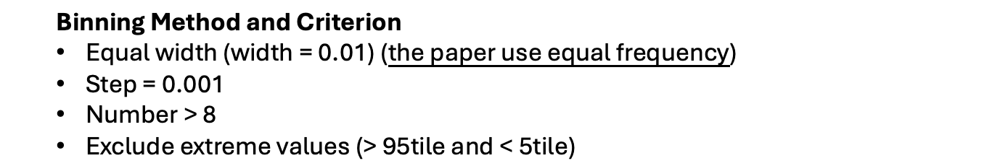

In [30]:
import numpy as np

# ===== 参数 =====
window_width = 0.010   # 滑动窗口宽度（DOD 绝对值尺度，可调）
step          = 0.001   # 滑动步长（越小越丝滑）
min_count_win = 8       # 每个窗口最少样本数
q_low, q_high = 0.10, 0.90

def mask_extremes(a, q_low=0.05, q_high=0.95):
    a = np.asarray(a, dtype=float)
    v = np.isfinite(a)
    if v.sum() == 0:
        return np.full_like(a, np.nan)
    lo, hi = np.nanquantile(a[v], [q_low, q_high])
    out = a.copy()
    out[(a < lo) | (a > hi)] = np.nan
    return out

def moving_window_xy(x, y, xmin, xmax, width, step):
    # 窗口中心序列
    centers = np.arange(xmin + width/2, xmax - width/2 + step/2, step)
    x_mean = np.full_like(centers, np.nan, dtype=float)
    y_mean = np.full_like(centers, np.nan, dtype=float)
    y_sem  = np.full_like(centers, np.nan, dtype=float)
    count  = np.zeros_like(centers, dtype=int)

    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size == 0:
        return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

    half = width / 2.0
    for i, c in enumerate(centers):
        sel = (x >= c - half) & (x < c + half)
        if sel.any():
            xb, yb = x[sel], y[sel]
            count[i]  = xb.size
            x_mean[i] = xb.mean()
            y_mean[i] = yb.mean()
            if xb.size > 1:
                y_sem[i] = yb.std(ddof=1) / np.sqrt(xb.size)

    return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

# ===== 1) 去极值 + 三变量交集，收集全局范围 =====
trip = {}
all_DOD = []
for name in cat_names:
    x0 = mask_extremes(DOD_by_cat[name], q_low, q_high)
    y0 = mask_extremes(COD_by_cat[name], q_low, q_high)
    z0 = mask_extremes(cloud_tn_by_cat[name], q_low, q_high)
    m = np.isfinite(x0) & np.isfinite(y0) & np.isfinite(z0)
    x, y, z = x0[m], y0[m], z0[m]
    trip[name] = {"x": x, "y": y, "z": z}
    all_DOD.append(x)
all_DOD = np.concatenate(all_DOD) if all_DOD else np.array([])

xmin, xmax = np.nanmin(all_DOD), np.nanmax(all_DOD)
if np.isclose(xmin, xmax):
    xmin, xmax = xmin - 1e-9, xmax + 1e-9

# ===== 2) 滑动窗口统计 =====
results_cod_mov = {}
results_tn_mov  = {}
for name in cat_names:
    x = trip[name]["x"]; y = trip[name]["y"]; z = trip[name]["z"]
    results_cod_mov[name] = moving_window_xy(x, y, xmin, xmax, window_width, step)
    results_tn_mov[name]  = moving_window_xy(x, z, xmin, xmax, window_width, step)

binning_meta_mov = {
    "window_width": window_width,
    "step": step,
    "min_count": min_count_win,
}

In [31]:
# ===== 2') 为 LWP / LWC 做同样的滑窗统计（与 DOD 成对） =====
results_lwp_mov = {}
results_lwc_mov = {}

for name in cat_names:
    # 去极值
    x0   = mask_extremes(DOD_by_cat[name], q_low, q_high)
    lwp0 = mask_extremes(lwp_by_cat[name], q_low, q_high)
    lwc0 = mask_extremes(lwc_by_cat[name], q_low, q_high)

    # 与 DOD 的有效交集（分别与 LWP / LWC 成对）
    m_lwp = np.isfinite(x0) & np.isfinite(lwp0)
    m_lwc = np.isfinite(x0) & np.isfinite(lwc0)

    x_lwp, y_lwp = x0[m_lwp], lwp0[m_lwp]
    x_lwc, y_lwc = x0[m_lwc], lwc0[m_lwc]

    # 滑窗
    r_lwp = moving_window_xy(x_lwp, y_lwp, xmin, xmax, window_width, step)
    r_lwc = moving_window_xy(x_lwc, y_lwc, xmin, xmax, window_width, step)

    # 可选：按最小样本数阈值屏蔽
    bad = r_lwp["count"] < min_count_win
    r_lwp["x_mean"][bad] = np.nan; r_lwp["y_mean"][bad] = np.nan; r_lwp["y_sem"][bad] = np.nan
    bad = r_lwc["count"] < min_count_win
    r_lwc["x_mean"][bad] = np.nan; r_lwc["y_mean"][bad] = np.nan; r_lwc["y_sem"][bad] = np.nan

    results_lwp_mov[name] = r_lwp
    results_lwc_mov[name] = r_lwc

# 记录元数据
binning_meta_mov.update({"vars_added": ["LWP", "LWC"]})


In [32]:
def plot_moving(ax, results, ylabel, title, colors, cat_names, meta, show_legend=True):
    min_n = meta["min_count"]
    for i, name in enumerate(cat_names):
        res = results[name]
        x, y, yerr, n = res["x_mean"], res["y_mean"], res["y_sem"], res["count"]
        m = (n >= min_n) & np.isfinite(x) & np.isfinite(y)
        if not m.any():
            continue
        ax.plot(x[m], y[m], '-', lw=1.6, color=colors[i], alpha=0.7, label=name,)
        # 误差阴影可选
        # if np.isfinite(yerr[m]).any():
        #     ax.fill_between(x[m], y[m]-yerr[m], y[m]+yerr[m], alpha=0.15, color=colors[i])

    ax.set(xlabel="Dust Optical Depth", ylabel=ylabel, title=title)
    ax.grid(ls="--", alpha=0.5)
    if show_legend:
        ax.legend()


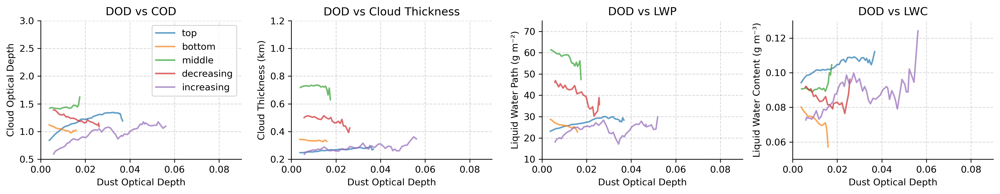

In [33]:
# ==== 画图 ====
fig, axes = plt.subplots(1, 4, figsize=(15, 3), dpi=300)

# ---- (1) COD ----
plot_moving(axes[0], results_cod_mov, "Cloud Optical Depth",
            "DOD vs COD", colors, cat_names, binning_meta_mov, show_legend=True)
axes[0].set_ylim(0.5, 3)
axes[0].set_xlim(0, 0.09)

# ---- (2) Cloud Thickness ----
plot_moving(axes[1], results_tn_mov, "Cloud Thickness (km)",
            "DOD vs Cloud Thickness", colors, cat_names, binning_meta_mov, show_legend=False)
axes[1].set_ylim(0.2, 1.2)
axes[1].set_xlim(0, 0.09)

# ---- (3) LWP ----
plot_moving(axes[2], results_lwp_mov, "Liquid Water Path (g m⁻²)",
            "DOD vs LWP", colors, cat_names, binning_meta_mov, show_legend=False)
axes[2].set_ylim(10, 75)
axes[2].set_xlim(0, 0.09)

# ---- (4) LWC ----
plot_moving(axes[3], results_lwc_mov, "Liquid Water Content (g m⁻³)",
            "DOD vs LWC", colors, cat_names, binning_meta_mov, show_legend=False)
axes[3].set_ylim(0.05, 0.13)
axes[3].set_xlim(0, 0.09)

# === 去除 top / right spines ===
for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


## Sensitive test of ∂ln(LWP)/∂ln(DOD), -∂ln(Re)/∂ln(DOD)

### ∂ln(LWP)/∂ln(DOD)

In [36]:
# === 计算：同时得到 LWP 与 Thickness (cloud_tn_by_cat) 相对敏感度 ===
import numpy as np

# 可选：用 scipy 获得 t 分布置信区间；没有就用正态近似
try:
    from scipy.stats import linregress, t
    _HAVE_SCIPY = True
except Exception:
    _HAVE_SCIPY = False

def _linregress_with_ci(x, y):
    x = np.asarray(x, float).ravel()
    y = np.asarray(y, float).ravel()
    n = x.size
    if n < 3:
        return np.nan, np.nan, np.nan, n, (np.nan, np.nan)

    if _HAVE_SCIPY:
        lr = linregress(x, y)
        slope, intercept, stderr = lr.slope, lr.intercept, lr.stderr
        tcrit = t.ppf(0.975, df=n-2) if n > 2 else np.nan
        ci = (slope - tcrit*stderr, slope + tcrit*stderr)
        return slope, intercept, stderr, n, ci
    else:
        xm, ym = x.mean(), y.mean()
        Sxx = np.sum((x - xm)**2)
        Sxy = np.sum((x - xm)*(y - ym))
        slope = Sxy / Sxx if Sxx != 0 else np.nan
        intercept = ym - slope*xm
        dof = n - 2
        if dof <= 0 or not np.isfinite(slope) or Sxx <= 0:
            return slope, intercept, np.nan, n, (np.nan, np.nan)
        yhat = intercept + slope*x
        resid = y - yhat
        s2 = np.sum(resid**2) / dof
        stderr = np.sqrt(s2 / Sxx)
        z = 1.96
        ci = (slope - z*stderr, slope + z*stderr)
        return slope, intercept, stderr, n, ci

def _compute_one_target(DOD_by_cat, Y_by_cat, categories, y_min_positive=0.0):
    """通用：计算 d ln(Y) / d ln(DOD)；返回 {cat:指标} + total。"""
    results = {}
    dod_all, y_all = [], []

    for cat in categories:
        X = np.asarray(DOD_by_cat[cat], float)
        Y = np.asarray(Y_by_cat[cat],  float)

        if X.shape != Y.shape:
            raise ValueError(f"{cat}: shape mismatch {X.shape} vs {Y.shape}")

        m = np.isfinite(X) & np.isfinite(Y) & (X > 0) & (Y > y_min_positive)
        Xf, Yf = X[m], Y[m]

        if Xf.size >= 3:
            slope, intercept, stderr, n, (ci_low, ci_high) = _linregress_with_ci(np.log(Xf), np.log(Yf))
            results[cat] = dict(slope=slope, ci_low=ci_low, ci_high=ci_high, stderr=stderr, n=n)
            dod_all.append(Xf); y_all.append(Yf)
        else:
            results[cat] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=Xf.size)

    # total
    if dod_all:
        Xt, Yt = np.concatenate(dod_all), np.concatenate(y_all)
        if Xt.size >= 3:
            slope, intercept, stderr, n, (ci_low, ci_high) = _linregress_with_ci(np.log(Xt), np.log(Yt))
            results["total"] = dict(slope=slope, ci_low=ci_low, ci_high=ci_high, stderr=stderr, n=n)
        else:
            results["total"] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=Xt.size)
    else:
        results["total"] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=0)

    return results

def compute_sensitivities(
    DOD_by_cat,
    lwp_by_cat,
    cloud_tn_by_cat,
    re_by_cat,
    cloud_th_by_cat,
    COD_by_cat,
    categories=("top","bottom","middle","decreasing","increasing"),
    min_lwp=0.0,
    min_thickness=0.0,
    min_re=0.0,
    min_cloud_th=0.0,
    min_cod=0.0,
):
    """
    同时计算多种相对敏感度：d ln(Y) / d ln(DOD)

    返回：
      results = {
        'LWP': {...},
        'Thickness': {...},
        'Re': {...},
        'Cloud_TH': {...},
        'COD': {...},
      }, order = [cats..., 'total']
    """
    results = {}
    results["LWP"]       = _compute_one_target(DOD_by_cat, lwp_by_cat,        categories, y_min_positive=min_lwp)
    results["Thickness"] = _compute_one_target(DOD_by_cat, cloud_tn_by_cat,   categories, y_min_positive=min_thickness)
    results["Re"]        = _compute_one_target(DOD_by_cat, re_by_cat,         categories, y_min_positive=min_re)
    results["Cloud_TH"]  = _compute_one_target(DOD_by_cat, cloud_th_by_cat,   categories, y_min_positive=min_cloud_th)
    results["COD"]       = _compute_one_target(DOD_by_cat, COD_by_cat,        categories, y_min_positive=min_cod)

    order = list(categories) + ["total"]
    return results, order

# === 运行计算 ===
results_all, order = compute_sensitivities(
    DOD_by_cat, lwp_by_cat, cloud_tn_by_cat, re_by_cat, cloud_th_by_cat, COD_by_cat,
    categories=("top","bottom","middle","decreasing","increasing"),
    min_lwp=0.0, min_thickness=0.0, min_re=0.0, min_cloud_th=0.0, min_cod=0.0
)



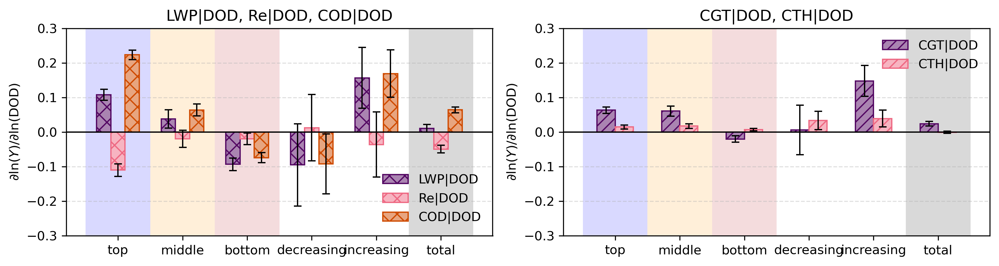

In [37]:
# === 绘图：1x2 子图；facecolor 为同色系亮 50%（不使用 alpha） ===
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def _extract(results_dict, order):
    s  = np.array([results_dict[c]["slope"]   for c in order], float)
    lo = np.array([results_dict[c]["ci_low"]  for c in order], float)
    hi = np.array([results_dict[c]["ci_high"] for c in order], float)
    return s, np.vstack([s-lo, hi-s])

def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1-rgb)*a)

def plot_sens_bars(results_all, order,
                   ylim_left=(-0.3,0.3), ylim_right=(-0.3,0.3)):

    base = ["top", "middle", "bottom"]
    rest = [c for c in order if c not in base]
    cats = base + rest
    x = np.arange(len(cats))

    fig, ax = plt.subplots(1, 2, figsize=(11, 3), dpi=300, constrained_layout=True)

    bg_colors = {"top": "b", "middle": "#ff9505", "bottom": "#ba181b", "total": "k"}
    for a, ylim in zip(ax, [ylim_left, ylim_right]):
        for i,c in enumerate(cats):
            if c in bg_colors:
                a.axvspan(i-0.5, i+0.5, facecolor=bg_colors[c], alpha=0.15, zorder=0)
        a.set_ylim(*ylim)

    cols = ["#540863", "#EE6983", "#CF4B00"]

    # ---------- 左图 ----------
    w = 0.22
    for k, off, col, lab in zip(
        ["LWP","Re","COD"], [-w, 0.0, w], cols,
        ["LWP|DOD","Re|DOD","COD|DOD"]
    ):
        s, yerr = _extract(results_all[k], cats)
        ax[0].bar(x+off, s, width=w,
                  edgecolor=col, facecolor=_lighten(col, 0.5),
                  hatch="xx", linewidth=1.0, label=lab, zorder=2)
        ax[0].errorbar(x+off, s, yerr=yerr, fmt="none",
                       ecolor="k", elinewidth=1, capsize=3, zorder=3)

    ax[0].axhline(0, color="k", lw=1)
    ax[0].set_xticks(x); ax[0].set_xticklabels(cats)
    ax[0].set_ylabel(r"$\partial \ln(Y) / \partial \ln(\mathrm{DOD})$")
    ax[0].set_title("LWP|DOD, Re|DOD, COD|DOD")
    ax[0].grid(alpha=0.4, ls="--", axis="y")
    ax[0].legend(frameon=False)

    # ---------- 右图 ----------
    w2 = 0.28
    for k, off, col, lab in zip(
        ["Thickness","Cloud_TH"], [-w2/2, w2/2], cols[:2],
        ["CGT|DOD","CTH|DOD"]
    ):
        s, yerr = _extract(results_all[k], cats)
        ax[1].bar(x+off, s, width=w2,
                  edgecolor=col, facecolor=_lighten(col, 0.5),
                  hatch="///", linewidth=1.0, label=lab, zorder=2)
        ax[1].errorbar(x+off, s, yerr=yerr, fmt="none",
                       ecolor="k", elinewidth=1, capsize=3, zorder=3)

    ax[1].axhline(0, color="k", lw=1)
    ax[1].set_xticks(x); ax[1].set_xticklabels(cats)
    ax[1].set_ylabel(r"$\partial \ln(Y) / \partial \ln(\mathrm{DOD})$")
    ax[1].set_title("CGT|DOD, CTH|DOD")
    ax[1].grid(alpha=0.4, ls="--", axis="y")
    ax[1].legend(frameon=False)
    plt.tight_layout()
    plt.savefig("figsave/ENA_ACI1_chara.pdf", dpi=300, bbox_inches="tight")
    plt.show()

# === 调用 ===
plot_sens_bars(results_all, order)


### -∂ln(Re)/∂ln(DOD), ∂ln(COD)/∂ln(DOD), ∂ln(CF)/∂ln(DOD)

In [34]:
import numpy as np
from typing import Dict, Sequence, Mapping, Optional
from scipy import stats

# ====== 工具：线性回归 + 95%CI ======
def _linregress_with_ci(x, y, alpha=0.05):
    """
    对 x, y 做线性回归：
      y = a + b x
    返回:
      slope, intercept, stderr, n, (ci_low, ci_high)
    其中 (ci_low, ci_high) 是 slope 的 (1-alpha) 置信区间
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    n = x.size
    if n < 3:
        return np.nan, np.nan, np.nan, n, (np.nan, np.nan)

    res = stats.linregress(x, y)
    slope = res.slope
    intercept = res.intercept
    stderr = res.stderr

    # t 分布临界值
    tcrit = stats.t.ppf(1 - alpha/2, df=n-2)
    ci_low = slope - tcrit * stderr
    ci_high = slope + tcrit * stderr
    return slope, intercept, stderr, n, (ci_low, ci_high)


# ====== 主函数：按 LWP 三档计算 ACI_Re / ACI_COD / CF 斜率 ======
def compute_aci_re_cod_by_lwp_bins(
    DOD_by_cat: Mapping[str, Sequence[float]],
    lwp_by_cat: Mapping[str, Sequence[float]],
    COD_by_cat: Mapping[str, Sequence[float]],
    cf_by_cat: Optional[Mapping[str, Sequence[float]]] = None,
    categories=("top","bottom","middle","decreasing","increasing"),
    # ✅ 改成三档 LWP：0–40, 40–80, 80–150
    lwp_bins=((0, 20.0), (20.0, 50.0), (50.0, 150.0)),
):
    """
    计算各类 + total 的（按 LWP 分箱）：
      - ACI_Re   = - d ln(Re)  / d ln(DOD)，其中 Re = (3/(2*rho_l)) * LWP / COD, rho_l=1
      - ACI_COD  =   d ln(COD) / d ln(DOD)
      - CF_slope =   d CF      / d ln(DOD)     （若提供 cf_by_cat）
    并给出 95% 置信区间（来自 _linregress_with_ci）。

    返回:
      results_re, results_cod, results_cf, bin_order, cat_order, re_by_cat
    """
    rho_l = 1.0
    const = 3.0 / (2.0 * rho_l)

    results_re, results_cod = {}, {}
    results_cf = {}
    re_by_cat = {}
    bin_order = []
    cat_order = list(categories) + ["total"]

    # === 先构建与输入同长的 Re 数组 ===
    for cat in categories:
        DOD = np.asarray(DOD_by_cat[cat], float)
        LWP = np.asarray(lwp_by_cat[cat], float)
        COD = np.asarray(COD_by_cat[cat], float)
        if not (DOD.shape == LWP.shape == COD.shape):
            raise ValueError(f"{cat}: shape mismatch: {DOD.shape}, {LWP.shape}, {COD.shape}")

        re_full = np.full_like(DOD, np.nan)
        valid = np.isfinite(DOD) & np.isfinite(LWP) & np.isfinite(COD)
        pos = valid & (DOD > 0) & (LWP > 0) & (COD > 0)
        re_full[pos] = const * LWP[pos] / COD[pos]
        re_by_cat[cat] = re_full

        if cf_by_cat is not None:
            CF = np.asarray(cf_by_cat[cat], float)
            if CF.shape != DOD.shape:
                raise ValueError(f"{cat}: CF shape mismatch: {CF.shape} vs {DOD.shape}")

    # === 按 LWP 分箱回归 ===
    for (lo, hi) in lwp_bins:
        bin_label = f"LWP:{lo:.0f}-{hi:.0f}"
        bin_order.append(bin_label)
        results_re[bin_label], results_cod[bin_label] = {}, {}
        results_cf[bin_label] = {}
        dod_re_all, re_all, dod_cod_all, cod_all = [], [], [], []
        dod_cf_all, cf_all = [], []

        for cat in categories:
            DOD = np.asarray(DOD_by_cat[cat], float)
            LWP = np.asarray(lwp_by_cat[cat], float)
            COD = np.asarray(COD_by_cat[cat], float)
            RE  = re_by_cat[cat]

            # --- ACI_Re ---
            m_re = np.isfinite(DOD) & np.isfinite(RE) & np.isfinite(LWP)
            m_re &= (DOD > 0) & (RE > 0) & (LWP >= lo) & (LWP < hi)
            if np.count_nonzero(m_re) >= 3:
                x, y = np.log(DOD[m_re]), np.log(RE[m_re])
                slope, _, stderr, n, (ci_low, ci_high) = _linregress_with_ci(x, y)
                aci_re = -slope
                results_re[bin_label][cat] = dict(
                    slope=aci_re,
                    ci_low=-ci_high,
                    ci_high=-ci_low,
                    stderr=stderr,
                    n=n,
                )
                dod_re_all.append(np.exp(x)); re_all.append(np.exp(y))
            else:
                results_re[bin_label][cat] = dict(
                    slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=int(np.count_nonzero(m_re))
                )

            # --- ACI_COD ---
            m_cod = np.isfinite(DOD) & np.isfinite(COD) & np.isfinite(LWP)
            m_cod &= (DOD > 0) & (COD > 0) & (LWP >= lo) & (LWP < hi)
            if np.count_nonzero(m_cod) >= 3:
                x2, y2 = np.log(DOD[m_cod]), np.log(COD[m_cod])
                slope2, _, stderr2, n2, (ci_low2, ci_high2) = _linregress_with_ci(x2, y2)
                results_cod[bin_label][cat] = dict(
                    slope=slope2,
                    ci_low=ci_low2,
                    ci_high=ci_high2,
                    stderr=stderr2,
                    n=n2,
                )
                dod_cod_all.append(np.exp(x2)); cod_all.append(np.exp(y2))
            else:
                results_cod[bin_label][cat] = dict(
                    slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=int(np.count_nonzero(m_cod))
                )

            # --- CF vs ln(DOD)（可选） ---
            if cf_by_cat is not None:
                CF = np.asarray(cf_by_cat[cat], float)
                m_cf = np.isfinite(DOD) & np.isfinite(CF) & np.isfinite(LWP)
                m_cf &= (DOD > 0) & (LWP >= lo) & (LWP < hi)
                if np.count_nonzero(m_cf) >= 3:
                    x3, y3 = np.log(DOD[m_cf]), CF[m_cf]
                    slope3, intercept3, stderr3, n3, (ci_low3, ci_high3) = _linregress_with_ci(x3, y3)
                    results_cf[bin_label][cat] = dict(
                        slope=slope3,
                        intercept=intercept3,
                        ci_low=ci_low3,
                        ci_high=ci_high3,
                        stderr=stderr3,
                        n=n3,
                    )
                    dod_cf_all.append(np.exp(x3)); cf_all.append(y3)
                else:
                    results_cf[bin_label][cat] = dict(
                        slope=np.nan, intercept=np.nan,
                        ci_low=np.nan, ci_high=np.nan,
                        stderr=np.nan, n=int(np.count_nonzero(m_cf))
                    )

        # --- total (ACI_Re) ---
        if dod_re_all:
            X, Y = np.log(np.concatenate(dod_re_all)), np.log(np.concatenate(re_all))
            if X.size >= 3:
                slope, _, stderr, n, (ci_low, ci_high) = _linregress_with_ci(X, Y)
                results_re[bin_label]["total"] = dict(
                    slope=-slope, ci_low=-ci_high, ci_high=-ci_low,
                    stderr=stderr, n=n,
                )
            else:
                results_re[bin_label]["total"] = dict(
                    slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=X.size,
                )
        else:
            results_re[bin_label]["total"] = dict(
                slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                stderr=np.nan, n=0,
            )

        # --- total (ACI_COD) ---
        if dod_cod_all:
            X2, Y2 = np.log(np.concatenate(dod_cod_all)), np.log(np.concatenate(cod_all))
            if X2.size >= 3:
                slope2, _, stderr2, n2, (ci_low2, ci_high2) = _linregress_with_ci(X2, Y2)
                results_cod[bin_label]["total"] = dict(
                    slope=slope2, ci_low=ci_low2, ci_high=ci_high2,
                    stderr=stderr2, n=n2,
                )
            else:
                results_cod[bin_label]["total"] = dict(
                    slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=X2.size,
                )
        else:
            results_cod[bin_label]["total"] = dict(
                slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                stderr=np.nan, n=0,
            )

        # --- total (CF) ---
        if cf_by_cat is not None:
            if dod_cf_all:
                X3, Y3 = np.log(np.concatenate(dod_cf_all)), np.concatenate(cf_all)
                if X3.size >= 3:
                    slope3, intercept3, stderr3, n3, (ci_low3, ci_high3) = _linregress_with_ci(X3, Y3)
                    results_cf[bin_label]["total"] = dict(
                        slope=slope3, intercept=intercept3,
                        ci_low=ci_low3, ci_high=ci_high3,
                        stderr=stderr3, n=n3,
                    )
                else:
                    results_cf[bin_label]["total"] = dict(
                        slope=np.nan, intercept=np.nan,
                        ci_low=np.nan, ci_high=np.nan,
                        stderr=np.nan, n=X3.size,
                    )
            else:
                results_cf[bin_label]["total"] = dict(
                    slope=np.nan, intercept=np.nan,
                    ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=0,
                )

    return results_re, results_cod, results_cf, bin_order, cat_order, re_by_cat


# ====== 调用：使用三档 LWP 分箱 ======
results_re, results_cod, results_cf, bin_order, cat_order, re_by_cat = \
    compute_aci_re_cod_by_lwp_bins(
        DOD_by_cat,
        lwp_by_cat,
        COD_by_cat,
        cf_by_cat=cf_by_cat
    )


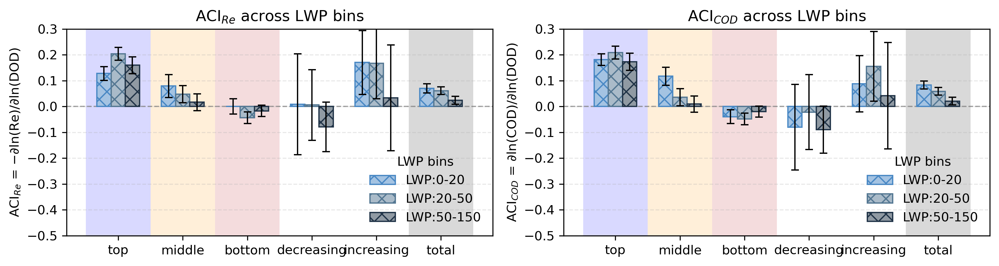

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def _get_series(res, b, cats):
    s  = np.array([res[b][c]["slope"]   for c in cats], float)
    lo = np.array([res[b][c]["ci_low"]  for c in cats], float)
    hi = np.array([res[b][c]["ci_high"] for c in cats], float)
    return s, np.vstack([s-lo, hi-s])

def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1-rgb)*a)

def plot_aci_re_cod_bar(results_re, results_cod, bin_order, cat_order=None, ylim=(-0.3, 0.4)):
    cats = (list(cat_order) if cat_order is not None else [c for c in results_re[bin_order[0]] if c!="total"]+["total"])
    if {"top","bottom","middle"}.issubset(cats): cats = ["top","middle","bottom"] + [c for c in cats if c not in ["top","middle","bottom"]]
    x = np.arange(len(cats))
    cols = ["#4988C4", "#547792", "#213448"]
    bg = {"top":"b", "bottom":"#ba181b", "middle":"#ff9505", "total":"k"}

    fig, ax = plt.subplots(1, 2, figsize=(11, 3), dpi=300, constrained_layout=True)
    for a in ax:
        for i,c in enumerate(cats):
            if c in bg: a.axvspan(i-0.5, i+0.5, facecolor=bg[c], alpha=0.15, zorder=0)
        a.axhline(0, ls="--", lw=1, color="gray", alpha=0.7)
        a.set_ylim(*ylim); a.set_xticks(x); a.set_xticklabels(cats); a.grid(alpha=0.3, ls="--", axis="y")

    w = 0.22; offs = (np.arange(len(bin_order)) - (len(bin_order)-1)/2) * w
    for i,b in enumerate(bin_order):
        ec, fc = cols[i], _lighten(cols[i], 0.5)

        s,y = _get_series(results_re, b, cats)
        ax[0].bar(x+offs[i], s, width=w, edgecolor=ec, facecolor=fc, hatch="xx", linewidth=1.0, label=b, zorder=2)
        ax[0].errorbar(x+offs[i], s, yerr=y, fmt="none", ecolor="k", elinewidth=1, capsize=3, zorder=3)

        s,y = _get_series(results_cod, b, cats)
        ax[1].bar(x+offs[i], s, width=w, edgecolor=ec, facecolor=fc, hatch="xx", linewidth=1.0, label=b, zorder=2)
        ax[1].errorbar(x+offs[i], s, yerr=y, fmt="none", ecolor="k", elinewidth=1, capsize=3, zorder=3)

    ax[0].set_ylabel(r"ACI$_{Re}$ = $-\partial \ln(\mathrm{Re})/\partial \ln(\mathrm{DOD})$"); ax[0].set_title("ACI$_{Re}$ across LWP bins"); ax[0].legend(title="LWP bins", frameon=False)
    ax[1].set_ylabel(r"ACI$_{COD}$ = $\partial \ln(\mathrm{COD})/\partial \ln(\mathrm{DOD})$"); ax[1].set_title("ACI$_{COD}$ across LWP bins"); ax[1].legend(title="LWP bins", frameon=False)
    
    plt.tight_layout()
    plt.savefig("figsave/ENA_ACI2_chara.pdf", dpi=300, bbox_inches="tight")
    plt.show()

plot_aci_re_cod_bar(results_re, results_cod, bin_order, cat_order, ylim=(-0.5, 0.3))


## 2D bin plot

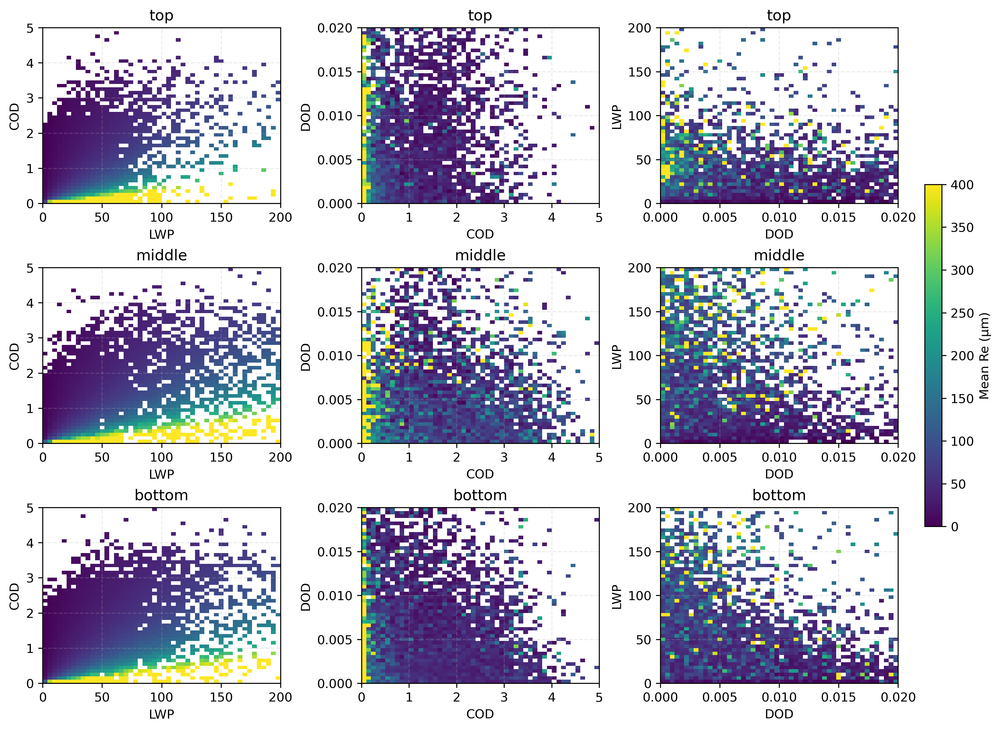

In [38]:
import numpy as np
import matplotlib.pyplot as plt

cats = ["top","middle","bottom"]

def mean_re_grid(X, Y, Re, xedges, yedges, min_count=0):
    X=np.asarray(X,float).ravel(); Y=np.asarray(Y,float).ravel(); Re=np.asarray(Re,float).ravel()
    m=np.isfinite(X)&np.isfinite(Y)&np.isfinite(Re)
    X,Y,Re=X[m],Y[m],Re[m]
    S,_,_=np.histogram2d(X,Y,bins=[xedges,yedges],weights=Re)
    N,_,_=np.histogram2d(X,Y,bins=[xedges,yedges])
    M=S/np.where(N==0,np.nan,N); M[N < min_count]=np.nan
    return M.T

cod_edges = np.linspace(0, 5,    51)
lwp_edges = np.linspace(0, 200,  51)
dod_edges = np.linspace(0, 0.02, 51)

fig, ax = plt.subplots(3, 3, figsize=(11, 8), dpi=300, constrained_layout=True)
pcms = []

for i,c in enumerate(cats):
    COD=np.asarray(COD_by_cat[c],float).ravel()
    LWP=np.asarray(lwp_by_cat[c],float).ravel()
    DOD=np.asarray(DOD_by_cat[c],float).ravel()
    RE =np.asarray(re_by_cat[c], float).ravel()

    M = mean_re_grid(LWP, COD, RE, lwp_edges, cod_edges,)
    pcms.append(ax[i,0].pcolormesh(lwp_edges, cod_edges, M, shading="auto", vmin=0, vmax=400))
    ax[i,0].set(xlabel="LWP", ylabel="COD", xlim=(0,200), ylim=(0,5), title=c)

    M = mean_re_grid(COD, DOD, RE, cod_edges, dod_edges,)
    pcms.append(ax[i,1].pcolormesh(cod_edges, dod_edges, M, shading="auto", vmin=0, vmax=400))
    ax[i,1].set(xlabel="COD", ylabel="DOD", xlim=(0,5), ylim=(0,0.02), title=c)

    M = mean_re_grid(DOD, LWP, RE, dod_edges, lwp_edges,)
    pcm = ax[i,2].pcolormesh(dod_edges, lwp_edges, M, shading="auto", vmin=0, vmax=400)
    pcms.append(pcm)
    ax[i,2].set(xlabel="DOD", ylabel="LWP", xlim=(0,0.02), ylim=(0,200), title=c)

for a in ax.ravel(): a.grid(alpha=0.25, ls="--")

cb = fig.colorbar(pcms[-1], ax=ax, fraction=0.02, pad=0.01)
cb.set_label("Mean Re (µm)")
plt.show()



## monthly and diurnal trend of DOD

### Whole data, no classfication

In [88]:
# ====== A. 数据处理 ======
import numpy as np
import pandas as pd
import xarray as xr

# --- 0) 基础：参数/颜色与层定义 ---
order = [
    ("dust_AOD_0_200m",    "0-200 m",    "#9C4F96"),
    ("dust_AOD_200_400m",  "200-400 m",  "#FF6355"),
    ("dust_AOD_400_600m",  "400-600 m",  "#FBA949"),
    ("dust_AOD_600_800m",  "600-800 m",  "#FAE442"),
    ("dust_AOD_800_1200m", "800-1200 m", "#8BD448"),
    ("dust_AOD_gt_1200m",  ">1200 m",    "#2AA8F2"),
]

layers_km = [(0.00,0.20),(0.20,0.40),(0.40,0.60),(0.60,0.80),(0.80,1.20),(1.20,999.0)]
layer_names = [x[0] for x in order]

# --- 1) QC：去掉 >1 的点（对 Dask 友好）---
mask_valid = ext_dust.where(ext_dust <= 1)
pre_valid  = int(ext_dust.count().compute())
post_valid = int(mask_valid.count().compute())
n_filtered = pre_valid - post_valid
filtered_ratio = 100.0 * n_filtered / pre_valid if pre_valid > 0 else np.nan
print(f"[QC] 滤掉的数据: {n_filtered} / {pre_valid} ({filtered_ratio:.4f}%)")

ext_dust = mask_valid  # 替换为过滤后的版本

# --- 2) 按高度层积分（得到各层 DOD=分层AOD；沿 height_high 对 ext_dust*dz 积分）---
h_km = ds_a["height_high"]              # (km)
dzA  = (ext_dust * dz2d)                # 与 ext_dust 对齐的 Δz 权重

layer_results = {}
for (lo, hi), name in zip(layers_km, layer_names):
    mask_layer = (h_km >= lo) if hi >= 900 else ((h_km >= lo) & (h_km < hi))
    layer_results[name] = dzA.where(mask_layer).sum("height_high")

dust_AOD_layers = xr.Dataset(layer_results)  # (time,)

# 可选一致性检查：与整柱 AOD 比较
# dust_AOD_check = dust_AOD_layers.to_array("layer").sum("layer")

# --- 3) 季节平均的 extinction 剖面（曲线用）---
da_season = ext_dust.groupby("time.season").mean("time", skipna=True)
season_order = ["MAM", "JJA", "SON", "DJF"]
da_season = da_season.sel(season=season_order)

# --- 4) 简易本地时 (ENA 冬季近似：UTC-1h；若要精确 DST/LST，用你之前的函数) ---
dust_AOD_layers_local = dust_AOD_layers.assign_coords(
    time=dust_AOD_layers.indexes["time"] - pd.to_timedelta(1, "h")
)
ext_dust_local = ext_dust.assign_coords(
    time=ext_dust.indexes["time"] - pd.to_timedelta(1, "h")
)

# --- 5) 逐小时统计（画日变化堆叠 & 两条总线，以及 02/08/24h 剖面）---
# 各层逐时均值（0..23）
layer_hour_means = []
for var, _, _ in order:
    hmean = dust_AOD_layers_local[var].groupby("time.hour").mean("time", skipna=True)
    layer_hour_means.append(hmean.sel(hour=np.arange(24)).values)  # (24,)

# <800m 与 ≥800m 的逐时均值
low_hour  = sum(dust_AOD_layers_local[v].groupby("time.hour").mean("time", skipna=True)
                for v,_,_ in order[:4]).sel(hour=np.arange(24))
high_hour = sum(dust_AOD_layers_local[v].groupby("time.hour").mean("time", skipna=True)
                for v,_,_ in order[4:]).sel(hour=np.arange(24))

# 02/08/24h extinction 剖面
ext_hourly = ext_dust_local.groupby("time.hour").mean("time", skipna=True)  # (hour, height_high)
ext_mean   = ext_dust_local.mean("time", skipna=True)                       # (height_high,)

# --- 6) 逐月层平均（用于月循环子图；若不需要可跳过）---
def monthly_mean_sem(da):
    g   = da.groupby("time.month")
    mu  = g.mean("time", skipna=True)
    sd  = g.std("time",  skipna=True)
    n   = g.count("time")
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu, sem

low_series  = sum(dust_AOD_layers[v] for v,_,_ in order[:4])
high_series = sum(dust_AOD_layers[v] for v,_,_ in order[4:])
low_mean,  low_sem  = monthly_mean_sem(low_series)
high_mean, high_sem = monthly_mean_sem(high_series)

layer_month_means = []
for var, _, _ in order:
    m, _ = monthly_mean_sem(dust_AOD_layers[var])
    layer_month_means.append(m.values)  # 每层的 12 个月均值


[QC] 滤掉的数据: 0 / 33039527 (0.0000%)


In [89]:
# --- 0) 基础：参数/颜色与层定义 ---
order = [
    ("dust_AOD_0_200m",    "0-200 m",    "#efa9a9"),
    ("dust_AOD_200_400m",  "200-400 m",  "#e88889"),
    ("dust_AOD_400_600m",  "400-600 m",  "#e26869"),
    ("dust_AOD_600_800m",  "600-800 m",  "#dc4748"),
    ("dust_AOD_800_1200m", "800-1200 m", "#d62728"),
    ("dust_AOD_gt_1200m",  ">1200 m",    "#b62122"),
]

## Monthly and diurnal trend of Cloud

In [90]:
# ====== Warm low-cloud (cloud-top < 3 km, T>=273.15 K) layered COD: monthly & diurnal ======
import numpy as np
import pandas as pd
import xarray as xr

# -----------------------
# 0) layer settings (km)
# -----------------------
order_cloud = [
    ("cloud_COD_0_200m",     "0-200 m",     "#9C4F96"),
    ("cloud_COD_200_400m",   "200-400 m",   "#FF6355"),
    ("cloud_COD_400_600m",   "400-600 m",   "#FBA949"),
    ("cloud_COD_600_800m",   "600-800 m",   "#FAE442"),
    ("cloud_COD_800_1200m",  "800-1200 m",  "#8BD448"),
    ("cloud_COD_1200_3000m", "1200-3000 m", "#2AA8F2"),
]
layers_km_cloud = [(0.00,0.20),(0.20,0.40),(0.40,0.60),(0.60,0.80),(0.80,1.20),(1.20,3.00)]
cloud_layer_names = [x[0] for x in order_cloud]

# height coord (km) for vertical masks
h_km = ds_a["height_high"]  # (height_high,) in km

# -------------------------------------------------------
# 1) low-cloud selection MUST be by profile cloud-top <3km
#    You have: top_km.shape=(N,) and ext_cloud.shape=(N, nlev)
# -------------------------------------------------------
# Make a boolean mask aligned to ext_cloud's first dimension.
# If ext_cloud is DataArray with dim 'time' (or similar), keep that.
if isinstance(ext_cloud, xr.DataArray):
    prof_dim = ext_cloud.dims[0]
    if isinstance(cloud_top_height, xr.DataArray):
        # align to same dim/coords if possible
        if cloud_top_height.dims == (prof_dim,):
            cloud_top_height_da = cloud_top_height
        else:
            cloud_top_height_da = xr.DataArray(cloud_top_height.values, dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]})
    else:
        cloud_top_height_da = xr.DataArray(np.asarray(cloud_top_height), dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]})
    mask_low_prof = cloud_top_height_da < 3.0
else:
    # fallback (unlikely in your workflow since ext_cloud is usually an xarray object)
    raise TypeError("ext_cloud should be an xarray.DataArray with dims like (time, height_high).")

# Apply profile-level mask (keeps full vertical structure for low clouds)
ext_cloud_low = ext_cloud.where(mask_low_prof)

# -------------------------------------------------------
# 2) QC for cloud extinction (already warm-cloud + ext>0 in your pipeline)
#    keep only (0, 20] km^-1
# -------------------------------------------------------
ext_cloud_low = ext_cloud_low.where(ext_cloud_low > 0)
pre_valid_c  = int(ext_cloud_low.count().compute())
ext_cloud_low = ext_cloud_low.where(ext_cloud_low <= 20)
post_valid_c = int(ext_cloud_low.count().compute())
n_filtered_c = pre_valid_c - post_valid_c
filtered_ratio_c = 100.0 * n_filtered_c / pre_valid_c if pre_valid_c > 0 else np.nan
print(f"[QC-cloud] 滤掉的数据: {n_filtered_c} / {pre_valid_c} ({filtered_ratio_c:.4f}%)")

# -------------------------------------------------------
# 3) Layer-integrated COD contributions: sum(ext_cloud_low * dz) within height bins
#    dz2d must be aligned to ext_cloud (same dims as ext_cloud)
# -------------------------------------------------------
dzC = ext_cloud_low * dz2d

cloud_layer_results = {}
for (lo, hi), name in zip(layers_km_cloud, cloud_layer_names):
    mask_layer = (h_km >= lo) & (h_km < hi)   # (height_high,)
    cloud_layer_results[name] = dzC.where(mask_layer).sum("height_high")

cloud_COD_layers = xr.Dataset(cloud_layer_results)  # (time,)

# Optional: low-cloud (cloud-top<3 km) total COD (column)
COD_low = (ext_cloud_low * dz2d).sum("height_high")  # (time,)

# -------------------------------------------------------
# 4) Seasonal mean extinction profile (for curves)
# -------------------------------------------------------
cloud_season = ext_cloud_low.groupby(f"{prof_dim}.season").mean(prof_dim, skipna=True)
season_order = ["MAM", "JJA", "SON", "DJF"]
cloud_season = cloud_season.sel(season=season_order)

# -------------------------------------------------------
# 5) Simple local time shift (ENA winter approx UTC-1h), same as your dust workflow
# -------------------------------------------------------
cloud_COD_layers_local = cloud_COD_layers.assign_coords(
    {prof_dim: cloud_COD_layers.indexes[prof_dim] - pd.to_timedelta(1, "h")}
)
ext_cloud_low_local = ext_cloud_low.assign_coords(
    {prof_dim: ext_cloud_low.indexes[prof_dim] - pd.to_timedelta(1, "h")}
)
COD_low_local = COD_low.assign_coords(
    {prof_dim: COD_low.indexes[prof_dim] - pd.to_timedelta(1, "h")}
)

# -------------------------------------------------------
# 6) Diurnal cycle (hourly means) for stacked layers + two totals (<800m vs >=800m)
# -------------------------------------------------------
# per-layer hourly mean (0..23)
cloud_layer_hour_means = []
for var, _, _ in order_cloud:
    hmean = cloud_COD_layers_local[var].groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True)
    cloud_layer_hour_means.append(hmean.sel(hour=np.arange(24)).values)  # list of (24,)

# totals: <800m (first 4 layers) and >=800m (last 2 layers)
cloud_low_hour = sum(
    cloud_COD_layers_local[v].groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True)
    for v,_,_ in order_cloud[:4]
).sel(hour=np.arange(24))

cloud_high_hour = sum(
    cloud_COD_layers_local[v].groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True)
    for v,_,_ in order_cloud[4:]
).sel(hour=np.arange(24))

# total low-cloud COD diurnal (column)
COD_low_hour = COD_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True).sel(hour=np.arange(24))

# extinction profiles at each hour + overall mean profile
cloud_ext_hourly = ext_cloud_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True)  # (hour, height_high)
cloud_ext_mean   = ext_cloud_low_local.mean(prof_dim, skipna=True)                              # (height_high,)

# -------------------------------------------------------
# 7) Monthly cycle (mean + SEM), same helper as your dust workflow
# -------------------------------------------------------
def monthly_mean_sem(da, time_dim=prof_dim):
    g   = da.groupby(f"{time_dim}.month")
    mu  = g.mean(time_dim, skipna=True)
    sd  = g.std(time_dim,  skipna=True)
    n   = g.count(time_dim)
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu, sem

# totals monthly mean/sem
cloud_low_series  = sum(cloud_COD_layers[v] for v,_,_ in order_cloud[:4])
cloud_high_series = sum(cloud_COD_layers[v] for v,_,_ in order_cloud[4:])
cloud_low_mean,  cloud_low_sem  = monthly_mean_sem(cloud_low_series)
cloud_high_mean, cloud_high_sem = monthly_mean_sem(cloud_high_series)

COD_low_mean, COD_low_sem = monthly_mean_sem(COD_low)

# per-layer monthly means (12 months) for stacked monthly plots
cloud_layer_month_means = []
for var, _, _ in order_cloud:
    m, _ = monthly_mean_sem(cloud_COD_layers[var])
    cloud_layer_month_means.append(m.values)  # each is (12,)


[QC-cloud] 滤掉的数据: 0 / 4780257 (0.0000%)


In [91]:
# ============================================================
# 8) Low-level warm cloud (cloud_top<3km) LWP / top / base
#     monthly & diurnal means (and SEM)
# ============================================================

# ---- 8.1 把 lwp/top/base 变成与 prof_dim 对齐的 DataArray ----
def as_prof_da(x, name):
    if isinstance(x, xr.DataArray):
        if x.dims == (prof_dim,):
            return x.rename(name)
        return xr.DataArray(x.values, dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]}, name=name)
    return xr.DataArray(np.asarray(x), dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]}, name=name)

lwp_da   = as_prof_da(lwp, "lwp")
ctop_da  = as_prof_da(cloud_top_height, "cloud_top_height")
cbase_da = as_prof_da(cloud_base_height, "cloud_base_height")

# ---- 8.2 只保留 low-level warm cloud 的廓线（mask_low_prof 是 (prof_dim,)） ----
lwp_low   = lwp_da.where(mask_low_prof)
ctop_low  = ctop_da.where(mask_low_prof)
cbase_low = cbase_da.where(mask_low_prof)

# （可选）再做一点物理 QC：base<=top、非负、且 top<3km 已满足
valid_geom = (cbase_low >= 0) & (ctop_low >= 0) & (cbase_low <= ctop_low)
lwp_low   = lwp_low.where(valid_geom)
ctop_low  = ctop_low.where(valid_geom)
cbase_low = cbase_low.where(valid_geom)

# ---- 8.3 与你的 ENA 本地时处理一致：UTC-1h shift ----
lwp_low_local   = lwp_low.assign_coords({prof_dim: lwp_low.indexes[prof_dim] - pd.to_timedelta(1, "h")})
ctop_low_local  = ctop_low.assign_coords({prof_dim: ctop_low.indexes[prof_dim] - pd.to_timedelta(1, "h")})
cbase_low_local = cbase_low.assign_coords({prof_dim: cbase_low.indexes[prof_dim] - pd.to_timedelta(1, "h")})

# ---- 8.4 diurnal means (0..23) ----
lwp_low_hour   = lwp_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True).sel(hour=np.arange(24))
ctop_low_hour  = ctop_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True).sel(hour=np.arange(24))
cbase_low_hour = cbase_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True).sel(hour=np.arange(24))

# ---- 8.5 monthly means (+SEM) ----
lwp_low_mean,   lwp_low_sem   = monthly_mean_sem(lwp_low)
ctop_low_mean,  ctop_low_sem  = monthly_mean_sem(ctop_low)
cbase_low_mean, cbase_low_sem = monthly_mean_sem(cbase_low)

# ---- 8.6 (可选) diurnal SEM：如果你要画 hour 上的误差带 ----
def hourly_mean_sem(da, time_dim=prof_dim):
    g   = da.groupby(f"{time_dim}.hour")
    mu  = g.mean(time_dim, skipna=True)
    sd  = g.std(time_dim,  skipna=True)
    n   = g.count(time_dim)
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu.sel(hour=np.arange(24)), sem.sel(hour=np.arange(24))

lwp_low_hour_mu,   lwp_low_hour_sem   = hourly_mean_sem(lwp_low_local)
ctop_low_hour_mu,  ctop_low_hour_sem  = hourly_mean_sem(ctop_low_local)
cbase_low_hour_mu, cbase_low_hour_sem = hourly_mean_sem(cbase_low_local)

print("[low-warm-cloud] samples kept:",
      int(mask_low_prof.sum().compute()) if hasattr(mask_low_prof, "compute") else int(np.sum(mask_low_prof.values)))


[low-warm-cloud] samples kept: 382596


In [92]:
import numpy as np
import pandas as pd
import xarray as xr

# ---- 1) 对齐到 time 维（prof_dim）----
# 复用你前面代码里的 prof_dim（ext_cloud.dims[0]），如果你这里没有，就用 dust_top_height 的维度名
prof_dim = ext_cloud.dims[0]  # 你前面已经有 ext_cloud，最稳

def as_prof_da(x, name):
    if isinstance(x, xr.DataArray):
        if x.dims == (prof_dim,):
            return x.rename(name)
        return xr.DataArray(x.values, dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]}, name=name)
    return xr.DataArray(np.asarray(x), dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]}, name=name)

dtop  = as_prof_da(dust_top_height,  "dust_top_height")
dbase = as_prof_da(dust_base_height, "dust_base_height")

# ---- 2) 可选 QC：非负、base<=top ----
mask_geom = (dtop >= 0) & (dbase >= 0) & (dbase <= dtop)
dtop  = dtop.where(mask_geom)
dbase = dbase.where(mask_geom)

# ---- 3) 本地时（如果你 dust 也要和前面一致：ENA 冬季近似 UTC-1h）----
dtop_local  = dtop.assign_coords({prof_dim: dtop.indexes[prof_dim] - pd.to_timedelta(1, "h")})
dbase_local = dbase.assign_coords({prof_dim: dbase.indexes[prof_dim] - pd.to_timedelta(1, "h")})

# ---- 4) monthly mean + SEM（复用你之前的 monthly_mean_sem）----
def monthly_mean_sem(da, time_dim=prof_dim):
    g   = da.groupby(f"{time_dim}.month")
    mu  = g.mean(time_dim, skipna=True)
    sd  = g.std(time_dim,  skipna=True)
    n   = g.count(time_dim)
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu, sem

dtop_month_mean,  dtop_month_sem  = monthly_mean_sem(dtop_local)
dbase_month_mean, dbase_month_sem = monthly_mean_sem(dbase_local)

# ---- 5) hourly(diurnal) mean + SEM ----
def hourly_mean_sem(da, time_dim=prof_dim):
    g   = da.groupby(f"{time_dim}.hour")
    mu  = g.mean(time_dim, skipna=True)
    sd  = g.std(time_dim,  skipna=True)
    n   = g.count(time_dim)
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu.sel(hour=np.arange(24)), sem.sel(hour=np.arange(24))

dtop_hour_mean,  dtop_hour_sem  = hourly_mean_sem(dtop_local)
dbase_hour_mean, dbase_hour_sem = hourly_mean_sem(dbase_local)


In [93]:
# 假设 mask_low_prof 是 xarray.DataArray，dim = (prof_dim,)

cloud_thickness_da = xr.DataArray(
    cloud_thickness,
    dims=[prof_dim],
    coords={prof_dim: ext_cloud[prof_dim]},
    name="cloud_thickness"
)

cloud_mean_height_da = xr.DataArray(
    cloud_mean_height,
    dims=[prof_dim],
    coords={prof_dim: ext_cloud[prof_dim]},
    name="cloud_mean_height"
)

cloud_thickness_low_warm   = cloud_thickness_da.where(mask_low_prof)
cloud_mean_height_low_warm = cloud_mean_height_da.where(mask_low_prof)

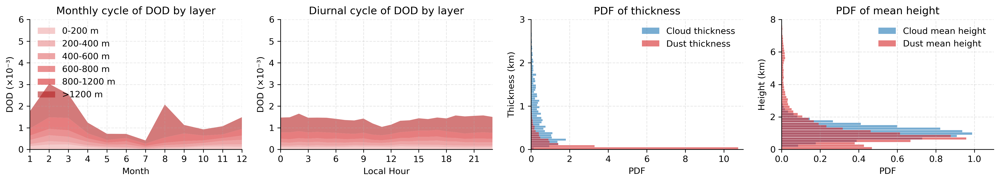

In [94]:
import numpy as np
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 3), dpi=300)
hours, months = np.arange(24), np.arange(1, 13)

# ===================== (1) Monthly DOD by layer =====================
y, yticks = np.zeros(12), np.linspace(0, 0.006, 7)
for vals, (_, lab, col) in zip(layer_month_means, order):
    ax1.fill_between(months, y, y+vals, color=col, alpha=0.6, label=lab, edgecolor="none", linewidth=0); y += vals
ax1.set(xlim=(1,12), ylim=(0,0.006), xticks=months, xlabel="Month", ylabel="DOD (×10⁻³)", title="Monthly cycle of DOD by layer")
ax1.set_yticks(yticks); ax1.set_yticklabels([f"{v*1e3:.0f}" for v in yticks]); ax1.grid(alpha=0.25, ls="--"); ax1.legend(loc="upper left", frameon=False)

# ===================== (2) Diurnal DOD by layer =====================
y = np.zeros(24)
for vals, (_, _, col) in zip(layer_hour_means, order):
    ax2.fill_between(hours, y, y+vals, color=col, alpha=0.6, edgecolor="none", linewidth=0); y += vals
ax2.set(xlim=(0,23), ylim=(0,0.006), xticks=np.arange(0,24,3), xlabel="Local Hour", ylabel="DOD (×10⁻³)", title="Diurnal cycle of DOD by layer")
ax2.set_yticks(yticks); ax2.set_yticklabels([f"{v*1e3:.0f}" for v in yticks]); ax2.grid(alpha=0.3, ls="--")
# ========= PDF barh helper (custom bin) =========
hbar = lambda ax, a, bw, c, l, s=0: (
    lambda h,e: ax.barh(0.5*(e[:-1]+e[1:])+s, h, height=bw*0.9, color=c, alpha=0.6, label=l)
)(*np.histogram(
    a[np.isfinite(a)],
    bins=np.arange(np.nanmin(a)//bw*bw, np.nanmax(a)//bw*bw + bw, bw),
    density=True
))

# ========= ax3: thickness PDF (bin = 0.2 km) =========
hbar(ax3, cloud_thickness_low_warm, 0.05, "tab:blue", "Cloud thickness", )
hbar(ax3, dust_thickness,           0.05, "tab:red",  "Dust thickness",  )
ax3.set(xlabel="PDF", ylabel="Thickness (km)", title="PDF of thickness")
ax3.grid(alpha=0.3, ls="--"); ax3.legend(frameon=False)
ax3.set_ylim(0, 3) 
ax3.set_xlim(0, 11)
ax3.set_yticks([0, 1, 2, 3])
# ========= ax4: mean height PDF (bin = 0.5 km) =========
hbar(ax4, cloud_mean_height_low_warm, 0.15, "tab:blue", "Cloud mean height",)
hbar(ax4, dust_mean_height,           0.15, "tab:red",  "Dust mean height",)
ax4.set(xlabel="PDF", ylabel="Height (km)", title="PDF of mean height")
ax4.grid(alpha=0.3, ls="--"); ax4.legend(frameon=False)
ax4.set_ylim(0, 8) 
ax4.set_xlim(0, 1.1)
# # ===================== (3) Seasonal mean dust extinction profile =====================
# season_colors = {"MAM":"tab:green","JJA":"tab:red","SON":"tab:orange","DJF":"tab:blue"}
# for s in ["MAM","JJA","SON","DJF"]:
#     ax3.plot(da_season.sel(season=s).values, da_season["height_high"].values, lw=1, color=season_colors[s], label=s)
# ax3.set(xscale="log", xlim=(1e-4,0.2), xticks=[1e-4,1e-3,1e-2,1e-1,0.2], ylim=(0,8),
#         xlabel="Dust extinction (1/km)", ylabel="Height (km)", title="Seasonal mean dust extinction profile")
# ax3.xaxis.set_major_formatter(ticker.FuncFormatter(lambda v, p: f"{v:g}"))
# ax3.grid(alpha=0.3, ls="--"); ax3.legend(loc="best", frameon=False)

# # ===================== (4) Hourly extinction profiles =====================
# ax4.plot(ext_hourly.sel(hour=2).values,  ext_hourly.height_high.values,  lw=1, color="tab:blue",   label="02:00")
# ax4.plot(ext_hourly.sel(hour=11).values, ext_hourly.height_high.values,  lw=1, color="tab:orange", label="11:00")
# ax4.plot(ext_mean.values,                ext_mean.height_high.values,   "k--", lw=1, label="24h mean")
# ax4.set(xscale="log", xlim=(1e-4,0.2), xticks=[1e-4,1e-3,1e-2,1e-1,0.2], ylim=(0,8),
#         xlabel="Dust extinction (1/km)", ylabel="Height (km)", title="Extinction profiles at 02, 11, 24h mean")
# ax4.xaxis.set_major_formatter(ticker.FuncFormatter(lambda v, p: f"{v:g}"))
# ax4.grid(alpha=0.3, ls="--"); ax4.legend(loc="best", frameon=False)

for ax in (ax1, ax2, ax3, ax4):
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("figsave/ENA_dust_chara.pdf", dpi=300, bbox_inches="tight")
plt.show()

In [95]:
order_cloud = [
    ("cloud_COD_0_200m",     "0-200 m",     "#a5c9e1"),
    ("cloud_COD_200_400m",   "200-400 m",   "#84b4d6"),
    ("cloud_COD_400_600m",   "400-600 m",   "#62a0cb"),
    ("cloud_COD_600_800m",   "600-800 m",   "#418bbf"),
    ("cloud_COD_800_1200m",  "800-1200 m",  "#1f77b4"),
    ("cloud_COD_1200_3000m", "1200-3000 m", "#1a6599"),
]


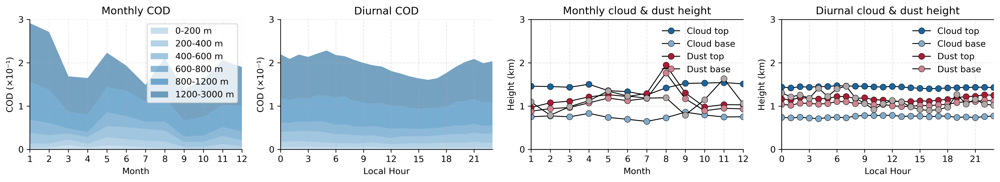

In [96]:
import matplotlib.pyplot as plt
import numpy as np

# =======================
# Fixed style knobs
# =======================
FIGSIZE, DPI = (16, 3), 300
ALPHA_FILL = 0.6
COD_YLIM = (0, 0.3)
COD_YTICKS = [0.0, 0.1, 0.2, 0.3]
COD_YTICKLAB = ["0", "1", "2", "3"]
H_YLIM, H_YTICKS = (0, 3), [0, 1, 2, 3]
GRID1, GRID2 = dict(alpha=0.25, ls="--"), dict(alpha=0.3, ls="--")
FILL_KW = dict(alpha=ALPHA_FILL, linewidth=0, edgecolor="none")

MS, MEW = 7, 0.4
LINE_KW = dict(color="k", lw=1, marker="o", ms=MS, mec="k", mew=MEW)

# top colors (unchanged)
CLOUD_TOP_KW = dict(mfc="#1a659e")
DUST_TOP_KW  = dict(mfc="#a71e34")

# base colors (modified)
CLOUD_BASE_KW = dict(mfc="#81aaca")
DUST_BASE_KW  = dict(mfc="#cf838f")

# =======================
# Figure / axes
# =======================
fig, axes = plt.subplots(1, 4, figsize=FIGSIZE, dpi=DPI)
ax1, ax2, ax3, ax4 = axes
hours, months = np.arange(24), np.arange(1, 13)

# =======================
# (1) Monthly stacked COD
# =======================
y = np.zeros_like(months, dtype=float)
for vals, (_, lab, col) in zip(cloud_layer_month_means, order_cloud):
    ax1.fill_between(months, y, y + vals, color=col, label=lab, **FILL_KW)
    y += vals

ax1.set(
    xlim=(1, 12), ylim=COD_YLIM,
    xticks=months, yticks=COD_YTICKS, yticklabels=COD_YTICKLAB,
    xlabel="Month", ylabel="COD (×10⁻¹)", title="Monthly COD"
)
ax1.grid(**GRID1)
ax1.legend(loc="upper right", frameon=True)

# =======================
# (2) Diurnal stacked COD
# =======================
y = np.zeros_like(hours, dtype=float)
for vals, (_, _, col) in zip(cloud_layer_hour_means, order_cloud):
    ax2.fill_between(hours, y, y + vals, color=col, **FILL_KW)
    y += vals

ax2.set(
    xlim=(0, 23), ylim=COD_YLIM,
    xticks=np.arange(0, 24, 3),
    yticks=COD_YTICKS, yticklabels=COD_YTICKLAB,
    xlabel="Local Hour", ylabel="COD (×10⁻¹)", title="Diurnal COD"
)
ax2.grid(**GRID2)

# =======================
# (3) Monthly heights — markers only
# =======================
ax3.plot(months, ctop_low_mean,  label="Cloud top",  **LINE_KW, **CLOUD_TOP_KW)
ax3.plot(months, cbase_low_mean, label="Cloud base", **LINE_KW, **CLOUD_BASE_KW)
ax3.plot(months, dtop_month_mean,  label="Dust top",  **LINE_KW, **DUST_TOP_KW)
ax3.plot(months, dbase_month_mean, label="Dust base", **LINE_KW, **DUST_BASE_KW)

ax3.set(
    xlim=(1, 12), ylim=H_YLIM, yticks=H_YTICKS, xticks=months,
    xlabel="Month", ylabel="Height (km)", title="Monthly cloud & dust height"
)
ax3.grid(**GRID2)
ax3.legend(loc="upper right", frameon=False)

# =======================
# (4) Diurnal heights — markers only
# =======================
ax4.plot(hours, ctop_low_hour_mu,  label="Cloud top",  **LINE_KW, **CLOUD_TOP_KW)
ax4.plot(hours, cbase_low_hour_mu, label="Cloud base", **LINE_KW, **CLOUD_BASE_KW)
ax4.plot(hours, dtop_hour_mean,  label="Dust top",  **LINE_KW, **DUST_TOP_KW)
ax4.plot(hours, dbase_hour_mean, label="Dust base", **LINE_KW, **DUST_BASE_KW)

ax4.set(
    xlim=(0, 23), ylim=H_YLIM, yticks=H_YTICKS,
    xticks=np.arange(0, 24, 3),
    xlabel="Local Hour", ylabel="Height (km)", title="Diurnal cloud & dust height"
)
ax4.grid(**GRID2)
ax4.legend(loc="upper right", frameon=False)





# --- twin y-axis for LWP (monthly) ---
ax3_lwp = ax3.twinx()
ax3_lwp.plot(
    months, lwp_low_mean,
    "-o", lw=1, color="k", mew=0.4,   
    mec="k", mfc="#b1a7a6", ms=7, alpha=1
)

# hide twin y-axis
ax3_lwp.set_ylim(50, 140)
ax3_lwp.tick_params(right=False, labelright=False)
ax3_lwp.spines["right"].set_visible(False)



# --- twin y-axis for LWP (diurnal) ---
ax4_lwp = ax4.twinx()
ax4_lwp.plot(
    hours, lwp_low_hour,
    "-o", lw=1, color="k", mew=0.4,   
    mec="k", mfc="#b1a7a6", ms=7, alpha=1
)

# hide twin y-axis
ax4_lwp.set_ylim(50, 140)
ax4_lwp.tick_params(right=False, labelright=False)
ax4_lwp.spines["right"].set_visible(False)

# =======================
# Common style
# =======================
for ax in axes:
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("figsave/ENA_cloud_chara.pdf", dpi=DPI, bbox_inches="tight")
plt.show()

## Break down to 5 catagries

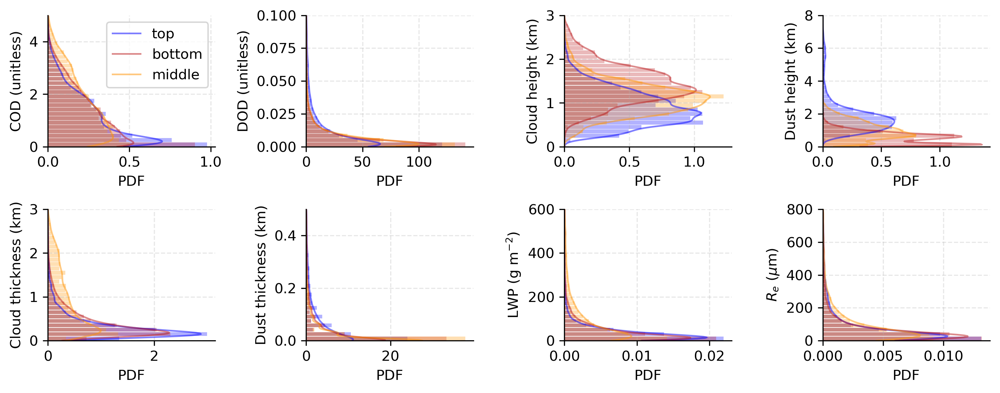

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

cats_to_plot = ["top", "bottom", "middle"]
cat_colors = {"top": "b", "bottom": "#ba181b", "middle": "#ff9505"}

def plot_pdf_hist(ax, data_list, labels, colors, yrange, nbins=30):
    lo, hi = yrange
    clean = []
    for d, lab, col in zip(data_list, labels, colors):
        if d is None: 
            continue
        arr = np.asarray(d)
        arr = arr[np.isfinite(arr)]
        arr = arr[(arr >= lo) & (arr <= hi)]
        if arr.size < 5: 
            continue
        clean.append((arr, lab, col))

    if not clean:
        ax.text(0.5, 0.5, "No Data", ha="center", va="center", transform=ax.transAxes)
        return

    # ==== 计算 bins ====
    bins = np.linspace(lo, hi, nbins + 1)
    centers = 0.5 * (bins[:-1] + bins[1:])
    bin_h = (hi - lo) / nbins * 0.9

    for arr, lab, col in clean:

        # ======= ⭐ 柱状图（PDF histogram）======
        hist, _ = np.histogram(arr, bins=bins, density=True)
        ax.barh(
            centers, hist, height=bin_h,
            color=col, alpha=0.3, edgecolor=None
        )

        # ======= ⭐ KDE 曲线 =======
        if arr.size > 5:
            try:
                kde = gaussian_kde(arr)
                y_kde = np.linspace(lo, hi, 200)
                x_kde = kde(y_kde)
                ax.plot(x_kde, y_kde, color=col, linewidth=1.2, alpha=0.5, label=lab)
            except Exception:
                pass

    ax.set_xlim(left=0); ax.set_ylim(lo, hi)
    ax.legend()


var_configs = [
    dict(key="COD_by_cat",       title="COD",              yrange=(0, 5),    ylabel="COD (unitless)"),
    dict(key="DOD_by_cat",       title="DOD",              yrange=(0, 0.1),  ylabel="DOD (unitless)"),
    dict(key="cloud_mh_by_cat",  title="Cloud Mean Height",yrange=(0, 3),    ylabel="Cloud height (km)"),
    dict(key="dust_mh_by_cat",   title="Dust Mean Height", yrange=(0, 8),    ylabel="Dust height (km)"),
    dict(key="cloud_tn_by_cat",  title="Cloud Thickness",  yrange=(0, 3),    ylabel="Cloud thickness (km)"),
    dict(key="dust_tn_by_cat",   title="Dust Thickness",   yrange=(0, 0.5),  ylabel="Dust thickness (km)"),
    dict(key="lwp_by_cat",       title="LWP",              yrange=(0, 600),  ylabel=r"LWP (g m$^{-2}$)"),
    dict(key="re_by_cat",        title=r"$R_e$",           yrange=(0, 800),  ylabel=r"$R_e$ ($\mu$m)"),
]

n_rows, n_cols = 2, 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 4), dpi=300)
plt.subplots_adjust(hspace=0.35, wspace=0.3)
axes_flat = axes.ravel()

for idx, (ax, cfg) in enumerate(zip(axes_flat, var_configs)):
    data_dict = globals()[cfg["key"]]
    data_list = [data_dict[cat] for cat in cats_to_plot]
    labels    = cats_to_plot
    colors    = [cat_colors[cat] for cat in cats_to_plot]

    plot_pdf_hist(ax, data_list=data_list, labels=labels, colors=colors, yrange=cfg["yrange"], nbins=30)

    # ⭐ 只保留第 1 张图的 legend
    if idx != 0 and ax.get_legend() is not None:
        ax.get_legend().remove()

    ax.set_xlabel("PDF"); 
    ax.set_ylabel(cfg["ylabel"]); 
    ax.grid(ls="--", alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
# 删除空图（如果不足 8）
if len(var_configs) < n_rows * n_cols:
    for k in range(len(var_configs), n_rows * n_cols):
        fig.delaxes(axes_flat[k])

plt.tight_layout()
# plt.savefig("figsave/ENA_3_chara.pdf", dpi=300, bbox_inches='tight')
plt.show()


## monthly and diurnal variability of 5 cate

In [118]:
import numpy as np

# 3个类别的 df
dfs = {"top": df_top.copy(), "middle": df_middle.copy(), "bottom": df_bottom.copy()}

# 你要追加的所有 by_cat 变量（列名 -> dict）
bycats = {
    "cloud_mh": cloud_mh_by_cat,
    "dust_mh":  dust_mh_by_cat,
    "cloud_tn": cloud_tn_by_cat,
    "dust_tn":  dust_tn_by_cat,

    "dust_th":  dust_th_by_cat,
    "dust_bh":  dust_bh_by_cat,
    "cloud_th": cloud_th_by_cat,
    "cloud_bh": cloud_bh_by_cat,

    "COD":      COD_by_cat,
    "DOD":      DOD_by_cat,
    "LWP":      lwp_by_cat,
    "LWC":      lwc_by_cat,
    "Re":       re_by_cat,
    "CF":       cf_by_cat,
}

# 只加 top/middle/bottom
for cat, df in dfs.items():
    n = len(df)
    for col, dct in bycats.items():
        arr = np.asarray(dct[cat])
        if arr.shape[0] != n:
            raise ValueError(f"[{cat}] {col} length mismatch: df={n}, arr={arr.shape[0]}")
        df[col] = arr  # 追加到最右边
    dfs[cat] = df

df_top_new    = dfs["top"]
df_middle_new = dfs["middle"]
df_bottom_new = dfs["bottom"]


## Influence of Meteorology Covariation

In [32]:
RH   =  ds_mete.RH_750_850.values
TEMP =  ds_mete.TEMP_750_850.values
VWS  =  ds_mete.VWS_725_925.values
LTS  =  ds_mete.LTS.values
VV   =  ds_vv.w_750_850.values
RR   =  ds_p.rain_rate.values

mask_valid = ~np.isnan(labels)

dust_AOD_valid = dust_AOD[mask_valid]
COD_valid      = COD[mask_valid]
lwp_valid      = lwp[mask_valid]
RH_valid       = RH[mask_valid]
TEMP_valid     = TEMP[mask_valid]
VWS_valid      = VWS[mask_valid]
LTS_valid      = LTS[mask_valid]
VV_valid       = VV[mask_valid]

In [33]:
RH_34   =  ds_mete2.RH_34.values
TEMP_34 =  ds_mete2.T_34.values
Wind_surf  =  ds_mete2.Wind_surf.values
TEMP_surf  =  ds_mete2.T_surf.values
VV_4   =  ds_vv.w_750_850.values
lts_1 = ds_lts.LTS.values
lts_2 = ds_lts2.LTS.values

In [34]:
import numpy as np

def split_by_quantile(var, q=[0, 1/3, 2/3, 1]):
    """按分位数将变量划分为三段（low/mid/high），返回索引字典"""
    bins = np.nanquantile(var, q)
    idx_low  = (var >= bins[0]) & (var < bins[1])
    idx_mid  = (var >= bins[1]) & (var < bins[2])
    idx_high = (var >= bins[2]) & (var <= bins[3])
    return {"low": idx_low, "mid": idx_mid, "high": idx_high}

# ===== 按分位数划分 =====
rh_bins  = split_by_quantile(RH_valid)
lts_bins = split_by_quantile(LTS_valid)
vws_bins = split_by_quantile(VWS_valid)
vv_bins = split_by_quantile(VV_valid)

# ===== 获取每档对应的 dust_AOD / COD / LWP =====
def extract_by_bins(bins_dict, name):
    out = {}
    for k, idx in bins_dict.items():
        out[k] = {
            "dust_AOD": dust_AOD_valid[idx],
            "COD":      COD_valid[idx],
            "LWP":      lwp_valid[idx],
        }
        print(f"{name} {k}: {np.sum(idx)} samples")
    return out

rh_groups  = extract_by_bins(rh_bins,  "RH")
lts_groups = extract_by_bins(lts_bins, "LTS")
vws_groups = extract_by_bins(vws_bins, "VWS")
vv_groups = extract_by_bins(vv_bins, "VV")

RH low: 16592 samples
RH mid: 16592 samples
RH high: 16592 samples
LTS low: 16592 samples
LTS mid: 16592 samples
LTS high: 16592 samples
VWS low: 16592 samples
VWS mid: 16592 samples
VWS high: 16592 samples
VV low: 13963 samples
VV mid: 13963 samples
VV high: 13964 samples


In [35]:
import numpy as np
import matplotlib.pyplot as plt

# ========= 参数（可调） =========
window_width = 0.010   # 滑动窗口的x宽度（dust_AOD的绝对尺度）
step          = 0.001  # 窗口步长（越小越平滑）
min_count_win = 8      # 每个窗口最少样本数（用于过滤稀疏窗口）
q_clip        = (0.05, 0.95)  # 去极值分位

# ========= 工具函数 =========
def split_by_quantile(var, q=(0, 1/3, 2/3, 1)):
    """
    按分位数将变量划分为三段（low/mid/high），返回布尔索引字典和边界。
    var: 1-D ndarray
    """
    var = np.asarray(var, dtype=float)
    finite = np.isfinite(var)
    if finite.sum() == 0:
        edges = np.array([np.nan, np.nan, np.nan, np.nan])
        zeros = np.zeros_like(var, dtype=bool)
        return {"low": zeros, "mid": zeros, "high": zeros}, edges
    edges = np.nanquantile(var[finite], q)
    # 低、中为左闭右开，高为闭区间，避免边界丢点
    idx_low  = (var >= edges[0]) & (var <  edges[1])
    idx_mid  = (var >= edges[1]) & (var <  edges[2])
    idx_high = (var >= edges[2]) & (var <= edges[3])
    return {"low": idx_low, "mid": idx_mid, "high": idx_high}, edges

def moving_window_xy(x, y, xmin, xmax, width, step):
    """
    对 (x, y) 做滑动窗口平均，返回字典：
    centers, x_mean, y_mean, y_sem, count
    """
    centers = np.arange(xmin + width/2, xmax - width/2 + step/2, step)

    x_mean = np.full_like(centers, np.nan, dtype=float)
    y_mean = np.full_like(centers, np.nan, dtype=float)
    y_sem  = np.full_like(centers, np.nan, dtype=float)
    count  = np.zeros_like(centers, dtype=int)

    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size == 0:
        return {"centers": centers, "x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

    half = width / 2.0
    for i, c in enumerate(centers):
        sel = (x >= c - half) & (x < c + half)
        if sel.any():
            xb, yb = x[sel], y[sel]
            count[i]  = xb.size
            x_mean[i] = np.nanmean(xb)
            y_mean[i] = np.nanmean(yb)
            if xb.size > 1:
                y_sem[i] = np.nanstd(yb, ddof=1) / np.sqrt(xb.size)

    return {"centers": centers, "x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

# ========= 1) 用 labels 做基础有效筛选 =========
# 这里假设你已经在上一步得到了：labels, dust_AOD, COD, lwp, RH, LTS, VWS（shape完全一致）
# 并且 labels 中 NaN 表示无效位置
mask_valid = ~np.isnan(labels)

# 取出有效样本（注意：如果这些是 xarray.DataArray/dask，需要 .compute().values 或 np.asarray）
x_all   = np.asarray(dust_AOD[mask_valid])   # dust_AOD 有效样本
COD_all = np.asarray(COD[mask_valid])
LWP_all = np.asarray(lwp[mask_valid])
RH_all  = np.asarray(RH[mask_valid])
LTS_all = np.asarray(LTS[mask_valid])
VWS_all = np.asarray(VWS[mask_valid])

# ========= 2) 用 dust_AOD 的 5–95% 分位去极值，并同步应用到其它变量 =========
finite_x = np.isfinite(x_all)
if finite_x.sum() == 0:
    raise ValueError("dust_AOD 有效样本全为 NaN，无法计算分位数。")

q_lo, q_hi = np.nanquantile(x_all[finite_x], q_clip)
keep = (x_all >= q_lo) & (x_all <= q_hi)
# 同步保证 y 与分组变量都是有限值
keep &= np.isfinite(COD_all) & np.isfinite(LWP_all)
keep &= np.isfinite(RH_all) & np.isfinite(LTS_all) & np.isfinite(VWS_all)

x      = x_all[keep]
COD_y  = COD_all[keep]
LWP_y  = LWP_all[keep]
RH_g   = RH_all[keep]
LTS_g  = LTS_all[keep]
VWS_g  = VWS_all[keep]

# ========= 3) 三分位分组（RH / LTS / VWS 各三组） =========
rh_bins,  rh_edges  = split_by_quantile(RH_g)
lts_bins, lts_edges = split_by_quantile(LTS_g)
vws_bins, vws_edges = split_by_quantile(VWS_g)

groups = {
    "RH":  (rh_bins,  rh_edges),
    "LTS": (lts_bins, lts_edges),
    "VWS": (vws_bins, vws_edges),
}

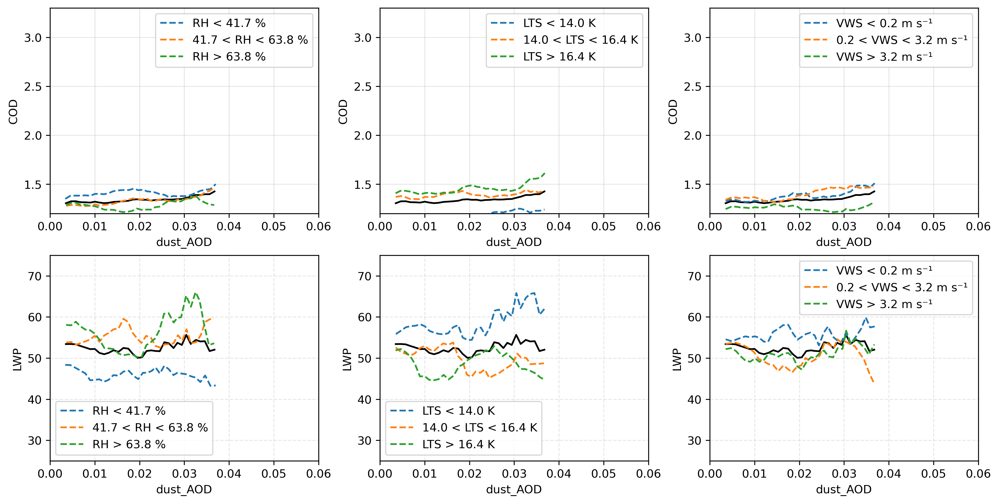

In [36]:
# ========= 4) 绘图（2行×3列）：上排 y=COD，下排 y=LWP；每列对应 RH/LTS/VWS =========
fig, axes = plt.subplots(2, 3, figsize=(12, 6), dpi=300, constrained_layout=True)

linestyles = {"low": "--", "mid": "--", "high": "--", "All": "-"}
# 单位映射表
unit_map = { "RH": "%","LTS": "K","VWS": "m s⁻¹"}

if x.size == 0:
    raise ValueError("筛掉极端值后没有可用样本。请检查 q_clip 或数据是否过少。")

xmin, xmax = np.nanmin(x), np.nanmax(x)

for j, (gv_name, (bin_dict, edges)) in enumerate(groups.items()):
    # ---------- 第一行：COD ----------
    ax_cod = axes[0, j]
    unit = unit_map.get(gv_name, "")
    # 绘制 All data（不出现在图例）
    res_all = moving_window_xy(x, COD_y, xmin, xmax, window_width, step)
    m_all = res_all["count"] >= min_count_win
    ax_cod.plot(res_all["x_mean"][m_all], res_all["y_mean"][m_all],
                color="black", linestyle=linestyles["All"], label="_nolegend_")

    # 仅画三个区间线
    idx_low, idx_mid, idx_high = bin_dict["low"], bin_dict["mid"], bin_dict["high"]
    labels_formatted = [
        f"{gv_name} < {edges[1]:.1f} {unit}",
        f"{edges[1]:.1f} < {gv_name} < {edges[2]:.1f} {unit}",
        f"{gv_name} > {edges[2]:.1f} {unit}"
    ]
    idx_list = [idx_low, idx_mid, idx_high]

    for idx, lbl, style in zip(idx_list, labels_formatted, ["--", "--", "--"]):
        if idx.sum() == 0:
            continue
        res = moving_window_xy(x[idx], COD_y[idx], xmin, xmax, window_width, step)
        m = res["count"] >= min_count_win
        ax_cod.plot(res["x_mean"][m], res["y_mean"][m],
                    label=lbl, linestyle=style)

    ax_cod.set_xlabel("dust_AOD")
    ax_cod.set_ylabel("COD")
    ax_cod.grid(True, alpha=0.3)
    ax_cod.set_xlim(0, 0.06)
    ax_cod.set_ylim(1.2, 3.3)
    ax_cod.legend()

    # ---------- 第二行：LWP ----------
    ax_lwp = axes[1, j]

    res_all = moving_window_xy(x, LWP_y, xmin, xmax, window_width, step)
    m_all = res_all["count"] >= min_count_win
    ax_lwp.plot(res_all["x_mean"][m_all], res_all["y_mean"][m_all],
                color="black", linestyle=linestyles["All"], label="_nolegend_")

    for idx, lbl, style in zip(idx_list, labels_formatted, ["--", "--", "--"]):
        if idx.sum() == 0:
            continue
        res = moving_window_xy(x[idx], LWP_y[idx], xmin, xmax, window_width, step)
        m = res["count"] >= min_count_win
        ax_lwp.plot(res["x_mean"][m], res["y_mean"][m],
                    label=lbl, linestyle=style)

    ax_lwp.set_xlabel("dust_AOD")
    ax_lwp.set_ylabel("LWP")
    ax_lwp.grid(ls='--', alpha=0.3)
    ax_lwp.set_xlim(0, 0.06)
    ax_lwp.set_ylim(25, 75)
    ax_lwp.legend()

plt.show()

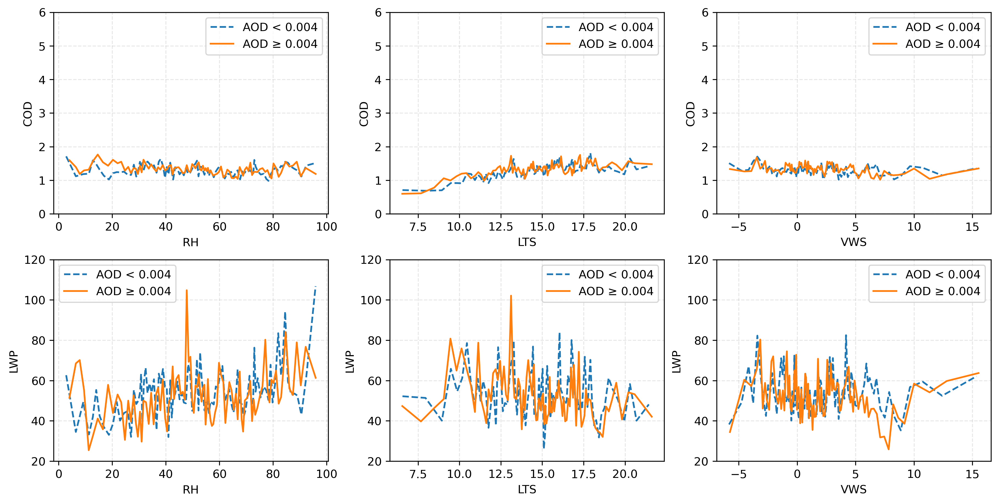

dust_AOD 去极值分位阈值: (0.05, 0.95) => [0.000, 0.042]
AOD 分组阈值 aod_split = 0.004  (中位数)
等频分箱: n_bins=100, 过滤条件: count >= 8


In [37]:
import numpy as np
import matplotlib.pyplot as plt

# ========= 参数 =========
q_clip        = (0.05, 0.95)   # dust_AOD 去极值分位
AOD_SPLIT     = None           # None=用去极值后的中位数；若要固定阈值（如论文 0.146），设为 0.146
n_bins        = 100            # 等频分箱数量
min_count_bin = 8              # 每个bin最少样本数（过小会抖动，可视数据量调整）

# ========= 等频滑动平均 =========
def equal_frequency_xy(x, y, n_bins=100):
    """
    等频平滑：将 x 升序排序并等分为 n_bins 份，每份样本数尽量相等。
    返回 dict: x_mean, y_mean, y_sem, count
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size == 0:
        return {"x_mean": np.array([]), "y_mean": np.array([]), "y_sem": np.array([]), "count": np.array([])}
    order = np.argsort(x)
    x_sorted, y_sorted = x[order], y[order]
    n = x_sorted.size
    # 边界索引（等频分箱）
    edges = np.linspace(0, n, n_bins + 1, dtype=int)

    x_mean = np.full(n_bins, np.nan)
    y_mean = np.full(n_bins, np.nan)
    y_sem  = np.full(n_bins, np.nan)
    count  = np.zeros(n_bins, dtype=int)

    for i in range(n_bins):
        s, e = edges[i], edges[i+1]
        if e - s < 1:
            continue
        xb, yb = x_sorted[s:e], y_sorted[s:e]
        x_mean[i] = np.nanmean(xb)
        y_mean[i] = np.nanmean(yb)
        count[i]  = xb.size
        if xb.size > 1:
            y_sem[i] = np.nanstd(yb, ddof=1) / np.sqrt(xb.size)

    return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

# ========= 0) 基础有效筛选（若你已用 labels 做过筛选，就沿用；否则全 True）========
try:
    base_mask = ~np.isnan(labels)
except NameError:
    base_mask = np.ones_like(dust_AOD, dtype=bool)

# 转为 numpy 并套用基础掩膜
x_aod  = np.asarray(dust_AOD)[base_mask]
COD_y  = np.asarray(COD)[base_mask]
LWP_y  = np.asarray(lwp)[base_mask]
RH_x   = np.asarray(RH)[base_mask]
LTS_x  = np.asarray(LTS)[base_mask]
VWS_x  = np.asarray(VWS)[base_mask]

# ========= 1) dust_AOD 5–95% 去极值，并同步到所有变量 =========
finite = np.isfinite(x_aod)
if finite.sum() == 0:
    raise ValueError("dust_AOD 有效样本全为 NaN，无法计算分位数。")
q_lo, q_hi = np.nanquantile(x_aod[finite], q_clip)

keep = (x_aod >= q_lo) & (x_aod <= q_hi)
keep &= np.isfinite(COD_y) & np.isfinite(LWP_y)
keep &= np.isfinite(RH_x) & np.isfinite(LTS_x) & np.isfinite(VWS_x)

x_aod = x_aod[keep]
COD_y = COD_y[keep]
LWP_y = LWP_y[keep]
RH_x  = RH_x[keep]
LTS_x = LTS_x[keep]
VWS_x = VWS_x[keep]

if x_aod.size == 0:
    raise ValueError("去极值后样本为空，请调整 q_clip 或检查数据。")

# ========= 2) AOD 高低分组（默认中位数；可改为固定 0.146）=========
aod_split = np.nanmedian(x_aod) if AOD_SPLIT is None else float(AOD_SPLIT)
idx_lowAOD  = x_aod <  aod_split
idx_highAOD = x_aod >= aod_split

# ========= 3) 画 2×3 图：上排 COD，下排 LWP；列为 RH/LTS/VWS =========
fig, axes = plt.subplots(2, 3, figsize=(12, 6), dpi=300, constrained_layout=True)

pairs = [
    ("RH",  RH_x,  "COD", COD_y, (0, 0), {"ylim": (0, 6)}),
    ("LTS", LTS_x, "COD", COD_y, (0, 1), {"ylim": (0, 6)}),
    ("VWS", VWS_x, "COD", COD_y, (0, 2), {"ylim": (0, 6)}),
    ("RH",  RH_x,  "LWP", LWP_y, (1, 0), {"ylim": (20, 120)}),
    ("LTS", LTS_x, "LWP", LWP_y, (1, 1), {"ylim": (20, 120)}),
    ("VWS", VWS_x, "LWP", LWP_y, (1, 2), {"ylim": (20, 120)}),
]

for name_x, xvar, name_y, yvar, (ri, ci), opts in pairs:
    ax = axes[ri, ci]

    # 低 AOD（虚线）
    if np.any(idx_lowAOD):
        res_low = equal_frequency_xy(xvar[idx_lowAOD], yvar[idx_lowAOD], n_bins=n_bins)
        m = res_low["count"] >= min_count_bin
        ax.plot(res_low["x_mean"][m], res_low["y_mean"][m],
                linestyle="--", label=f"AOD < {aod_split:.3f}")

    # 高 AOD（实线）
    if np.any(idx_highAOD):
        res_high = equal_frequency_xy(xvar[idx_highAOD], yvar[idx_highAOD], n_bins=n_bins)
        m = res_high["count"] >= min_count_bin
        ax.plot(res_high["x_mean"][m], res_high["y_mean"][m],
                linestyle="-", label=f"AOD ≥ {aod_split:.3f}")

    ax.set_xlabel(name_x)
    ax.set_ylabel(name_y)
    ax.grid(ls='--', alpha=0.3)
    if "ylim" in opts:
        ax.set_ylim(*opts["ylim"])
    ax.legend()

plt.show()

print(f"dust_AOD 去极值分位阈值: {q_clip} => [{q_lo:.3f}, {q_hi:.3f}]")
print(f"AOD 分组阈值 aod_split = {aod_split:.3f}  ({'中位数' if AOD_SPLIT is None else '自定义'})")
print(f"等频分箱: n_bins={n_bins}, 过滤条件: count >= {min_count_bin}")


### Mete of 5 Categories

In [38]:
RH_by_cat = {}
TEMP_by_cat  = {}
VWS_by_cat = {}
LTS_by_cat = {}
VV_by_cat  = {}
V600_by_cat = {}

for name in cat_names:
    
    lab_id = class_map[name]
    
    RH_by_cat[name]    = extract_event_means(labels, RH, lab_id)
    TEMP_by_cat[name]  = extract_event_means(labels, TEMP, lab_id)
    VWS_by_cat[name]   = extract_event_means(labels, VWS, lab_id)
    LTS_by_cat[name]   = extract_event_means(labels, LTS, lab_id)
    VV_by_cat[name]    = extract_event_means(labels, VV, lab_id)
    V600_by_cat[name]  = extract_event_means(labels, V600, lab_id)
    

In [39]:
RH_34_by_cat = {}
TEMP_34_by_cat  = {}
Wind_surf_by_cat = {}
TEMP_surf_by_cat = {}
VV_4_by_cat = {}
lts_1_by_cat = {}
lts_2_by_cat = {}

for name in cat_names:
    
    lab_id = class_map[name]
    
    RH_34_by_cat[name]    = extract_event_means(labels, RH_34, lab_id)
    TEMP_34_by_cat[name]  = extract_event_means(labels, TEMP_34, lab_id)
    Wind_surf_by_cat[name]   = extract_event_means(labels, Wind_surf, lab_id)
    TEMP_surf_by_cat[name]   = extract_event_means(labels, TEMP_surf, lab_id)
    VV_4_by_cat[name]  = extract_event_means(labels, VV_4, lab_id)
    lts_1_by_cat[name] = extract_event_means(labels, lts_1, lab_id)
    lts_2_by_cat[name] = extract_event_means(labels, lts_2, lab_id)

In [47]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from collections import defaultdict
# ========= 参数（可调） =========
window_width = 0.01   # 滑动窗口的 x 宽度（dust AOD 的绝对尺度）
step          = 0.001  # 窗口步长
min_count_win = 8      # 每个窗口最少样本数（过滤稀疏窗口）
q_clip        = (0.05, 0.95)  # 去极值分位（对 x 和 y 分别按该分位裁剪）



# ======== 三分位函数 ========
def split_by_quantile(var, q=(0, 1/3, 2/3, 1), mask=None):
    var = np.asarray(var)
    if mask is None:
        mask = np.isfinite(var)
    else:
        mask = np.isfinite(var) & mask

    qs = np.quantile(var[mask], q)
    labels = np.full(var.shape, np.nan)
    for i in range(len(qs)-1):
        left, right = qs[i], qs[i+1]
        if i < len(qs)-2:
            sel = (var >= left) & (var < right)
        else:
            sel = (var >= left) & (var <= right)
        labels[sel & mask] = i
    return labels, qs.tolist()


# ======== 滑动窗口函数 ========
def moving_window_xy(x, y, xmin, xmax, width, step):
    x = np.asarray(x)
    y = np.asarray(y)
    good = np.isfinite(x) & np.isfinite(y)
    x, y = x[good], y[good]
    if x.size == 0:
        return dict(x_center=np.array([]), y_mean=np.array([]), x_mean=np.array([]),
                    count=np.array([]), y_std=np.array([]))

    # 去极值分位裁剪
    lo_x, hi_x = np.quantile(x, q_clip)
    lo_y, hi_y = np.quantile(y, q_clip)
    keep = (x >= lo_x) & (x <= hi_x) & (y >= lo_y) & (y <= hi_y)
    x, y = x[keep], y[keep]
    if x.size == 0:
        return dict(x_center=np.array([]), y_mean=np.array([]), x_mean=np.array([]),
                    count=np.array([]), y_std=np.array([]))

    centers = np.arange(xmin + width/2, xmax - width/2 + step/2, step)
    x_center_list, y_mean_list, x_mean_list, count_list, y_std_list = [], [], [], [], []
    half = width / 2.0
    for c in centers:
        sel = (x >= (c - half)) & (x < (c + half))
        if not np.any(sel):
            continue
        n = sel.sum()
        if n < min_count_win:
            continue
        xs = x[sel]
        ys = y[sel]
        x_center_list.append(c)
        y_mean_list.append(np.nanmean(ys))
        x_mean_list.append(np.nanmean(xs))
        count_list.append(n)
        y_std_list.append(np.nanstd(ys, ddof=1) if n >= 2 else np.nan)

    return dict(
        x_center=np.asarray(x_center_list),
        y_mean=np.asarray(y_mean_list),
        x_mean=np.asarray(x_mean_list),
        count=np.asarray(count_list),
        y_std=np.asarray(y_std_list),
    )


# ======== 主函数：准备结果 ========
def prepare_tercile_curves_per_category(
    cat_names,
    DOD_by_cat,
    COD_by_cat,
    lwp_by_cat,
    re_by_cat,
    control_vars_by_cat_dict,
    window_width,
    step,
    min_count_win
):
    from collections import defaultdict
    import numpy as np, pandas as pd

    tercile_names = {0: 'low', 1: 'mid', 2: 'high'}
    results = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

    for cat in cat_names:
        x_dod = np.asarray(DOD_by_cat[cat], float)
        y_cod = np.asarray(COD_by_cat[cat], float)
        y_lwp = np.asarray(lwp_by_cat[cat], float)
        y_re  = np.asarray(re_by_cat[cat],  float)

        if np.isfinite(x_dod).sum() == 0:
            continue
        x_lo, x_hi = np.quantile(x_dod[np.isfinite(x_dod)], q_clip)

        for ctrl_name, ctrl_dict in control_vars_by_cat_dict.items():
            ctrl = np.asarray(ctrl_dict[cat], float)

            ok = np.isfinite(x_dod) & np.isfinite(ctrl) & np.isfinite(y_cod) & np.isfinite(y_lwp) & np.isfinite(y_re)
            if ok.sum() == 0:
                continue

            x_use, cod_use, lwp_use, re_use, ctrl_use = x_dod[ok], y_cod[ok], y_lwp[ok], y_re[ok], ctrl[ok]

            # 分位 & 记录边界
            tercile_lbls, edges = split_by_quantile(ctrl_use, q=(0, 1/3, 2/3, 1))
            results[cat][ctrl_name]['_edges'] = edges

            # 三分位曲线
            for t_lbl in [0, 1, 2]:
                terc_name = tercile_names[t_lbl]
                mask_t = (tercile_lbls == t_lbl)

                for target, arr in [('COD', cod_use), ('LWP', lwp_use), ('Re', re_use)]:
                    if mask_t.sum() < min_count_win:
                        results[cat][ctrl_name][target][terc_name] = pd.DataFrame({'x': [], 'y': [], 'count': []})
                        continue
                    mw = moving_window_xy(x_use[mask_t], arr[mask_t],
                                          xmin=x_lo, xmax=x_hi,
                                          width=window_width, step=step)
                    df = pd.DataFrame({'x': mw['x_mean'], 'y': mw['y_mean'], 'count': mw['count']})
                    df = df[np.isfinite(df['x']) & np.isfinite(df['y']) & (df['count'] >= min_count_win)]
                    results[cat][ctrl_name][target][terc_name] = df.reset_index(drop=True)

            # 新增：整体（不分分位）曲线 —— 保存到 '_total'
            for target, arr in [('COD', cod_use), ('LWP', lwp_use), ('Re', re_use)]:
                mw_all = moving_window_xy(x_use, arr, xmin=x_lo, xmax=x_hi, width=window_width, step=step)
                df_all = pd.DataFrame({'x': mw_all['x_mean'], 'y': mw_all['y_mean'], 'count': mw_all['count']})
                df_all = df_all[np.isfinite(df_all['x']) & np.isfinite(df_all['y']) & (df_all['count'] >= min_count_win)]
                results[cat][ctrl_name][target]['_total'] = df_all.reset_index(drop=True)

    return results

# ======= 把控制变量集合好并生成 results =======
control_vars_by_cat_dict = {
    'RH':   RH_by_cat,
    'TEMP': TEMP_by_cat,
    'VWS':  VWS_by_cat,
    'LTS':  LTS_by_cat,
    'VV':   VV_by_cat,
}

results = prepare_tercile_curves_per_category(
    cat_names=cat_names,
    DOD_by_cat=DOD_by_cat,
    COD_by_cat=COD_by_cat,
    lwp_by_cat=lwp_by_cat,
    re_by_cat=re_by_cat,
    control_vars_by_cat_dict=control_vars_by_cat_dict,
    window_width=window_width,
    step=step,
    min_count_win=min_count_win
)

print("keys in results:", list(results.keys()))  # 看看有哪些类别被成功处理


keys in results: ['top', 'bottom', 'middle', 'decreasing', 'increasing']


In [48]:
# ===== 1. 把新的控制变量收集成一个 dict =====
control_vars_by_cat_dict2 = {
    "RH_34":      RH_34_by_cat,
    "TEMP_34":    TEMP_34_by_cat,
    "Wind_surf":  Wind_surf_by_cat,
    "TEMP_surf":  TEMP_surf_by_cat,
    "VV_4":       VV_4_by_cat,
    "lts_1":      lts_1_by_cat,
    "lts_2":      lts_2_by_cat
}

# ===== 2. 调用同一个函数生成 results2 =====
results2 = prepare_tercile_curves_per_category(
    cat_names=cat_names,                 # 和之前一致
    DOD_by_cat=DOD_by_cat,
    COD_by_cat=COD_by_cat,
    lwp_by_cat=lwp_by_cat,
    re_by_cat=re_by_cat,
    control_vars_by_cat_dict=control_vars_by_cat_dict2,
    window_width=window_width,
    step=step,
    min_count_win=min_count_win,
)

print("keys in results2:", list(results2.keys()))
# 比如可以看一个例子：
# df_test = results2['top']['RH_34']['COD']['low']
# print(df_test.head())


keys in results2: ['top', 'bottom', 'middle', 'decreasing', 'increasing']


In [49]:
# ======== 构造 total（5类合并） ========
def _concat_from(d, cats):
    """把字典 d 中指定 cats 的数组安全拼接；若没有数据返回空数组。"""
    arrs = [np.asarray(d[c], float) for c in cats if (c in d)]
    return np.concatenate(arrs) if len(arrs) else np.array([], float)

base_cats = list(cat_names)  # 你原来的5类

# 给主要变量加上 'total'
DOD_by_cat['total'] = _concat_from(DOD_by_cat, base_cats)
COD_by_cat['total'] = _concat_from(COD_by_cat, base_cats)
lwp_by_cat['total'] = _concat_from(lwp_by_cat, base_cats)
re_by_cat['total']  = _concat_from(re_by_cat,  base_cats)

# 给控制变量也加上 'total'
for _ctl_name, _ctl_dict in [
    ('RH', RH_by_cat),
    ('TEMP', TEMP_by_cat),
    ('VWS', VWS_by_cat),
    ('LTS', LTS_by_cat),
    ('VV', VV_by_cat),
]:
    _ctl_dict['total'] = _concat_from(_ctl_dict, base_cats)

# 把 'total' 也纳入类别列表（放在最后，方便作图时排序）
cat_names_with_total = list(base_cats) + ['total']

# ======= 生成 control_vars_by_cat_dict 并计算 results =======
control_vars_by_cat_dict = {
    'RH':   RH_by_cat,
    'TEMP': TEMP_by_cat,
    'VWS':  VWS_by_cat,
    'LTS':  LTS_by_cat,
    'VV':   VV_by_cat,
}

results = prepare_tercile_curves_per_category(
    cat_names=cat_names_with_total,   # ✅ 包含 total
    DOD_by_cat=DOD_by_cat,
    COD_by_cat=COD_by_cat,
    lwp_by_cat=lwp_by_cat,
    re_by_cat=re_by_cat,
    control_vars_by_cat_dict=control_vars_by_cat_dict,
    window_width=window_width,
    step=step,
    min_count_win=min_count_win
)

print("keys in results:", list(results.keys()))


keys in results: ['top', 'bottom', 'middle', 'decreasing', 'increasing', 'total']


In [50]:

for _ctl_name, _ctl_dict in [
    ("RH_34",     RH_34_by_cat),
    ("TEMP_34",   TEMP_34_by_cat),
    ("Wind_surf", Wind_surf_by_cat),
    ("TEMP_surf", TEMP_surf_by_cat),
    ("VV_4",      VV_4_by_cat),
    ("lts_1",     lts_1_by_cat),
    ("lts_2",     lts_2_by_cat),
]:
    _ctl_dict["total"] = _concat_from(_ctl_dict, base_cats)


control_vars_by_cat_dict2 = {
    "RH_34":     RH_34_by_cat,
    "TEMP_34":   TEMP_34_by_cat,
    "Wind_surf": Wind_surf_by_cat,
    "TEMP_surf": TEMP_surf_by_cat,
    "VV_4":      VV_4_by_cat,
    "lts_1":     lts_1_by_cat,
    "lts_2":     lts_2_by_cat,
}


results2 = prepare_tercile_curves_per_category(
    cat_names=cat_names_with_total,     
    DOD_by_cat=DOD_by_cat,
    COD_by_cat=COD_by_cat,
    lwp_by_cat=lwp_by_cat,
    re_by_cat=re_by_cat,
    control_vars_by_cat_dict=control_vars_by_cat_dict2,
    window_width=window_width,
    step=step,
    min_count_win=min_count_win,
)

print("results2 categories:", list(results2.keys()))


results2 categories: ['top', 'bottom', 'middle', 'decreasing', 'increasing', 'total']


In [51]:
import numpy as np
import matplotlib.pyplot as plt

def plot_category_panel(
    category_name,
    results,
    control_order=('RH','TEMP','VWS','LTS','VV'),
    targets_order=('COD','LWP','Re'),
    figsize=(15, 7),
    suptitle=None,
    xlim_fixed=(0, 0.1),
    units_map=None,
    ylim_map=None,
):
    """
    绘制 3×5 面板：
      - 每列为控制变量（RH, TEMP, VWS, LTS, VV）
      - 每行为目标变量（COD, LWP, Re）
      - 每图包含三条分位线（图例显示分位范围+单位） + 黑色总线('_total')
      - x 轴范围固定为 xlim_fixed（默认 (0, 0.1)）
    依赖的数据结构（由你的 prepare 函数生成）：
      results[cat][ctrl]['_edges'] = [q0,q1,q2,q3]
      results[cat][ctrl][target]['low'/'mid'/'high'] = DataFrame(columns=['x','y','count'])
      results[cat][ctrl][target]['_total']           = DataFrame(columns=['x','y','count'])
    """

    # 默认单位与 y 轴范围
    if units_map is None:
        units_map = {'RH': '%', 'TEMP': '℃', 'VWS': 'm s⁻¹', 'LTS': 'K', 'VV': 'm s⁻¹'}
    if ylim_map is None:
        ylim_map = {'COD': (0, 3.6), 'LWP': (20, 120), 'Re': (10, 180)}

    if category_name not in results:
        raise ValueError(f"category '{category_name}' 不在 results 中。可用类别：{list(results.keys())}")

    # 画布
    fig, axes = plt.subplots(
        nrows=len(targets_order),
        ncols=len(control_order),
        figsize=figsize, dpi=200, constrained_layout=True
    )

    # 三分位样式
    terc_styles = {
        'low':  dict(ls='--', lw=1.5),
        'mid':  dict(ls='-',  lw=1.5),
        'high': dict(ls='-.', lw=1.5)
    }

    # 遍历绘制
    for i, tgt in enumerate(targets_order):       # 行：目标变量
        for j, ctrl in enumerate(control_order):  # 列：控制变量
            ax = axes[i, j]
            handles, labels = [], []

            # 当前控制变量分组
            ctrl_group = results[category_name].get(ctrl, {})
            if not ctrl_group:
                ax.set_visible(False)
                continue

            edges = ctrl_group.get('_edges', None)  # [q0,q1,q2,q3]
            unit = units_map.get(ctrl, '')

            # --- 三条分位线 ---
            for terc, (k1, k2) in zip(('low','mid','high'), [(0,1),(1,2),(2,3)]):
                df = ctrl_group.get(tgt, {}).get(terc, None)
                if df is None or len(df) == 0:
                    continue
                line = ax.plot(df['x'].values, df['y'].values, **terc_styles[terc])
                if edges is not None and np.all(np.isfinite(edges)):
                    label = f"[{edges[k1]:.2f}–{edges[k2]:.2f}] {unit}"
                else:
                    label = terc
                handles.append(line[0])
                labels.append(label)

            # --- 黑色总趋势线（_total） ---
            df_total = ctrl_group.get(tgt, {}).get('_total', None)
            if df_total is not None and len(df_total) > 0:
                ltot = ax.plot(df_total['x'].values, df_total['y'].values,
                               color='k', lw=1.8, label='All data')
                handles.append(ltot[0])
                labels.append('Total')

            # 轴范围
            if xlim_fixed is not None:
                ax.set_xlim(xlim_fixed)
            if tgt in ylim_map:
                ax.set_ylim(ylim_map[tgt])

            # 标签与网格
            if j == 0:
                ax.set_ylabel(tgt, fontsize=11)
            if i == len(targets_order) - 1:
                ax.set_xlabel('DOD', fontsize=11)
            ax.grid(ls='--', alpha=0.3)

            # 图例（标题用控制变量名）
            if handles:
                ax.legend(handles, labels, frameon=False,
                          loc='upper right', title=ctrl)
            else:
                # 没有任何曲线时，淡化此子图
                ax.set_facecolor((0.97, 0.97, 0.97))

    if suptitle is None:
        suptitle = f"Category: {category_name} — DOD vs COD/LWP/Re (1/3 interval)"
    fig.suptitle(suptitle, fontsize=20, y=1.05)

    return fig, axes


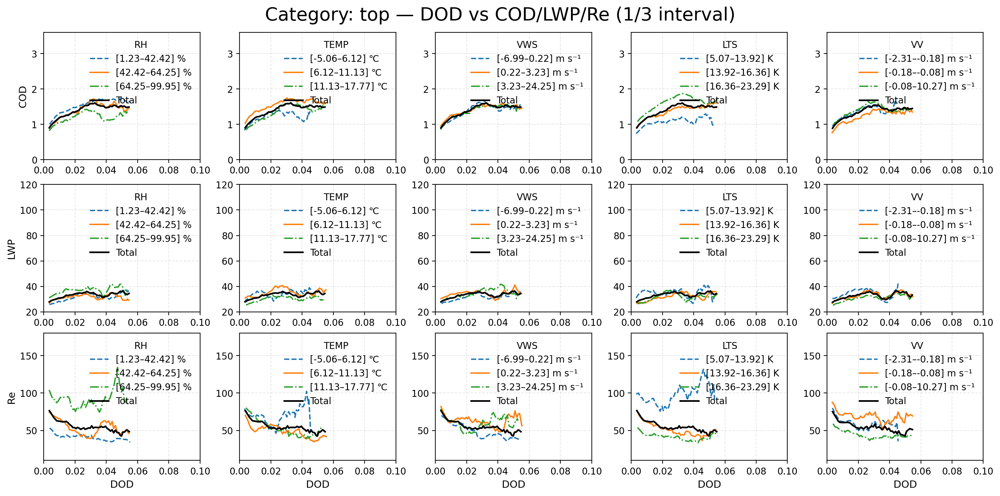

In [52]:
fig, axes = plot_category_panel(category_name='top', results=results)
plt.show()


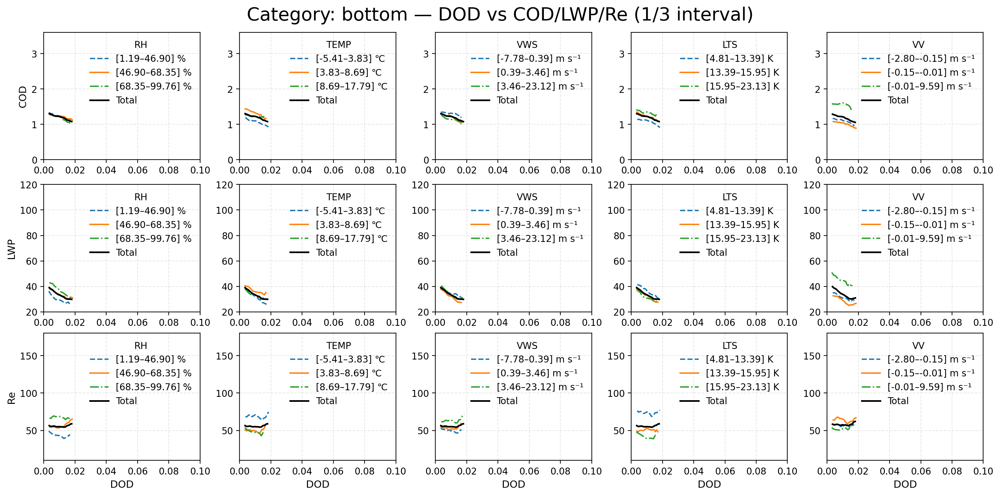

In [53]:
fig, axes = plot_category_panel(category_name='bottom', results=results)
plt.show()

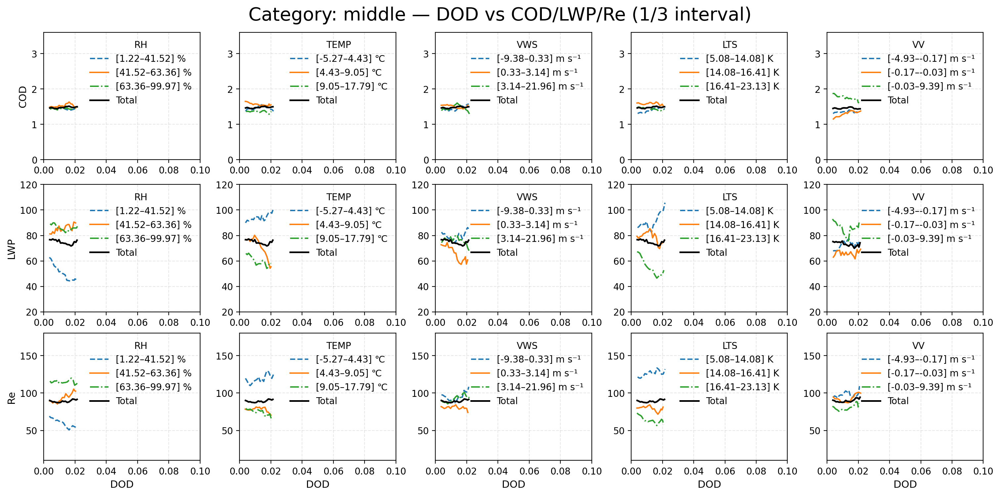

In [54]:
fig, axes = plot_category_panel(category_name='middle', results=results)
plt.show()

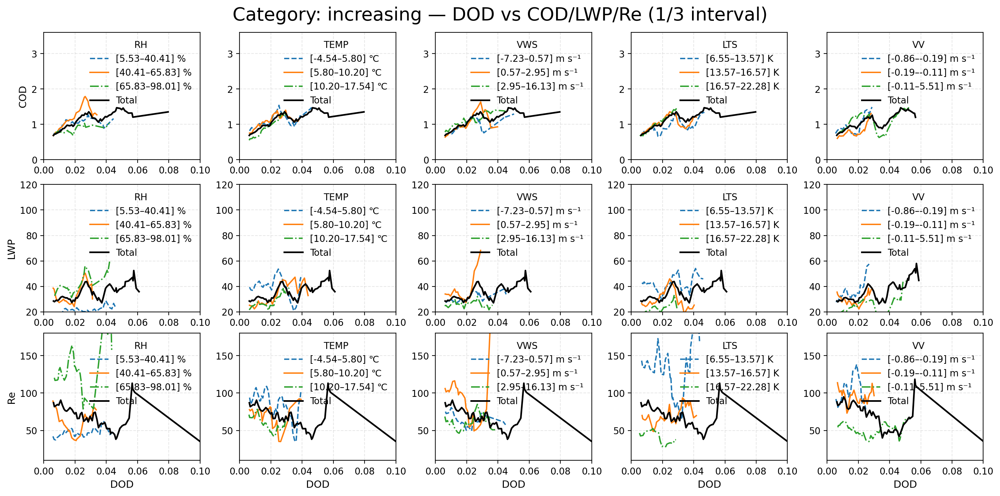

In [55]:
fig, axes = plot_category_panel(category_name='increasing', results=results)
plt.show()

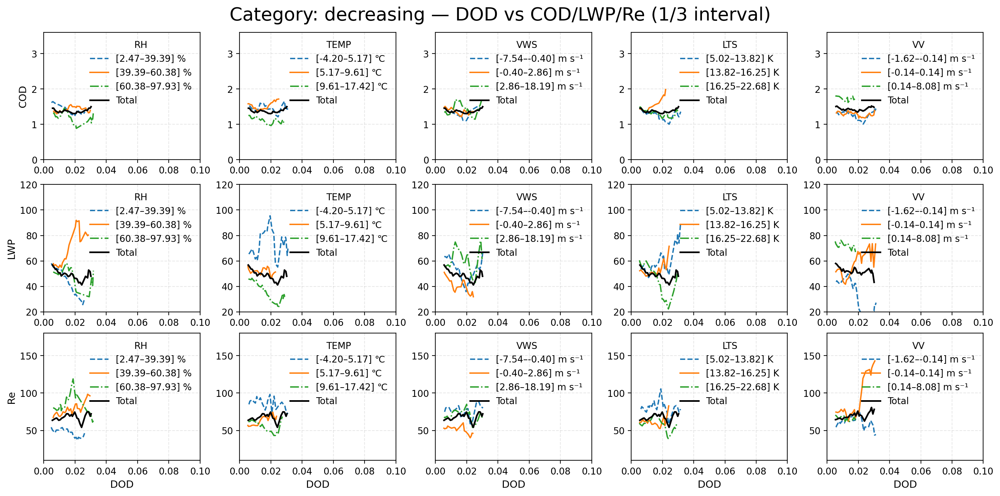

In [56]:
fig, axes = plot_category_panel(category_name='decreasing', results=results)
plt.show()

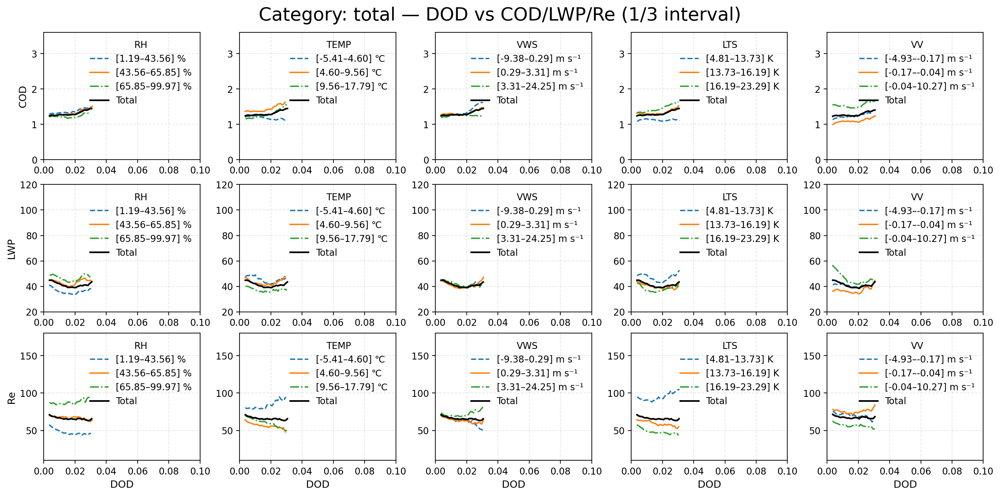

In [57]:
fig, axes = plot_category_panel(category_name='total', results=results)
plt.show()

In [58]:
import numpy as np
import matplotlib.pyplot as plt

# ========= 通用：等频分箱平滑 =========
def _equal_frequency_xy(x, y, n_bins=100, q_clip=None, min_count_bin=8):
    """
    对 (x,y) 做等频分箱并返回平滑后的 x_mean, y_mean, y_sem, count
    - q_clip: 如 (0.05, 0.95) 会按 x 的分位数去极值；None 则不去极值
    - min_count_bin: 每个bin最少样本数，返回时会附带一个 mask 方便调用方过滤
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]

    if x.size == 0:
        out = {k: np.array([]) for k in ["x_mean","y_mean","y_sem","count","mask_valid"]}
        return out

    # x去极值（可选）
    if q_clip is not None:
        lo, hi = np.nanquantile(x, q_clip)
        m2 = (x >= lo) & (x <= hi)
        x, y = x[m2], y[m2]
        if x.size == 0:
            out = {k: np.array([]) for k in ["x_mean","y_mean","y_sem","count","mask_valid"]}
            return out

    order = np.argsort(x)
    x_sorted, y_sorted = x[order], y[order]
    n = x_sorted.size
    edges = np.linspace(0, n, n_bins + 1, dtype=int)

    x_mean = np.full(n_bins, np.nan)
    y_mean = np.full(n_bins, np.nan)
    y_sem  = np.full(n_bins, np.nan)
    count  = np.zeros(n_bins, dtype=int)

    for i in range(n_bins):
        s, e = edges[i], edges[i+1]
        if e - s < 1:
            continue
        xb, yb = x_sorted[s:e], y_sorted[s:e]
        x_mean[i] = np.nanmean(xb)
        y_mean[i] = np.nanmean(yb)
        count[i]  = xb.size
        if xb.size > 1:
            y_sem[i] = np.nanstd(yb, ddof=1) / np.sqrt(xb.size)

    mask_valid = count >= int(min_count_bin)
    return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count, "mask_valid": mask_valid}


# ========= 1) 数据处理函数：按“类别 + 控制量/目标量”生成平滑曲线 =========
def build_curves_for_category(
    category_name,
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=None,
    compute_re_if_missing=True,
    rho_l_g_cm3=1.0,  # 仅用于必要时计算 Re 的常数（不会影响对数斜率）
    n_bins=100, q_clip=(0.05, 0.95), min_count_bin=8
):
    """
    返回一个层次结构的 dict:
      curves[control_name][target_name] = {x_mean,y_mean,y_sem,count,mask_valid}
    其中 control ∈ [RH, TEMP, VWS, LTS, VV]，target ∈ [COD, LWP, Re]
    """
    # --- 收集本类别的原始数组 ---
    try:
        x_RH   = RH_by_cat[category_name]
        x_TEMP = TEMP_by_cat[category_name]
        x_VWS  = VWS_by_cat[category_name]
        x_LTS  = LTS_by_cat[category_name]
        x_VV   = VV_by_cat[category_name]
    except KeyError as e:
        raise KeyError(f"缺少控制量数据：{e}")

    try:
        y_COD = COD_by_cat[category_name]
        y_LWP = lwp_by_cat[category_name]
    except KeyError as e:
        raise KeyError(f"缺少目标量数据：{e}")

    # Re 处理：优先使用传入的 re_by_cat，否则按 LWP/COD 计算
    if (re_by_cat is not None) and (category_name in re_by_cat):
        y_Re = re_by_cat[category_name]
    elif compute_re_if_missing:
        # Re = (3/(2*rho_l)) * LWP / COD；常数对形状关系影响不大
        y_Re = (3.0 / (2.0 * rho_l_g_cm3)) * (np.asarray(y_LWP, float) / np.asarray(y_COD, float))
    else:
        y_Re = None  # 显式缺失

    controls = {
        "RH":   np.asarray(x_RH, float),
        "TEMP": np.asarray(x_TEMP, float),
        "VWS":  np.asarray(x_VWS, float),
        "LTS":  np.asarray(x_LTS, float),
        "VV":   np.asarray(x_VV, float),
    }
    targets = {
        "COD": np.asarray(y_COD, float),
        "LWP": np.asarray(y_LWP, float),
    }
    if y_Re is not None:
        targets["Re"] = np.asarray(y_Re, float)

    curves = {}
    for cname, x in controls.items():
        curves[cname] = {}
        for tname, y in targets.items():
            res = _equal_frequency_xy(x, y, n_bins=n_bins, q_clip=q_clip, min_count_bin=min_count_bin)
            curves[cname][tname] = res
    return curves

In [59]:
# ======== 工具：把多个类别拼接成 total ========
def _concat_from(d, cats):
    """把字典 d 中指定 cats 的数组顺序拼接；若某类缺失则跳过。"""
    arrs = []
    for c in cats:
        if c in d:
            arrs.append(np.asarray(d[c], float))
    return np.concatenate(arrs) if arrs else np.array([], float)

def add_total_to_all_by_cat(
    base_cats,
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=None
):
    """就地(add in-place) 为每个 *_by_cat 增加 'total' 键。"""
    RH_by_cat['total']   = _concat_from(RH_by_cat,   base_cats)
    TEMP_by_cat['total'] = _concat_from(TEMP_by_cat, base_cats)
    VWS_by_cat['total']  = _concat_from(VWS_by_cat,  base_cats)
    LTS_by_cat['total']  = _concat_from(LTS_by_cat,  base_cats)
    VV_by_cat['total']   = _concat_from(VV_by_cat,   base_cats)

    COD_by_cat['total']  = _concat_from(COD_by_cat,  base_cats)
    lwp_by_cat['total']  = _concat_from(lwp_by_cat,  base_cats)

    if re_by_cat is not None:
        # 若你已事先算好 Re，也一并合并
        re_by_cat['total'] = _concat_from(re_by_cat, base_cats)

    return {
        'RH_by_cat': RH_by_cat, 'TEMP_by_cat': TEMP_by_cat, 'VWS_by_cat': VWS_by_cat,
        'LTS_by_cat': LTS_by_cat, 'VV_by_cat': VV_by_cat,
        'COD_by_cat': COD_by_cat, 'lwp_by_cat': lwp_by_cat, 're_by_cat': re_by_cat
    }

# ======== 包装器：一次性生成所有类别（含 total）的曲线 ========
def build_curves_all_categories(
    cat_names,                         # 原始五类，比如 ['top','bottom','middle','decreasing','increasing']
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=None,
    compute_re_if_missing=True,
    rho_l_g_cm3=1.0,
    n_bins=100, q_clip=(0.05, 0.95), min_count_bin=8
):
    # 1) 先合并出 'total'
    _ = add_total_to_all_by_cat(
        base_cats=list(cat_names),
        RH_by_cat=RH_by_cat, TEMP_by_cat=TEMP_by_cat, VWS_by_cat=VWS_by_cat,
        LTS_by_cat=LTS_by_cat, VV_by_cat=VV_by_cat,
        COD_by_cat=COD_by_cat, lwp_by_cat=lwp_by_cat, re_by_cat=re_by_cat
    )
    cat_names_with_total = list(cat_names) + ['total']

    # 2) 逐类跑你已有的 build_curves_for_category
    curves_by_cat = {}
    for cname in cat_names_with_total:
        curves_by_cat[cname] = build_curves_for_category(
            category_name=cname,
            RH_by_cat=RH_by_cat, TEMP_by_cat=TEMP_by_cat, VWS_by_cat=VWS_by_cat,
            LTS_by_cat=LTS_by_cat, VV_by_cat=VV_by_cat,
            COD_by_cat=COD_by_cat, lwp_by_cat=lwp_by_cat, re_by_cat=re_by_cat,
            compute_re_if_missing=compute_re_if_missing,
            rho_l_g_cm3=rho_l_g_cm3,
            n_bins=n_bins, q_clip=q_clip, min_count_bin=min_count_bin
        )
    return curves_by_cat


In [60]:
def plot_category_panel(
    category_name,
    curves,
    controls_order=("RH","TEMP","VWS","LTS","VV"),
    targets_order=("COD","LWP","Re"),
    figsize=(15, 7),
    suptitle=None,
    fixed_ylim={"COD": (0, 4), "LWP": (15, 170), "Re": (0,500)},
    show_sem=False,
    scatter=None
):
    """
    绘制面板：仅保留每行第一个 ylabel、每列最后一行的 xlabel；
    并为每列单独设置 xlim。
    """
    targets_available = [t for t in targets_order if t in (curves.get(controls_order[0], {})).keys()]
    n_rows = len(targets_available)
    n_cols = len(controls_order)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize, dpi=220, constrained_layout=True)
    if n_rows == 1:
        axes = np.array([axes])

    unit_map = {"RH": "%", "TEMP": "℃", "VWS": "m s⁻¹", "LTS": "K", "VV": "m s⁻¹"}
    y_label_map = {"COD": "COD", "LWP": "LWP (g m⁻²)", "Re": "Re (μm)"}

    # === 每列自定义 x 轴范围 ===
    xlim_map = {
        "RH":   (0, 80),
        "TEMP": (-2, 15),
        "VWS":  (0, 10),
        "LTS":  (10, 20),
        "VV":   (-0.2, 0.8)
    }

    for ci, cname in enumerate(controls_order):
        if cname not in curves:
            for ri in range(n_rows):
                axes[ri, ci].set_visible(False)
            continue

        for ri, tname in enumerate(targets_available):
            ax = axes[ri, ci]
            res = curves[cname][tname]
            x, y = res["x_mean"], res["y_mean"]
            m = res["mask_valid"]

            ax.plot(x[m], y[m], lw=1.8, label=f"{tname} vs {cname}")

            if show_sem and np.any(m) and np.isfinite(res["y_sem"][m]).any():
                ylo, yhi = y[m] - res["y_sem"][m], y[m] + res["y_sem"][m]
                ax.fill_between(x[m], ylo, yhi, alpha=0.18, linewidth=0)

            ax.grid(ls="--", alpha=0.3)

            # === 仅最左列显示 ylabel ===
            if ci == 0:
                ax.set_ylabel(y_label_map.get(tname, tname))
            else:
                ax.set_ylabel("")

            # === 仅最后一行显示 xlabel ===
            if ri == n_rows - 1:
                ax.set_xlabel(f"{cname} ({unit_map.get(cname, '')})")
            else:
                ax.set_xlabel("")

            # === 固定 y 轴范围 ===
            if fixed_ylim.get(tname) is not None:
                ax.set_ylim(*fixed_ylim[tname])

            # === 设置该列 x 轴范围 ===
            if cname in xlim_map:
                ax.set_xlim(*xlim_map[cname])

    if suptitle is None:
        suptitle = f"Category: {category_name} — COD/LWP/Re vs Meteorological variables"
    fig.suptitle(suptitle, fontsize=15)

    return fig, axes


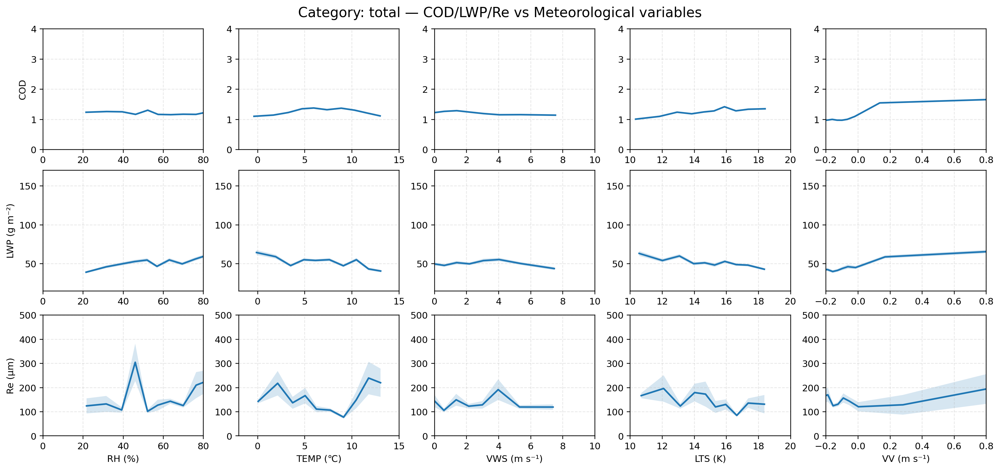

In [61]:
curves_top = build_curves_for_category(
    "total",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("total", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

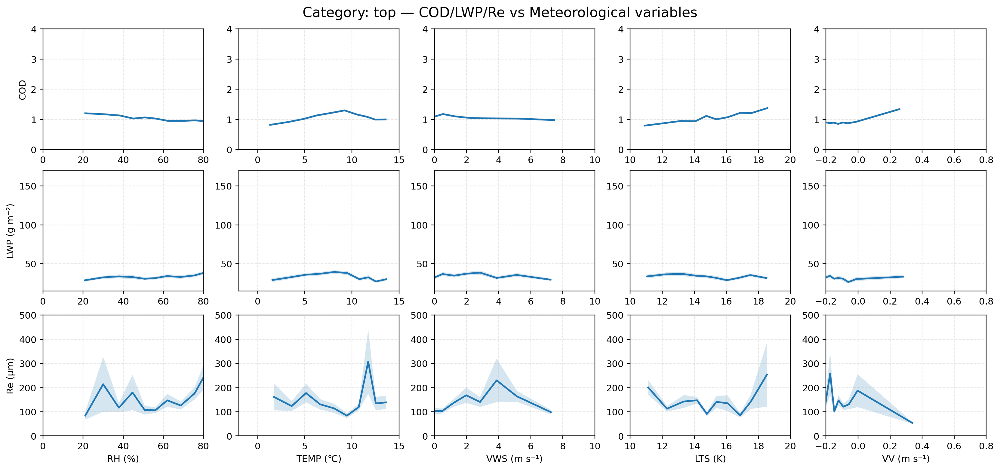

In [62]:
curves_top = build_curves_for_category(
    "top",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("top", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

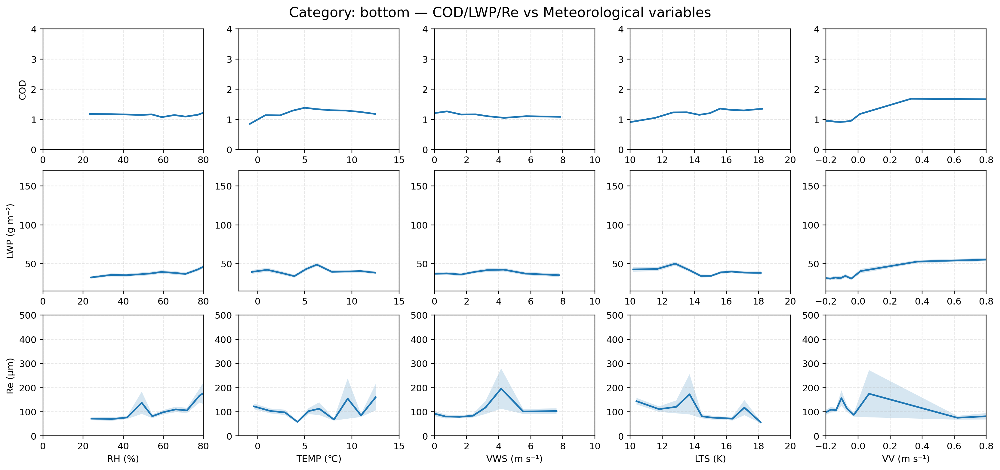

In [63]:
curves_top = build_curves_for_category(
    "bottom",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("bottom", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

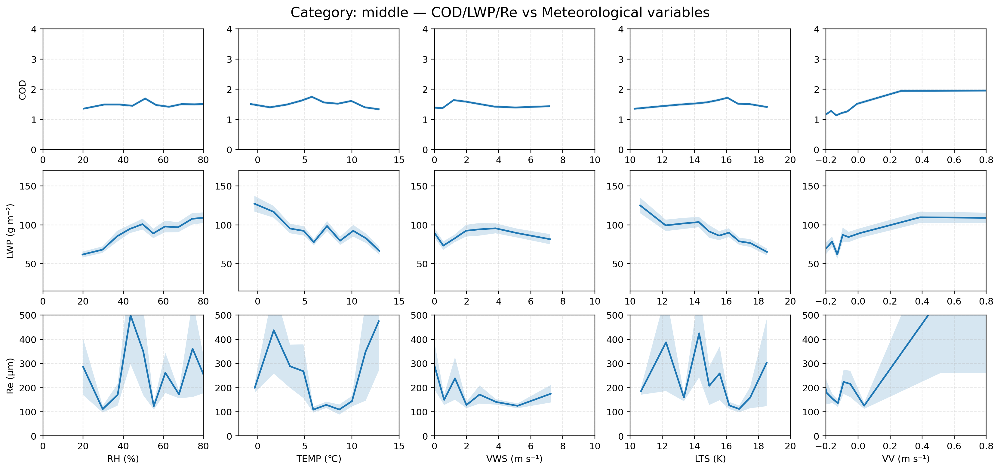

In [64]:
curves_top = build_curves_for_category(
    "middle",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("middle", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

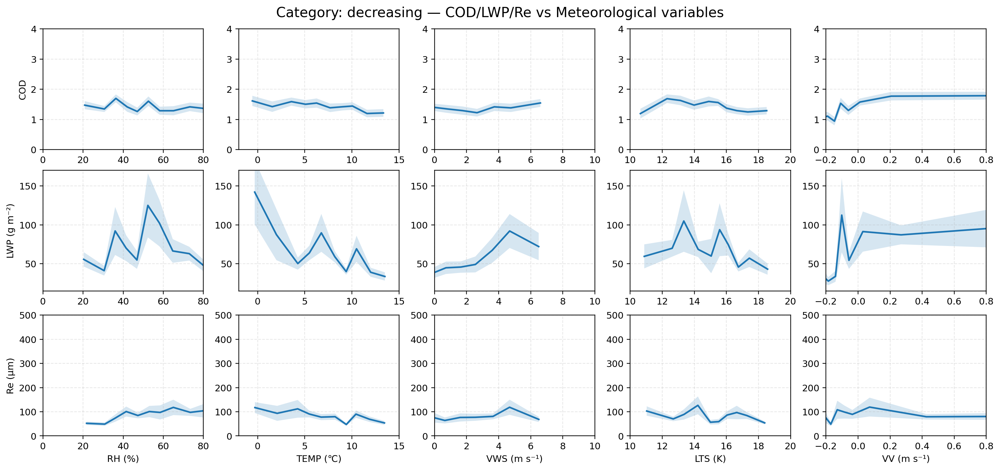

In [65]:
curves_top = build_curves_for_category(
    "decreasing",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("decreasing", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

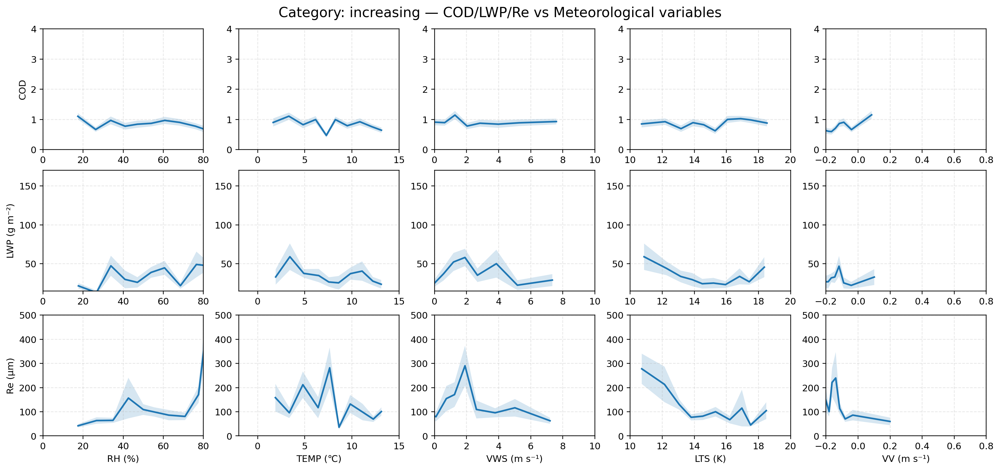

In [66]:
curves_top = build_curves_for_category(
    "increasing",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("increasing", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

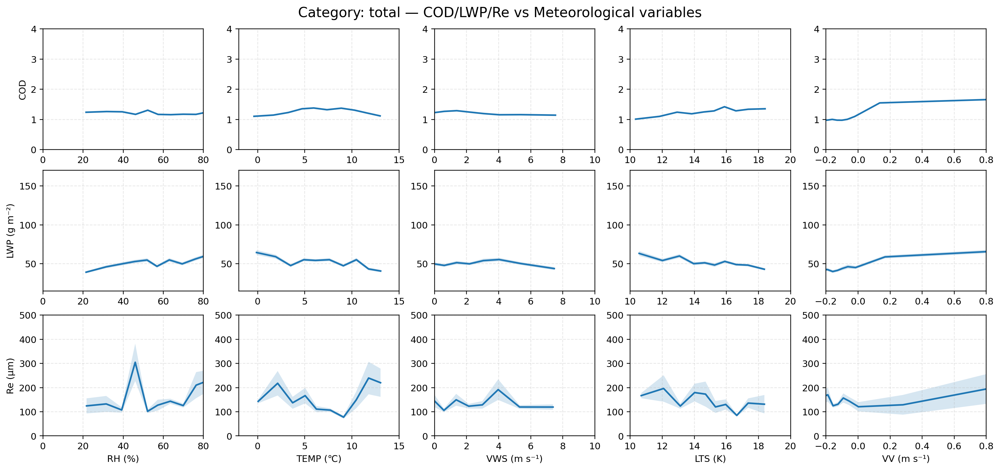

In [67]:
curves_top = build_curves_for_category(
    "total",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("total", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

## Sensitive analysis for different Meterological condition

In [68]:
import numpy as np
import pandas as pd

def _weighted_log_slope(x, y, w):
    """
    计算 ln(y) = a + b ln(x) 的加权最小二乘斜率 b 及其标准误差 stderr。
    - x, y: 1D 数组，要求 x>0, y>0
    - w:    非负权重（建议使用 count）
    返回: slope, stderr, n_eff
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    w = np.asarray(w, float)

    good = np.isfinite(x) & np.isfinite(y) & np.isfinite(w) & (x > 0) & (y > 0) & (w > 0)
    if good.sum() < 3:
        return np.nan, np.nan, int(good.sum())

    lx = np.log(x[good])
    ly = np.log(y[good])
    ww = w[good]

    # 设计矩阵: [1, lnX]
    X0 = np.ones_like(lx)
    X1 = lx
    # 加权正态方程
    W  = ww
    S0 = np.sum(W)
    S1 = np.sum(W * X1)
    S2 = np.sum(W * X1 * X1)
    Sy = np.sum(W * ly)
    Sxy= np.sum(W * X1 * ly)

    det = (S0 * S2 - S1 * S1)
    if det <= 0:
        return np.nan, np.nan, int(good.sum())

    # 参数解
    a = (S2 * Sy - S1 * Sxy) / det
    b = (S0 * Sxy - S1 * Sy) / det  # 斜率

    # 残差与方差估计
    ly_hat = a + b * X1
    rss = np.sum(W * (ly - ly_hat)**2)
    dof = max(1, good.sum() - 2)
    sigma2 = rss / dof

    # 协方差矩阵的 (1,1) 元素（斜率方差）
    var_b = sigma2 * (S0 / det)
    stderr = np.sqrt(var_b) if var_b >= 0 else np.nan
    return b, stderr, int(good.sum())


def compute_log_sensitivities(results, control_var, 
                              cat_order, 
                              targets=('COD','LWP','Re'),
                              terciles=('low','mid','high'),
                              min_points=8):
    """
    从 prepare_tercile_curves_per_category 的 results 结构中，
    计算给定 control_var (如 'RH') 下，各类别 cat、各 target 的
    对数敏感度斜率及其标准误差。

    返回：一个长表 DataFrame，列包含：
      ['category','target','tercile','slope','stderr','n']
    """
    rows = []
    for cat in cat_order:
        if cat not in results:
            continue
        if control_var not in results[cat]:
            continue
        for target in targets:
            if target not in results[cat][control_var]:
                continue
            for t in terciles:
                df = results[cat][control_var][target].get(t, None)
                if df is None or len(df) < 2:
                    rows.append([cat, target, t, np.nan, np.nan, 0])
                    continue
                # 需要 x, y, count
                x = df.get('x', None)
                y = df.get('y', None)
                c = df.get('count', None)
                if (x is None) or (y is None) or (c is None):
                    rows.append([cat, target, t, np.nan, np.nan, 0])
                    continue
                # 至少要有一定点数
                if np.isfinite(x).sum() < min_points or np.isfinite(y).sum() < min_points:
                    rows.append([cat, target, t, np.nan, np.nan, int(np.isfinite(x).sum())])
                    continue

                slope, stderr, n = _weighted_log_slope(x, y, c)
                rows.append([cat, target, t, slope, stderr, n])

    out = pd.DataFrame(rows, columns=['category','target','tercile','slope','stderr','n'])
    # 按用户指定顺序排序
    out['category'] = pd.Categorical(out['category'], categories=cat_order, ordered=True)
    out['target']   = pd.Categorical(out['target'],   categories=list(targets), ordered=True)
    out['tercile']  = pd.Categorical(out['tercile'],  categories=list(terciles), ordered=True)
    out = out.sort_values(['target','category','tercile']).reset_index(drop=True)
    return out


In [69]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1 - rgb) * a)

def plot_log_sensitivity_triplet(
    sens_df, control_var, cat_order=None,
    targets=('COD','LWP','Re'),
    terciles=('low','mid','high'),
    figsize=(12,3), sharey=False
):
    cols = ["#540863", "#EE6983", "#CF4B00"]
    bg_colors = {"top": "b", "middle": "#ff9505", "bottom": "#ba181b", "total": "k"}
    base = ["top","middle","bottom"]

    desired_order = ["top", "middle", "bottom", "total"]
    
    if cat_order is None:
        cat_order = [c for c in desired_order if c in sens_df["category"].unique()]
    else:
        cat_order = [c for c in desired_order if c in cat_order]


    x = np.arange(len(cat_order))
    width, offsets = 0.22, [-0.22, 0, 0.22]
    ylims = {'COD':(-0.5,0.5),'LWP':(-0.5,0.5),'Re':(-0.5,1.1)}

    fig, axes = plt.subplots(1, 3, figsize=figsize, dpi=300, sharey=sharey)

    for i,(ax,tgt) in enumerate(zip(axes, targets)):
        sub = sens_df[sens_df['target']==tgt]

        for k,c in enumerate(cat_order):
            if c in bg_colors:
                ax.axvspan(k-0.5, k+0.5, color=bg_colors[c], alpha=0.1, zorder=0)

        for ter,off,col in zip(terciles, offsets, cols):
            yy, ee = [], []
            for cat in cat_order:
                r = sub[(sub.category==cat)&(sub.tercile==ter)]
                if len(r)==1:
                    v = r.slope.values[0]; v = -v if tgt=='Re' else v
                    yy.append(v); ee.append(1.96*r.stderr.values[0])
                else:
                    yy.append(np.nan); ee.append(np.nan)

            ax.bar(x+off, yy, width=width*0.9,
                   facecolor=_lighten(col,0.5), edgecolor=col, hatch="xx",
                   label=ter if i==0 else None, zorder=2)
            ax.errorbar(x+off, yy, yerr=ee, fmt='none', ecolor='k', lw=1, capsize=3, zorder=3)

        ax.axhline(0,color='k',lw=0.8)
        ax.set(xlim=(-0.6,len(x)-0.4), ylim=ylims[tgt], xticks=x, xticklabels=cat_order)
        ax.set_ylabel(r'$-\partial\ln(\mathrm{Re})/\partial\ln(\mathrm{DOD})$' if tgt=='Re'
                      else rf'$\partial\ln({tgt})/\partial\ln(\mathrm{{DOD}})$')
        ax.grid(axis='y', ls='--', alpha=0.3)
        if i==0: ax.legend(title=f'{control_var} terciles', frameon=False)

    fig.tight_layout()
    return fig, axes


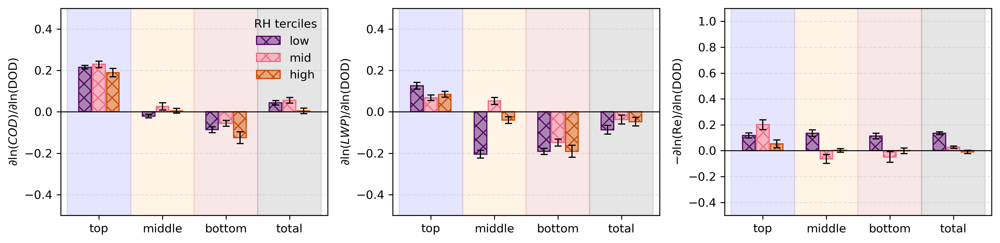

In [70]:
# 先计算好某个控制变量的敏感度（见上一个代码块）
sens_RH = compute_log_sensitivities(results, control_var='RH', cat_order=cat_names_with_total)

# 画图：一行三张图（COD/LWP/Re）
fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_RH,
    control_var='RH',
    cat_order=cat_names_with_total
)
plt.savefig("figsave/ENA_RH_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()


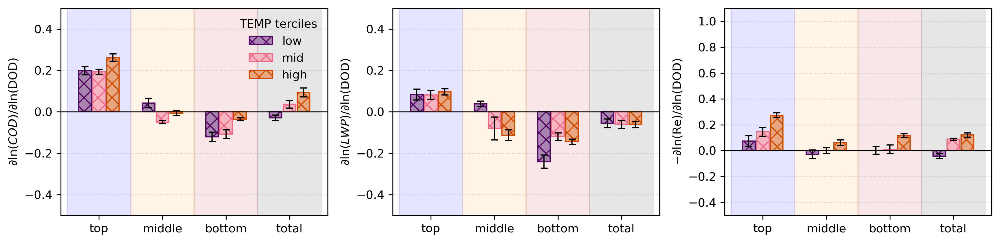

In [71]:
# 先计算好某个控制变量的敏感度（见上一个代码块）
sens_TMP = compute_log_sensitivities(results, control_var='TEMP', cat_order=cat_names_with_total)

# 画图：一行三张图（COD/LWP/Re）
fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_TMP,
    control_var='TEMP',
    cat_order=cat_names_with_total
)
plt.savefig("figsave/ENA_TEMP_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()

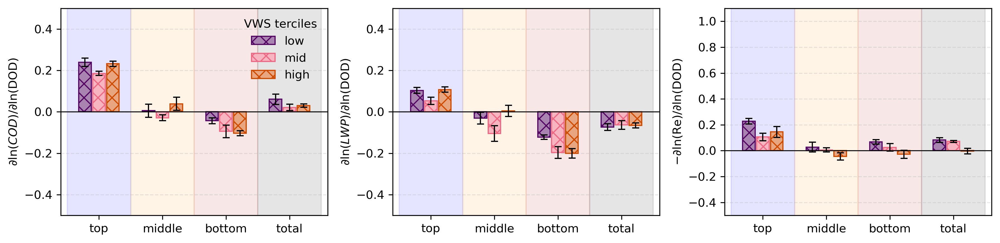

In [72]:
# 先计算好某个控制变量的敏感度（见上一个代码块）
sens_VWS = compute_log_sensitivities(results, control_var='VWS', cat_order=cat_names_with_total)

# 画图：一行三张图（COD/LWP/Re）
fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_VWS,
    control_var='VWS',
    cat_order=cat_names_with_total
)
plt.savefig("figsave/ENA_VWS_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()

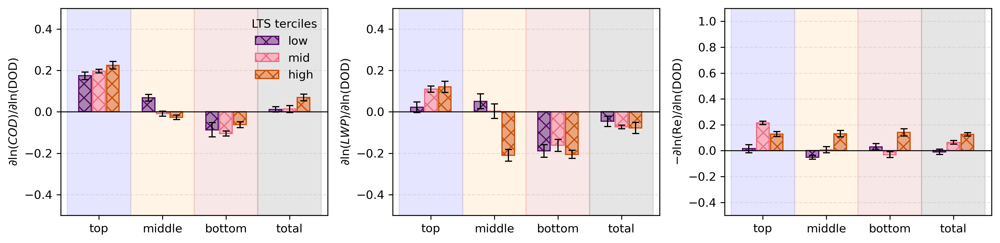

In [73]:
# 先计算好某个控制变量的敏感度（见上一个代码块）
sens_LTS = compute_log_sensitivities(results, control_var='LTS', cat_order=cat_names_with_total)

# 画图：一行三张图（COD/LWP/Re）
fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_LTS,
    control_var='LTS',
    cat_order=cat_names_with_total
)
plt.savefig("figsave/ENA_LTS_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()

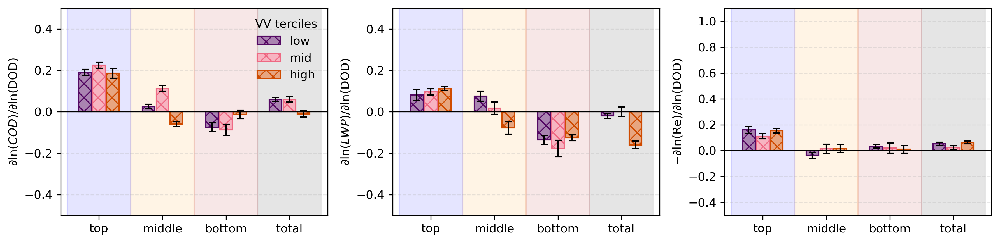

In [74]:
# 先计算好某个控制变量的敏感度（见上一个代码块）
sens_VV = compute_log_sensitivities(results, control_var='VV', cat_order=cat_names_with_total)

# 画图：一行三张图（COD/LWP/Re）
fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_VV,
    control_var='VV',
    cat_order=cat_names_with_total
)
plt.savefig("figsave/ENA_VV_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()

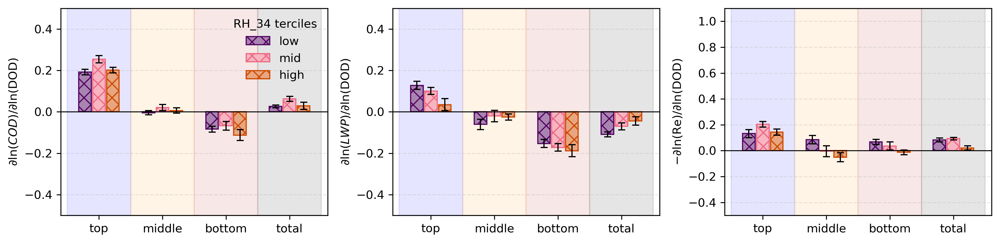

In [75]:
# ====== RH_34 ======
sens_RH_34 = compute_log_sensitivities(
    results2,
    control_var='RH_34',
    cat_order=cat_names_with_total
)

fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_RH_34,
    control_var='RH_34',
    cat_order=cat_names_with_total
)

plt.savefig("figsave/ENA_RH_34_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()


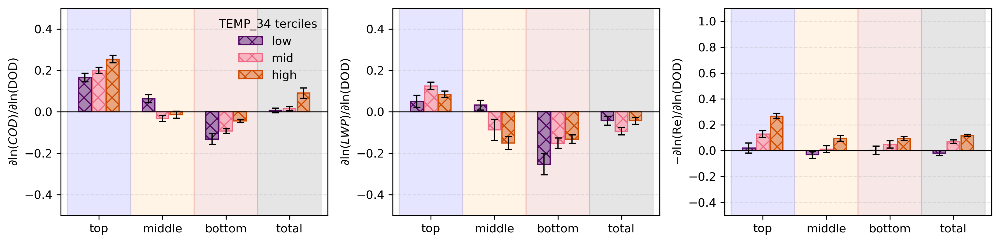

In [76]:
# ====== TEMP_34 ======
sens_TEMP_34 = compute_log_sensitivities(
    results2,
    control_var='TEMP_34',
    cat_order=cat_names_with_total
)

fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_TEMP_34,
    control_var='TEMP_34',
    cat_order=cat_names_with_total
)

plt.savefig("figsave/ENA_TEMP_34_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()


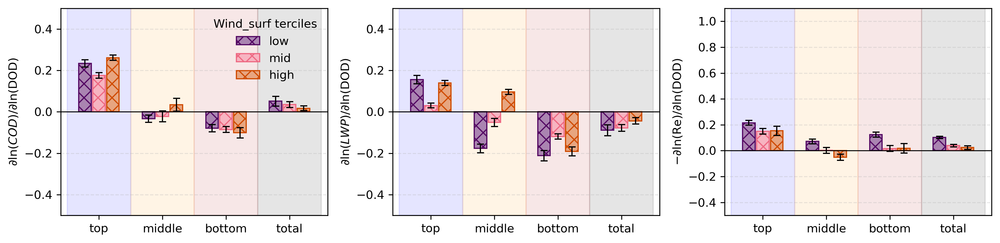

In [77]:
# ====== Wind_surf ======
sens_Wind_surf = compute_log_sensitivities(
    results2,
    control_var='Wind_surf',
    cat_order=cat_names_with_total
)

fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_Wind_surf,
    control_var='Wind_surf',
    cat_order=cat_names_with_total
)

plt.savefig("figsave/ENA_Wind_surf_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()


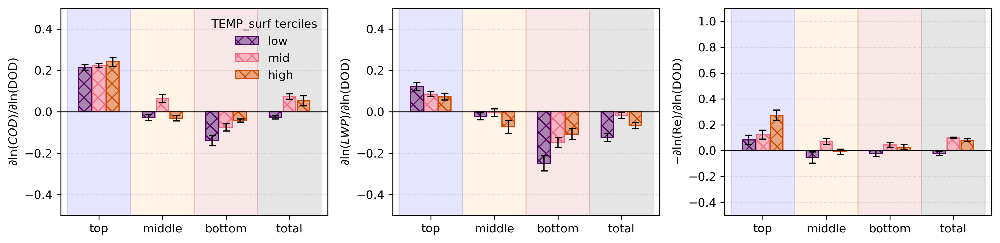

In [78]:
# ====== TEMP_surf ======
sens_TEMP_surf = compute_log_sensitivities(
    results2,
    control_var='TEMP_surf',
    cat_order=cat_names_with_total
)

fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_TEMP_surf,
    control_var='TEMP_surf',
    cat_order=cat_names_with_total
)

plt.savefig("figsave/ENA_TEMP_surf_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()


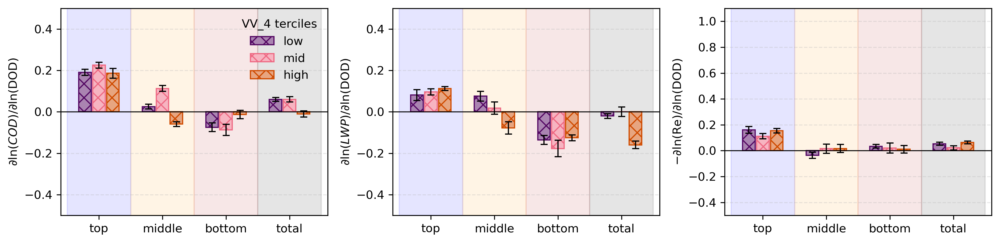

In [79]:
# ====== VV_4 ======
sens_VV_4 = compute_log_sensitivities(
    results2,
    control_var='VV_4',
    cat_order=cat_names_with_total
)

fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_VV_4,
    control_var='VV_4',
    cat_order=cat_names_with_total
)

plt.savefig("figsave/ENA_VV_4_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()


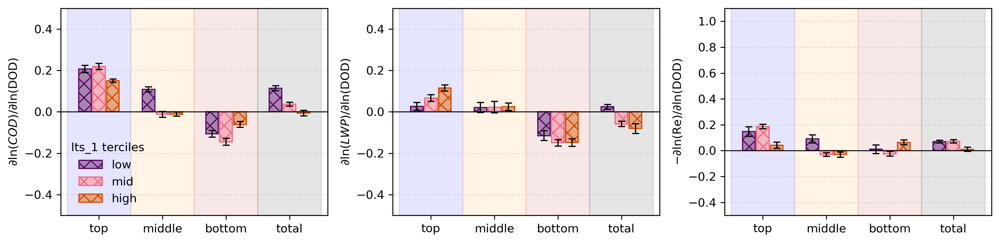

In [80]:
# ====== lts_1 ======
sens_lts_1 = compute_log_sensitivities(
    results2,
    control_var='lts_1',
    cat_order=cat_names_with_total
)

fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_lts_1,
    control_var='lts_1',
    cat_order=cat_names_with_total
)

plt.savefig("figsave/ENA_lts_1_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()


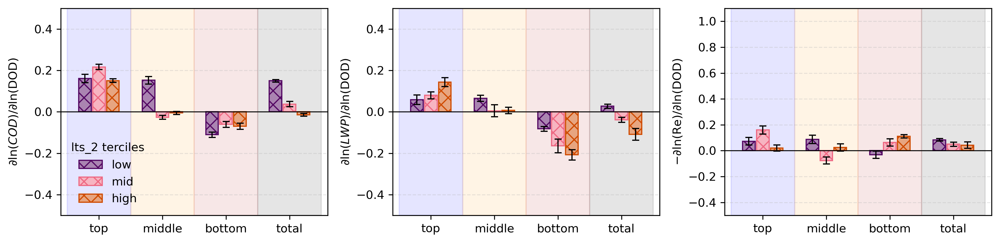

In [81]:
# ====== lts_2 ======
sens_lts_2 = compute_log_sensitivities(
    results2,
    control_var='lts_2',
    cat_order=cat_names_with_total
)

fig, axes = plot_log_sensitivity_triplet(
    sens_df=sens_lts_2,
    control_var='lts_2',
    cat_order=cat_names_with_total
)

plt.savefig("figsave/ENA_lts_2_ACI.pdf", dpi=300, bbox_inches='tight')
plt.show()

## PDF and 3 quantile of mete variables

In [85]:
import numpy as np

def split_by_quantile(var, q=(0, 1/3, 2/3, 1), mask=None):
    var = np.asarray(var)
    mask = np.isfinite(var) if mask is None else (np.isfinite(var) & mask)
    qs = np.quantile(var[mask], q)
    labels = np.full(var.shape, np.nan)
    for i in range(len(qs)-1):
        sel = (var >= qs[i]) & (var < qs[i+1]) if i < len(qs)-2 else (var >= qs[i]) & (var <= qs[i+1])
        labels[sel & mask] = i
    return labels, qs.tolist()

vars_by_cat = [
    ("RH", RH_by_cat),
    ("TEMP", TEMP_by_cat),
    ("VWS", VWS_by_cat),
    ("LTS", LTS_by_cat),
    ("VV", VV_by_cat),
    ("RH_34", RH_34_by_cat),
    ("TEMP_34", TEMP_34_by_cat),
    ("Wind_surf", Wind_surf_by_cat),
    ("TEMP_surf", TEMP_surf_by_cat),
    ("VV_4", VV_4_by_cat),
    ("lts_1", lts_1_by_cat),
    ("lts_2", lts_2_by_cat),
]

cats = ["top", "middle", "bottom"]
cat_colors = {"top": "b", "middle": "#ff9505", "bottom": "#ba181b"}


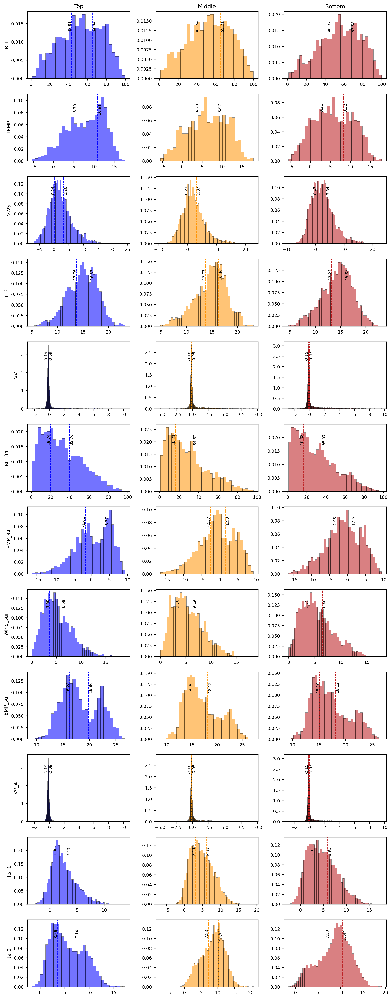

In [87]:
import matplotlib.pyplot as plt

nrows, ncols = len(vars_by_cat), 3
fig, axes = plt.subplots(nrows, ncols, figsize=(10, 2.1*nrows), dpi=300)

for i, (vname, dcat) in enumerate(vars_by_cat):
    for j, c in enumerate(cats):
        ax = axes[i, j]

        x = np.asarray(dcat[c]); x = x[np.isfinite(x)]
        if x.size == 0:
            ax.axis("off"); continue

        # PDF: histogram with automatic bin selection
        h, b, _ = ax.hist(
            x, bins="auto", density=True,
            color=cat_colors[c], alpha=0.55,
            edgecolor="k", linewidth=0.4
        )

        # quantiles (same method as before)
        q1, q2 = split_by_quantile(x)[1][1:3]
        ax.axvline(q1, color=cat_colors[c], ls="--", lw=0.9)
        ax.axvline(q2, color=cat_colors[c], ls="--", lw=0.9)

        ymax = h.max() if len(h) else ax.get_ylim()[1]
        ax.text(q1, ymax*0.9, f"{q1:.2f}", rotation=90, ha="right", va="top", fontsize=7)
        ax.text(q2, ymax*0.9, f"{q2:.2f}", rotation=90, ha="left",  va="top", fontsize=7)

        if i == 0:
            ax.set_title(c.capitalize(), fontsize=10)
        if j == 0:
            ax.set_ylabel(vname, fontsize=9)

        ax.tick_params(labelsize=8)

plt.tight_layout()
plt.show()


## 2d bin of mete, dust and cloud variabels

In [103]:
import numpy as np

# ======== 12 个气象变量（x 轴）========
met_vars = {
    "RH": RH_by_cat,
    "TEMP": TEMP_by_cat,
    "VWS": VWS_by_cat,
    "LTS": LTS_by_cat,
    "VV": VV_by_cat,
    "RH_34": RH_34_by_cat,
    "TEMP_34": TEMP_34_by_cat,
    "Wind_surf": Wind_surf_by_cat,
    "TEMP_surf": TEMP_surf_by_cat,
    "VV_4": VV_4_by_cat,
    "lts_1": lts_1_by_cat,
    "lts_2": lts_2_by_cat,
}

# ======== 云变量（颜色）========
cloud_vars = {"COD": COD_by_cat, "LWP": lwp_by_cat, "Re": re_by_cat}

# ======== 固定范围 ========
y_lim = (0.0, 0.02)  # DOD
z_lims = {"COD": (0.0, 5.0), "LWP": (0.0, 200.0), "Re": (0.0, 400.0)}

# ======== x 的自动 edges：稳健取 1–99% 防极值拉伸 ========
def _xedges_auto(x, nb=36):
    x = np.asarray(x).ravel()
    x = x[np.isfinite(x)]
    if x.size == 0:
        return None
    lo, hi = np.nanpercentile(x, [1, 99])
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        lo, hi = np.nanmin(x), np.nanmax(x)
    if hi <= lo:
        hi = lo + 1.0
    return np.linspace(lo, hi, nb + 1)

# ======== y(DOD) 固定 edges ========
def _yedges_fixed(nb=36):
    return np.linspace(y_lim[0], y_lim[1], nb + 1)

# ======== 2D 分箱：每个 (x_bin, y_bin) 里对 z 求均值 ========
def _binned_mean_2d(x, y, z, xedges, yedges):
    x = np.asarray(x).ravel()
    y = np.asarray(y).ravel()
    z = np.asarray(z).ravel()

    m = np.isfinite(x) & np.isfinite(y) & np.isfinite(z)
    x = x[m]; y = y[m]; z = z[m]

    xi = np.digitize(x, xedges) - 1
    yi = np.digitize(y, yedges) - 1
    nx, ny = len(xedges) - 1, len(yedges) - 1

    ok = (xi >= 0) & (xi < nx) & (yi >= 0) & (yi < ny)
    xi = xi[ok]; yi = yi[ok]; z = z[ok]

    s = np.zeros((ny, nx), float)
    c = np.zeros((ny, nx), int)
    np.add.at(s, (yi, xi), z)
    np.add.at(c, (yi, xi), 1)

    out = s / np.where(c == 0, np.nan, c)
    out[c == 0] = np.nan
    return out


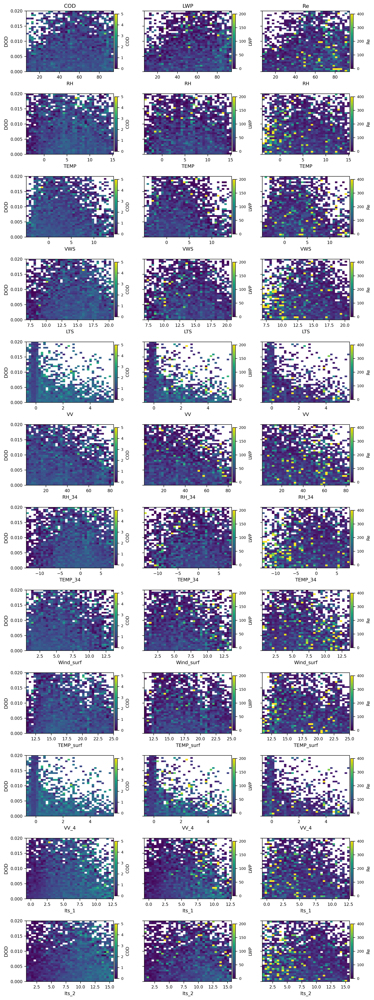

In [112]:
import matplotlib.pyplot as plt

cat = "bottom"   # 改成 "middle" / "bottom" 直接复用
cols = ["COD", "LWP", "Re"]

y = np.asarray(DOD_by_cat[cat]).ravel()
yedges = _yedges_fixed(nb=36)

nrows, ncols = len(met_vars), 3
fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(10, 2.2 * nrows),
    dpi=300,
    sharex=False,     # 关键：不共用 x 轴
    sharey=True
)

for i, (met_name, met_dict) in enumerate(met_vars.items()):
    x = np.asarray(met_dict[cat]).ravel()
    xedges = _xedges_auto(x, nb=36)

    if xedges is None or np.isfinite(x).sum() == 0:
        for j in range(ncols):
            axes[i, j].axis("off")
        continue

    for j, col_name in enumerate(cols):
        ax = axes[i, j]
        z = np.asarray(cloud_vars[col_name][cat]).ravel()
        zmin, zmax = z_lims[col_name]

        M = _binned_mean_2d(x, y, z, xedges, yedges)
        pm = ax.pcolormesh(
            xedges, yedges, M,
            shading="auto",
            vmin=zmin, vmax=zmax
        )

        ax.set_ylim(*y_lim)
        ax.set_xlabel(met_name, fontsize=9)   # 每个子图都有 x 轴标签
        if j == 0:
            ax.set_ylabel("DOD", fontsize=9)

        if i == 0:
            ax.set_title(col_name, fontsize=10)

        ax.tick_params(labelsize=8)

        cb = plt.colorbar(pm, ax=ax, pad=0.01, shrink=0.90)
        cb.set_label(col_name, fontsize=8)
        cb.ax.tick_params(labelsize=7)

plt.tight_layout()
plt.show()



## PDF of LWP, COD, Re, CGT, DOD, Cf

In [163]:
import numpy as np
from collections import defaultdict

CATS = ['top','bottom','middle','decreasing','increasing']
RAIN_THRESH = 0.1  # mm/h

def _split_rain_norain(x, rr, thresh=RAIN_THRESH):
    """根据降水阈值将数组 x 拆成 rain / norain 两组。"""
    x = np.asarray(x, float)
    rr = np.asarray(rr, float)
    n = min(len(x), len(rr))
    x, rr = x[:n], rr[:n]
    mask = np.isfinite(x) & np.isfinite(rr)
    rain_mask = mask & (rr >= thresh)
    norain_mask = mask & (rr <  thresh)
    return x[rain_mask], x[norain_mask]

def prepare_data(lwp_by_cat, COD_by_cat, re_by_cat, RR_by_cat,
                 cloud_tn_by_cat, DOD_by_cat, cf_by_cat):
    """
    将 LWP / COD / Re / CloudTn / DOD / CF 六个变量都按是否降水分组，并生成 total。
    """
    vars_and_srcs = {
        'LWP':     lwp_by_cat,
        'COD':     COD_by_cat,
        'Re':      re_by_cat,
        'CloudTn': cloud_tn_by_cat,  # 云几何厚度
        'DOD':     DOD_by_cat,       # Dust Optical Depth
        'CF':      cf_by_cat,        # Cloud Fraction
    }

    data = {v: {'rain': {}, 'norain': {}} for v in vars_and_srcs.keys()}

    for var, src in vars_and_srcs.items():
        for c in CATS:
            rain, norain = _split_rain_norain(src[c], RR_by_cat[c])
            data[var]['rain'][c]   = rain
            data[var]['norain'][c] = norain

        # 合并 total（只拼接非空数组）
        rain_list   = [data[var]['rain'][c]   for c in CATS if data[var]['rain'][c].size   > 0]
        norain_list = [data[var]['norain'][c] for c in CATS if data[var]['norain'][c].size > 0]
        data[var]['rain']['total']   = np.concatenate(rain_list)   if len(rain_list)   else np.array([], float)
        data[var]['norain']['total'] = np.concatenate(norain_list) if len(norain_list) else np.array([], float)

    return data

# === 生成 processed ===
processed = prepare_data(
    lwp_by_cat, COD_by_cat, re_by_cat, RR_by_cat,
    cloud_tn_by_cat, DOD_by_cat, cf_by_cat
)


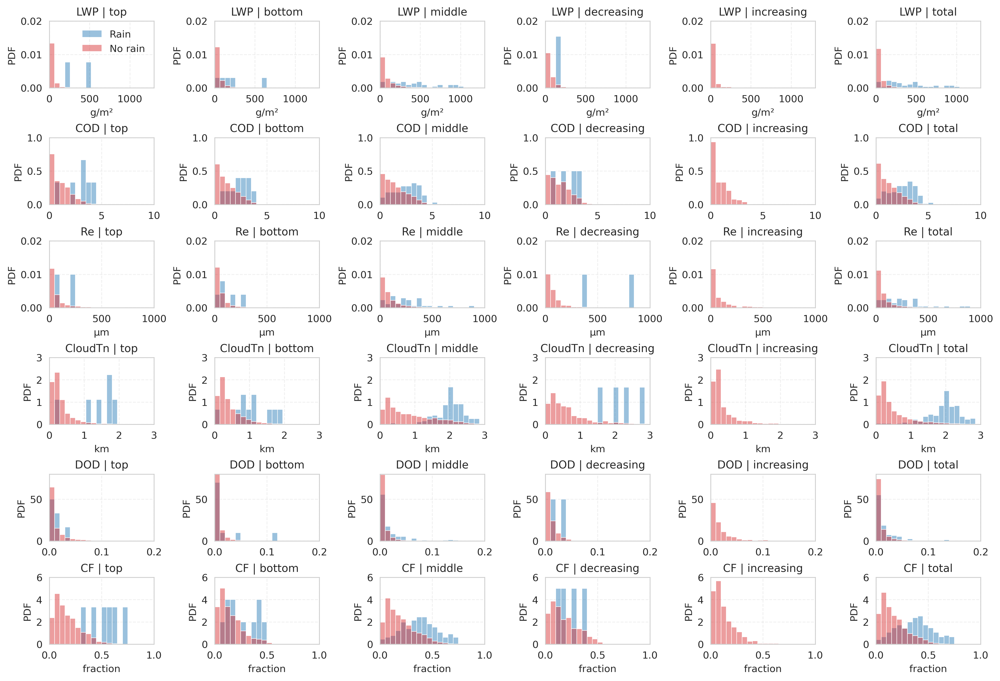

In [164]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")

# 六个变量 + total
CATS_PLUS_TOTAL = ['top','bottom','middle','decreasing','increasing','total']
VARS = ['LWP','COD','Re','CloudTn','DOD','CF']

# 每一行（变量）的固定范围 & bin 数（可按需要微调）
cfg = {
    'LWP'    : {'xlim': (0, 1300), 'ylim': (0, 0.02),  'bins': 20, 'xlabel': 'g/m²'},
    'COD'    : {'xlim': (0,   10), 'ylim': (0, 1.00),  'bins': 20, 'xlabel': ''},
    'Re'     : {'xlim': (0, 1000), 'ylim': (0, 0.02),  'bins': 20, 'xlabel': 'µm'},
    'CloudTn': {'xlim': (0,    3), 'ylim': (0, 3),     'bins': 20, 'xlabel': 'km'},
    'DOD'    : {'xlim': (0,  0.2), 'ylim': (0, 80.0),  'bins': 20, 'xlabel': ''},
    'CF'     : {'xlim': (0,  1.0), 'ylim': (0, 6.0),   'bins': 20, 'xlabel': 'fraction'},
}

# 生成统一 bin 边界
bin_edges = {
    var: np.linspace(cfg[var]['xlim'][0], cfg[var]['xlim'][1], cfg[var]['bins'] + 1)
    for var in VARS
}

# 绘图画布：6 行 × 6 列（变量 × 类别+total）
fig, axes = plt.subplots(len(VARS), len(CATS_PLUS_TOTAL),
                         figsize=(14, 9.5), dpi=300, constrained_layout=True)

for i, var in enumerate(VARS):
    xlow, xhigh = cfg[var]['xlim']
    ylow, yhigh = cfg[var]['ylim']
    bins = bin_edges[var]

    for j, cat in enumerate(CATS_PLUS_TOTAL):
        ax = axes[i, j]
        rain   = processed[var]['rain'][cat]
        norain = processed[var]['norain'][cat]

        # 过滤 NaN 和范围外数据
        if rain.size:
            rain = rain[np.isfinite(rain) & (rain >= xlow) & (rain <= xhigh)]
        if norain.size:
            norain = norain[np.isfinite(norain) & (norain >= xlow) & (norain <= xhigh)]

        # 绘制直方图
        if rain.size > 0:
            sns.histplot(
                rain, ax=ax, bins=bins, stat='density',
                color="#1f77b4", alpha=0.45, edgecolor=None,
                label="Rain" if (i == 0 and j == 0) else ""
            )
        if norain.size > 0:
            sns.histplot(
                norain, ax=ax, bins=bins, stat='density',
                color="#d62728", alpha=0.45, edgecolor=None,
                label="No rain" if (i == 0 and j == 0) else ""
            )

        ax.set_xlim(xlow, xhigh)
        ax.set_ylim(ylow, yhigh)
        ax.set_title(f"{var} | {cat}", fontsize=11)
        ax.set_ylabel("PDF", fontsize=10)
        ax.set_xlabel(cfg[var]['xlabel'], fontsize=10)
        ax.grid(alpha=0.3, ls="--")

# 左上角只放一次图例
axes[0, 0].legend(frameon=False, fontsize=10)
plt.show()


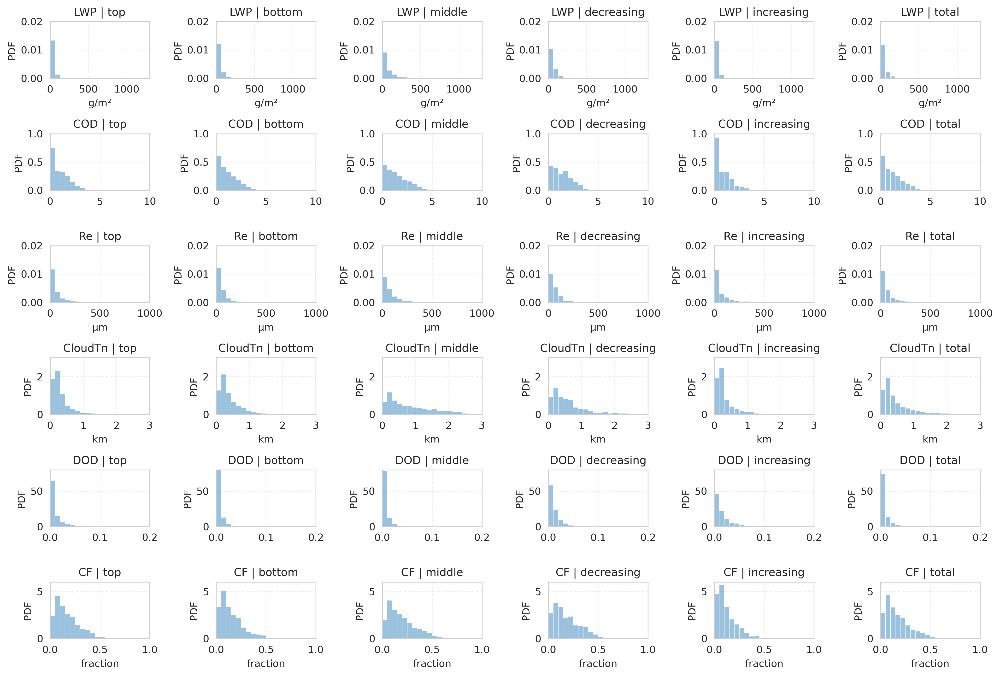

In [165]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

sns.set_style("whitegrid")

CATS_PLUS_TOTAL = ['top','bottom','middle','decreasing','increasing','total']

# 新增 CF
VARS = ['LWP','COD','Re','CloudTn','DOD','CF']

# 各变量范围、bin 数和单位
cfg = {
    'LWP'    : {'xlim': (0, 1300), 'ylim': (0, 0.02),  'bins': 20, 'xlabel': 'g/m²'},
    'COD'    : {'xlim': (0,   10), 'ylim': (0, 1.0),   'bins': 20, 'xlabel': ''},
    'Re'     : {'xlim': (0, 1000), 'ylim': (0, 0.02),  'bins': 20, 'xlabel': 'µm'},
    'CloudTn': {'xlim': (0, 3),    'ylim': (0, 3),     'bins': 20, 'xlabel': 'km'},
    'DOD'    : {'xlim': (0, 0.2),  'ylim': (0, 80),    'bins': 20, 'xlabel': ''},
    'CF'     : {'xlim': (0, 1.0),  'ylim': (0, 6.0),   'bins': 20, 'xlabel': 'fraction'},
}

# 统一 bin 边界
bin_edges = {
    var: np.linspace(cfg[var]['xlim'][0], cfg[var]['xlim'][1], cfg[var]['bins'] + 1)
    for var in VARS
}

# 6 行（变量）× 6 列（类别+total）
fig, axes = plt.subplots(len(VARS), len(CATS_PLUS_TOTAL),
                         figsize=(14, 9.5), dpi=300, constrained_layout=True)

for i, var in enumerate(VARS):
    xlow, xhigh = cfg[var]['xlim']
    ylow, yhigh = cfg[var]['ylim']
    bins = bin_edges[var]

    for j, cat in enumerate(CATS_PLUS_TOTAL):
        ax = axes[i, j]

        # 合并 rain + norain，过滤 NaN 与越界
        arrs = []
        if var in processed and cat in processed[var]['rain']:
            if processed[var]['rain'][cat].size:
                arrs.append(processed[var]['rain'][cat])
        if var in processed and cat in processed[var]['norain']:
            if processed[var]['norain'][cat].size:
                arrs.append(processed[var]['norain'][cat])

        if arrs:
            data_all = np.concatenate(arrs).astype(float, copy=False)
            data_all = data_all[np.isfinite(data_all) & (data_all >= xlow) & (data_all <= xhigh)]
        else:
            data_all = np.array([], dtype=float)

        # 绘制 PDF 直方图
        if data_all.size > 0:
            sns.histplot(
                data_all, ax=ax, bins=bins, stat='density',
                color="#1f77b4", alpha=0.45, edgecolor=None
            )

        ax.set_xlim(xlow, xhigh)
        ax.set_ylim(ylow, yhigh)
        ax.set_title(f"{var} | {cat}", fontsize=11)
        ax.set_ylabel("PDF", fontsize=10)
        ax.set_xlabel(cfg[var]['xlabel'], fontsize=10)
        ax.grid(alpha=0.3, ls="--")

plt.tight_layout()
plt.show()


## Meteorological Variables as a function of DOD (add VV 600hPa);

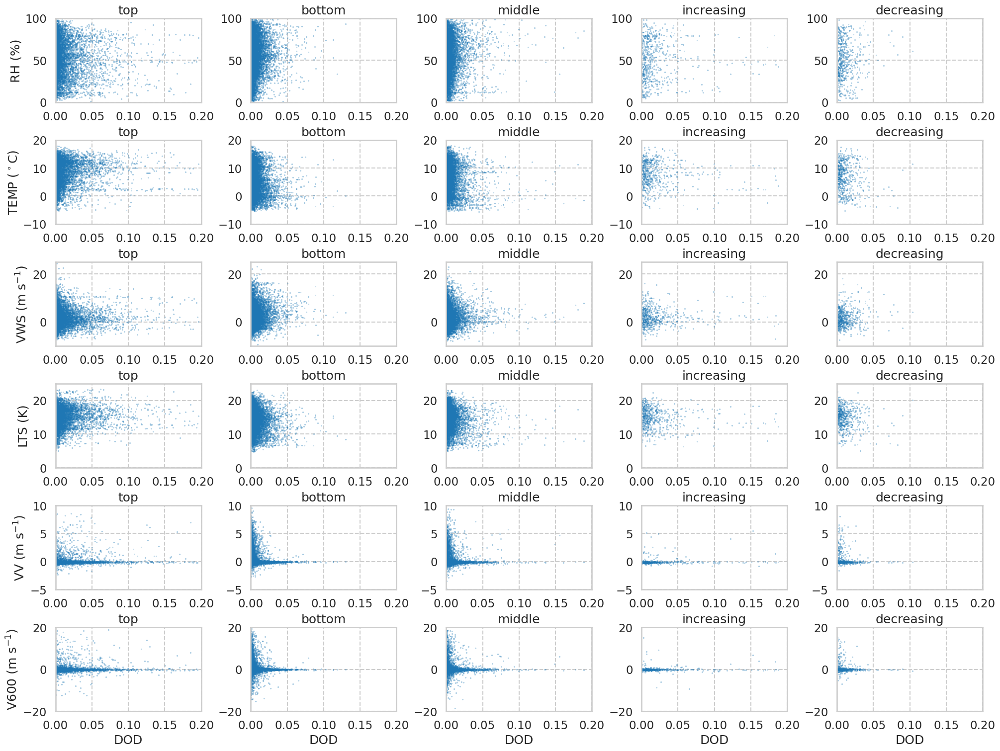

In [166]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set(style="whitegrid", context="talk")

# === 定义变量和类别 ===
CATS = ['top', 'bottom', 'middle', 'increasing', 'decreasing']  # 不含 total
VARS = ['RH', 'TEMP', 'VWS', 'LTS', 'VV', 'V600']
BY_CAT = [RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat, V600_by_cat]

# === 各行对应的y轴范围与单位 ===
YLIMS = [
    (0, 100),      # RH
    (-10, 20),     # TEMP
    (-10, 25),     # VWS
    (0, 25),       # LTS
    (-5, 10),      # VV
    (-20, 20)      # V600
]

YUNITS = [
    "(%)",          # RH
    "($^\circ$C)",  # TEMP
    "(m s$^{-1}$)", # VWS
    "(K)",          # LTS
    "(m s$^{-1}$)", # VV
    "(m s$^{-1}$)"  # V600
]

# === 创建画布 ===
fig, axes = plt.subplots(6, 5, figsize=(20, 15), constrained_layout=True)

# === 循环绘制 ===
for i, (var, var_dict) in enumerate(zip(VARS, BY_CAT)):
    for j, cat in enumerate(CATS):
        ax = axes[i, j]
        ax.set_xlim(0, 0.2)
        ax.set_ylim(YLIMS[i])
        ax.grid(ls = '--',)
        if cat in var_dict and cat in DOD_by_cat:
            x = DOD_by_cat[cat]
            y = var_dict[cat]

            if len(x) == len(y):
                ax.scatter(x, y, alpha=0.5, s=0.3, color="tab:blue")

        # 坐标轴标签
        if i == 5:
            ax.set_xlabel("DOD")
        else:
            ax.set_xlabel("")

        if j == 0:
            ax.set_ylabel(f"{var} {YUNITS[i]}")
        else:
            ax.set_ylabel("")

        ax.set_title(f"{cat}")

plt.show()


## UV_wind Rose Diagram

In [167]:
ds_uv = xr.open_dataset('/data/ggong/ARM_monthly/ENA/UV_wind_2min.nc')
uwind = ds_uv.u_wind.values
vwind = ds_uv.v_wind.values

mask = ~np.isnan(uwind) & ~np.isnan(vwind)
uwind_valid = uwind[mask]
vwind_valid = vwind[mask]

In [168]:
uwind_surf_by_cat = {}
vwind_surf_by_cat = {}
uwind_850_by_cat = {}
vwind_850_by_cat = {}
uwind_750_by_cat = {}
vwind_750_by_cat = {}
for name in cat_names:
    
    lab_id = class_map[name]
    
    uwind_surf_by_cat[name]    = extract_event_means(labels, uwind[:,0], lab_id)
    vwind_surf_by_cat[name]    = extract_event_means(labels, vwind[:,0], lab_id)
    uwind_850_by_cat[name]    = extract_event_means(labels, uwind[:,1], lab_id)
    vwind_850_by_cat[name]    = extract_event_means(labels, vwind[:,1], lab_id)
    uwind_750_by_cat[name]    = extract_event_means(labels, uwind[:,2], lab_id)
    vwind_750_by_cat[name]    = extract_event_means(labels, vwind[:,2], lab_id)

In [169]:
import numpy as np

# 你的类别顺序（5列）
CAT_ORDER = ['top', 'bottom', 'middle', 'increasing', 'decreasing']

# 三个高度的标题
TITLE_MAP = {'surf': 'Surface', '850': '850 hPa', '750': '750 hPa'}

# === 风向/风速计算 ===
def uv_to_dir_speed(u, v):
    """
    输入: u, v (可含 NaN)
    输出: directions_deg (0~360, 气象"来自"方向), speed
    约定: 0/360 = 北风, 90 = 东风，顺时针递增
    """
    u = np.asarray(u)
    v = np.asarray(v)
    mask = (~np.isnan(u)) & (~np.isnan(v))
    u = u[mask]
    v = v[mask]
    if u.size == 0:
        return np.array([]), np.array([])
    dirs = (270.0 - np.degrees(np.arctan2(v, u))) % 360.0
    spd = np.hypot(u, v)
    return dirs, spd

def build_dirs_spd_by_level_cat(uw_by_cat, vw_by_cat, cats):
    """
    输入: 同一高度下两个字典 {cat: array}，分别是 u 与 v
    输出: dirs_by_cat, spd_by_cat 两个字典
    """
    dirs_by_cat, spd_by_cat = {}, {}
    for cat in cats:
        u = uw_by_cat.get(cat, np.array([]))
        v = vw_by_cat.get(cat, np.array([]))
        d, s = uv_to_dir_speed(u, v)
        dirs_by_cat[cat] = d
        spd_by_cat[cat]  = s
    return dirs_by_cat, spd_by_cat

# 依赖你已有的 6 个字典变量：
# uwind_surf_by_cat, vwind_surf_by_cat
# uwind_850_by_cat,  vwind_850_by_cat
# uwind_750_by_cat,  vwind_750_by_cat

dirs_surf_by_cat, spd_surf_by_cat = build_dirs_spd_by_level_cat(uwind_surf_by_cat, vwind_surf_by_cat, CAT_ORDER)
dirs_850_by_cat,  spd_850_by_cat  = build_dirs_spd_by_level_cat(uwind_850_by_cat,  vwind_850_by_cat,  CAT_ORDER)
dirs_750_by_cat,  spd_750_by_cat  = build_dirs_spd_by_level_cat(uwind_750_by_cat,  vwind_750_by_cat,  CAT_ORDER)

# 汇总，供绘图块使用
DIRS_BY_LEVEL = {'surf': dirs_surf_by_cat, '850': dirs_850_by_cat, '750': dirs_750_by_cat}
SPD_BY_LEVEL  = {'surf': spd_surf_by_cat,  '850': spd_850_by_cat,  '750': spd_750_by_cat}


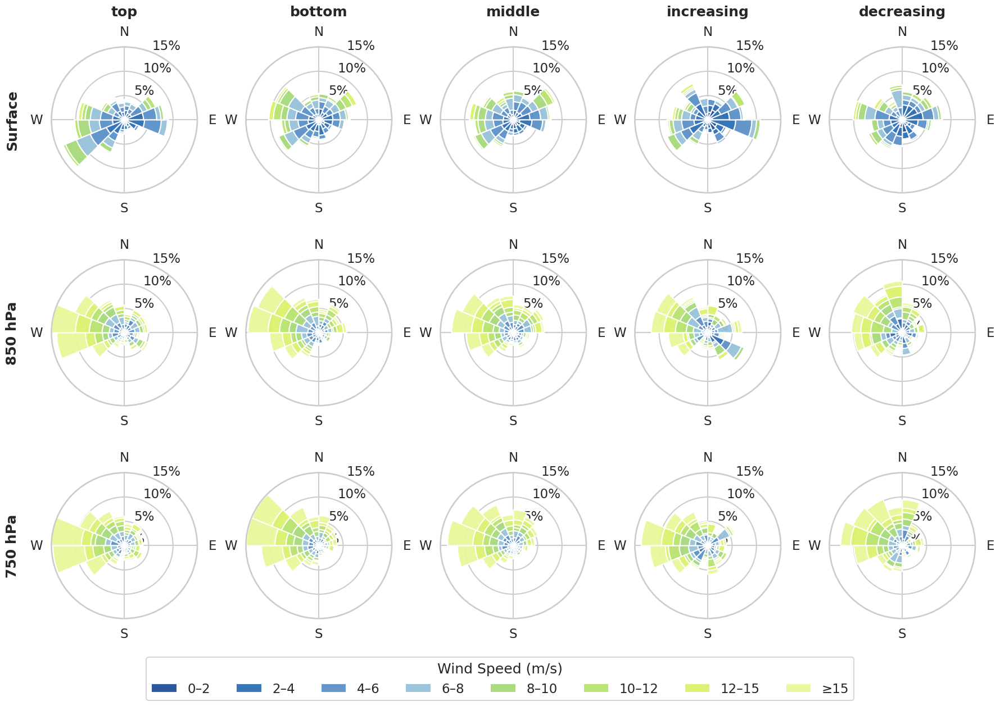

In [170]:
import numpy as np
import matplotlib.pyplot as plt

# —— 配置 ——
DIR_BINS = 16
CALM_THR = 0.5

# 8 档风速（单位 m/s）
SPEED_BINS   = np.array([0, 2, 4, 6, 8, 10, 12, 15, np.inf])
SPEED_LABELS = ["0–2", "2–4", "4–6", "6–8", "8–10", "10–12", "12–15", "≥15"]
SPEED_COLORS = ["#1f4e99", "#2e6fb5", "#5b91c9", "#97c1d9",
                "#a7d97a", "#b7e36c", "#d9f26c", "#e8f79a"]
BAR_EDGE = "white"
ALPHA = 0.95

# 统一半径范围与刻度：0–18%，刻度 0/6/12/18
R_MAX  = 15.0
YTK    = [0, 5, 10, 15]

def sector_hist_by_speed(dirs_deg, spd, dir_bins, speed_bins, calm_thr=0.5):
    calm_mask = spd < calm_thr
    n_total   = spd.size
    dirs = dirs_deg[~calm_mask]
    vv   = spd[~calm_mask]

    dir_edges = np.linspace(0, 360, dir_bins + 1)
    theta = np.deg2rad((dir_edges[:-1] + dir_edges[1:]) / 2.0)
    width = 2 * np.pi / dir_bins

    counts = np.zeros((dir_bins, len(speed_bins) - 1), dtype=float)
    if vv.size > 0:
        sector_idx = np.digitize(dirs, dir_edges, right=False) - 1
        sector_idx[sector_idx == dir_bins] = dir_bins - 1
        spd_idx = np.digitize(vv, speed_bins, right=False) - 1
        spd_idx = np.clip(spd_idx, 0, len(speed_bins) - 2)
        for si, bi in zip(sector_idx, spd_idx):
            counts[si, bi] += 1.0

    if n_total > 0:
        counts = counts / n_total * 100.0
    return counts, theta, width

def plot_stacked_wind_rose(ax, dirs_deg, spd, title=None):
    if dirs_deg.size == 0:
        ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes)
        ax.set_axis_off()
        return []

    counts, theta, width = sector_hist_by_speed(dirs_deg, spd, DIR_BINS, SPEED_BINS, CALM_THR)

    # 极坐标设置：北为0°、顺时针
    ax.set_theta_zero_location('N')
    ax.set_theta_direction(-1)

    # 把度数刻度替换为 N/E/S/W，并稍微往外推，避免与图形/标题重叠
    ax.set_thetagrids([0, 90, 180, 270], labels=['N', 'E', 'S', 'W'])  # 方位刻度
    # ax.tick_params(axis='x', pad=6)  # 往外推，避免与标题/图形重叠


    # 堆叠条形
    bottom = np.zeros(counts.shape[0], dtype=float)
    handles = []
    for k in range(counts.shape[1]):
        vals = counts[:, k]
        bars = ax.bar(theta, vals, width=width, bottom=bottom,
                      align='center', color=SPEED_COLORS[k],
                      edgecolor=BAR_EDGE, alpha=ALPHA)
        bottom += vals
        handles.append(bars[0])

    # 统一半径与刻度
    ax.set_ylim(0, R_MAX)
    ax.set_yticks(YTK)
    ax.set_yticklabels([f"{t}%" for t in YTK])

    # 不显示中心 calm 百分比（已移除）
    if title:
        ax.set_title(title, pad=40, fontweight='bold')  # pad 加大，避免与方位字母干扰
    return handles

# ——— 绘制 3×5 子图；关闭 constrained_layout 自己调边距，防重叠 ———
heights = ['surf', '850', '750']
fig, axes = plt.subplots(
    nrows=3, ncols=5, subplot_kw={'projection': 'polar'},
    figsize=(18, 12), constrained_layout=False
)

legend_handles = None
for i, h in enumerate(heights):
    for j, cat in enumerate(CAT_ORDER):
        ax = axes[i, j]
        dirs = np.asarray(DIRS_BY_LEVEL[h].get(cat, np.array([])))
        spd  = np.asarray(SPD_BY_LEVEL[h].get(cat,  np.array([])))
        handles = plot_stacked_wind_rose(ax, dirs, spd, title=(cat if i == 0 else None))
        if legend_handles is None and handles:
            legend_handles = handles
    # 行标题：向外留距离，避免与极坐标网格重叠
    axes[i, 0].set_ylabel(TITLE_MAP[h], labelpad=50, rotation=90, va='center',fontweight='bold')

# 顶/底/左右边距，给底部单行图例留空间
fig.subplots_adjust(left=0.05, right=0.98, top=0.90, bottom=0.12)

# —— 底部单行图例（不显示百分比）——
fig.legend(legend_handles, SPEED_LABELS,
           loc='lower center', bbox_to_anchor=(0.5, -0.07),
           ncol=len(SPEED_LABELS), title="Wind Speed (m/s)")
plt.tight_layout()

plt.show()
